# Air pollution analysis in India (EDA and Clustering [K Mean])

## Import Library

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb

import warnings
warnings.filterwarnings('ignore')

## Import Data

In [422]:
dt=pd.read_excel('Air Pollution Data.xlsx')

In [645]:
df=dt.copy()

## Features

In [6]:
# Stn_Code : Station code. A code is given to each station that recorded the data.
# Date: The date when the data was recorded.
# State: It represents the states whose air quality data is measured.
# location: It represents the city whose air quality data is measured.
# agency: Name of the agency that measured the data.
# type: The type of area where the measurement was made.
# so2: The amount of Sulphur Dioxide measured.
# no2: The amount of Nitrogen Dioxide measured
# rspm: Respirable Suspended Particulate Matter measured.
# spm: Suspended Particulate Matter measured.
# location_monitoring_station: It indicates the location of the monitoring area.
# pm_2.5: It represents the value of particulate matter measured that are 2.5 microns or less in diameter
# pm_10:  It represents the value of particulate matter measured  that is 10 micrometers or less in diameter

## Data Transformation

### Change Datatypes

In [649]:
df.dtypes

stn_code                               object
date                           datetime64[ns]
state                                  object
location                               object
agency                                 object
type                                   object
so2                                   float64
no2                                   float64
rspm                                  float64
spm                                   float64
location_monitoring_station            object
pm_10                                 float64
pm_2.5                                float64
Unnamed: 13                           float64
Unnamed: 14                           float64
dtype: object

### Drop unnecessary data

In [651]:
df=df.drop(['stn_code','agency','Unnamed: 13','Unnamed: 14','location_monitoring_station' ],axis=1 )

### Handle null value

In [655]:
n=df.isnull().sum()
n=n[n>0]
n

so2        11246
no2         6302
rspm        3919
spm       222422
pm_10      27680
pm_2.5     27679
dtype: int64

In [656]:
clm=n.index
for i in clm:
    df[i]=df.groupby(['state','location'])[i].transform(lambda x: x.mean() )

In [658]:
clm=n.index
for i in clm:
    df[i]=df.groupby('state')[i].transform(lambda x: x.mean() )

In [659]:
clm=n.index
for i in clm:
    df[i]=df[i].fillna(df[i].median())

In [661]:
n=df.isnull().sum()
n=n[n>0]
n

Series([], dtype: int64)

### Handle Duplicate Values

In [665]:
df.duplicated().sum()

50374

In [667]:
df.drop_duplicates(inplace=True)

### Extract date elements from  Date

In [671]:
df['Year']=df['date'].dt.year
df['Qtr']=df['date'].dt.quarter
df['Qtr']=[f'Qtr {i}' for i in df['Qtr'] ] 
df['Month']=df['date'].dt.month_name()
df['Day']=df['date'].dt.day_name()
df['IsWeekend']=np.where(df['Day'].isin(['Saturday','Sunday']),'Weekend','Weekday')
df['Seasons']=np.where(df['Month'].isin(['December','January','February']),'Winter',
            np.where(df['Month'].isin(['March','April']),'Spring',
                    np.where(df['Month'].isin(['May','June','July']),'Summer',
                      np.where(df['Month'].isin(['August','September']),'Rainy','Autumn') )))

### Assigning Region based on State

In [674]:
east_india = ['West Bengal', 'Odisha', 'Jharkhand', 'Bihar', 'Arunachal Pradesh', 
              'Assam', 'Meghalaya', 'Nagaland', 'Mizoram']

west_india = ['Maharashtra', 'Gujarat', 'Rajasthan', 'Goa', 
              'Dadra & Nagar Haveli','Daman & Diu']

north_india = [ 'Delhi', 'Punjab', 'Haryana', 'Uttarakhand', 'Uttar Pradesh', 
    'Himachal Pradesh', 'Jammu & Kashmir', 'Chandigarh', 'Madhya Pradesh', 
    'Chhattisgarh']

south_india = ['Telangana', 'Karnataka', 'Andhra Pradesh', 'Tamil Nadu', 'Kerala', 
    'Puducherry']

df['region']=np.where(df['state'].isin(east_india),'East',
                     np.where(df['state'].isin(west_india),'West',
                             np.where(df['state'].isin(north_india),'North','South' )))

### Assigning Inland or Costal based on State

In [677]:
Coastal= ['West Bengal', 'Maharashtra', 'Dadra & Nagar Haveli', 'Daman & Diu', 'Kerala', 'Karnataka', 
                 'Goa', 'Puducherry', 'Andhra Pradesh', 'Odisha', 'Gujarat', 'Tamil Nadu']
Inland = ['Telangana', 'Chhattisgarh', 'Delhi', 'Punjab', 'Uttarakhand', 'Jharkhand', 'Uttar Pradesh', 
                'Madhya Pradesh', 'Rajasthan', 'Himachal Pradesh', 'Jammu & Kashmir', 'Chandigarh', 'Haryana',
                'Nagaland', 'Mizoram', 'Arunachal Pradesh', 'Meghalaya', 'Assam', 'Bihar']

df['In_ct']= np.where(df['state'].isin(Coastal),'Coastal','Inland' )

### Leveling values in 'Type'

In [680]:
df['type']=df['type'].replace({'Residential and others':'Residential','Industrial Areas':'Industrial Area',
                              'Sensitive Areas':'Sensitive Area','Residential ':'Residential',
                              'Residential, Rural and other Areas':'Rural and other Areas'} )

### Outliers Treatment

In [683]:
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']
df[clm].describe(percentiles=[0.01,0.02,0.05,0.95,0.98,0.99]).T.iloc[:,3:]

,min,1%,2%,5%,50%,95%,98%,99%,max
so2,2.001198,2.005441,2.057449,2.388853,9.400984,16.813836,21.702860,21.702860,21.704771
no2,5.469697,6.760480,10.437620,12.587885,22.611837,57.824044,57.824044,57.824044,64.116435
rspm,38.942033,44.152100,48.747038,48.747038,103.069802,178.798915,178.798915,178.798915,227.920235
spm,48.889923,48.889923,48.889923,65.493796,208.563767,397.329427,397.329427,397.329427,487.475645
pm_10,122.503268,123.236224,123.236224,123.572222,125.076577,126.309315,127.563041,127.964041,129.176411
pm_2.5,55.305307,58.980628,59.002240,59.304135,60.038234,60.375815,60.403602,60.403602,63.684659


In [685]:
for i in clm:
    q1=np.percentile(df[i],25)
    q3=np.percentile(df[i],75)
    iqr=q3-q1
    bmin=q1-(iqr*1.5)
    bmax=q3+(iqr*1.5)
    df[i]=np.where(df[i]>bmax,bmax,df[i])
    df[i]=np.where(df[i]<bmin,bmin,df[i])


In [687]:
df[clm].describe(percentiles=[0.01,0.02,0.05,0.95,0.98,0.99]).T.iloc[:,3:]

,min,1%,2%,5%,50%,95%,98%,99%,max
so2,2.001198,2.005441,2.057449,2.388853,9.400984,16.813836,21.702860,21.702860,21.704771
no2,5.469697,6.760480,10.437620,12.587885,22.611837,51.369083,51.369083,51.369083,51.369083
rspm,38.942033,44.152100,48.747038,48.747038,103.069802,178.798915,178.798915,178.798915,184.653423
spm,57.251667,57.251667,57.251667,65.493796,208.563767,344.184083,344.184083,344.184083,344.184083
pm_10,123.495189,123.495189,123.495189,123.572222,125.076577,126.309315,126.721206,126.721206,126.721206
pm_2.5,58.854401,58.980628,59.002240,59.304135,60.038234,60.375815,60.403602,60.403602,60.839996


## Analysis

### Note:- Most of the analysis is done Year Based ( data analysed per year)

### Analytical Analysis

#### 1. Date & Time-Based Analysis 

In [36]:
# What is the average concentration of PM2.5 for each year?

pm_yr=round(df.groupby(['Year'])['pm_2.5'].mean(),3)
pm_yr

Year
2018    59.920
2019    59.903
2020    59.969
2021    59.882
2022    59.920
2023    59.898
2024    59.903
Name: pm_2.5, dtype: float64

In [37]:
# How does the PM10 concentration vary across different months?
yr=df['Year'].unique()
print('Yearwise PM10 concentration based on different month is : \n')
for i in yr:
    y_pm=df[df['Year']==i]
    yt=y_pm.groupby('Month')['pm_10'].mean()
    print(f'For Year {i}')
    print(round(yt,3))
    print('\n')


Yearwise PM10 concentration based on different month is : 

For Year 2018
Month
April        125.084
August       125.113
December     125.140
February     125.105
January      125.115
July         125.135
June         125.112
March        125.100
May          125.110
November     125.144
October      125.123
September    125.136
Name: pm_10, dtype: float64


For Year 2019
Month
April        125.083
August       125.078
December     125.102
February     125.116
January      125.136
July         125.085
June         125.110
March        125.147
May          125.108
November     125.106
October      125.110
September    125.100
Name: pm_10, dtype: float64


For Year 2020
Month
April        125.123
August       125.137
December     125.130
February     125.114
January      125.133
July         125.103
June         125.116
March        125.132
May          125.115
November     125.128
October      125.136
September    125.107
Name: pm_10, dtype: float64


For Year 2021
Month
April        1

In [38]:
# Which month recorded the highest average NO2 levels in the last 5 years

yr=list(df['Year'].unique())
yr.sort(reverse=True)
yr=yr[:5]


print('Yearwise NO2 concentration in month is : \n')
for i in yr:
    y_pm=df[df['Year']==i]
    yt=y_pm.groupby('Month')['no2'].mean().reset_index()
    
    yt_m=yt['no2'].max()
    ind=yt[yt['no2'] == yt_m].index
    
    print(f'For Year {i}')
    print(yt['Month'][ind].values,':',yt_m)
    print('\n')


Yearwise NO2 concentration in month is : 

For Year 2024
['May'] : 24.23113858198343


For Year 2023
['December'] : 24.310947235691863


For Year 2022
['January'] : 23.28594144002634


For Year 2021
['November'] : 24.61831883045807


For Year 2020
['February'] : 26.22645439923223




In [39]:
# What is the pattern (min and max) of SO2 emissions over the last 5 years (monthwise)

yr=list(df['Year'].unique())
yr.sort(reverse=True)
yr=yr[:5]


print('Yearwise NO2 concentration in month is : \n')
for i in yr:
    y_pm=df[df['Year']==i]
    yt=y_pm.groupby('Month')['no2'].mean().reset_index()
    
    yt_mx=yt['no2'].max()
    ind_mx=yt[yt['no2'] == yt_mx].index

    yt_mn=yt['no2'].min()
    ind_mn=yt[yt['no2'] == yt_mn].index
    
    print(f'For Year {i}')
    print('Max Value => ',yt['Month'][ind_mx].values,':',yt_mx)
    print('Min Value => ',yt['Month'][ind_mn].values,':',yt_mn)
    print('Trend Pattern:',yt_mx-yt_mn)
    print('\n')


Yearwise NO2 concentration in month is : 

For Year 2024
Max Value =>  ['May'] : 24.23113858198343
Min Value =>  ['August'] : 23.791477775844697
Trend Pattern: 0.4396608061387326


For Year 2023
Max Value =>  ['December'] : 24.310947235691863
Min Value =>  ['April'] : 23.532704135572423
Trend Pattern: 0.7782431001194396


For Year 2022
Max Value =>  ['January'] : 23.28594144002634
Min Value =>  ['December'] : 22.206983759672774
Trend Pattern: 1.0789576803535645


For Year 2021
Max Value =>  ['November'] : 24.61831883045807
Min Value =>  ['February'] : 23.54572836810553
Trend Pattern: 1.0725904623525402


For Year 2020
Max Value =>  ['February'] : 26.22645439923223
Min Value =>  ['January'] : 25.70538159906043
Trend Pattern: 0.521072800171801




In [40]:
# What is the average pollution level (PM2.5) on weekends vs. weekdays (yearwise)

wk_pm= df.groupby(['Year','IsWeekend'])['pm_2.5'].mean()
wk_pm

Year  IsWeekend
2018  Weekday      59.920905
      Weekend      59.918544
2019  Weekday      59.902577
      Weekend      59.902471
2020  Weekday      59.968709
      Weekend      59.970865
2021  Weekday      59.879600
      Weekend      59.886850
2022  Weekday      59.922687
      Weekend      59.913628
2023  Weekday      59.900127
      Weekend      59.894433
2024  Weekday      59.903383
      Weekend      59.901080
Name: pm_2.5, dtype: float64

In [41]:
#  How do pollution level (spm and rspm) change seasonwise 

pd.pivot_table(data=df,index=['Year','Seasons'],values=['spm','rspm'],
               aggfunc=['min','mean','max'])

min                   mean                     max  \
                   rspm        spm        rspm         spm        rspm   
Year Seasons                                                             
2018 Autumn   38.942033  57.251667  113.860821  220.083648  184.653423   
     Rainy    38.942033  57.251667  112.804932  217.655551  184.653423   
     Spring   38.942033  57.251667  112.596780  216.160015  184.653423   
     Summer   38.942033  57.251667  112.322448  215.825104  184.653423   
     Winter   38.942033  57.251667  114.162763  220.121664  184.653423   
2019 Autumn   38.942033  57.251667  110.886538  212.064992  178.798915   
     Rainy    38.942033  57.251667  110.806525  210.883470  178.798915   
     Spring   38.942033  57.251667  110.529539  211.513770  178.798915   
     Summer   38.942033  57.251667  110.982905  211.644959  178.798915   
     Winter   38.942033  57.251667  110.825109  211.553525  178.798915   
2020 Autumn   38.942033  57.251667  111.928257  212.803525  184.653423   
     Rainy    38.942033  57.251667  111.540881  211.126480  184.653423   
     Spring   38.942033  57.251667  112.907616  213.613505  184.653423   
     Summer   38.942033  57.251667  112.309276  211.704052  184.653423   
     Winter   38.942033  57.251667  113.279844  214.515093  184.653423   
2021 Autumn   38.942033  57.251667  109.138510  213.255359  184.653423   
     Rainy    38.942033  57.251667  108.561077  211.640332  184.653423   
     Spring   38.942033  57.251667  109.331184  210.082381  184.653423   
     Summer   38.942033  57.251667  109.387509  211.540662  184.653423   
     Winter   38.942033  57.251667  108.051750  209.249869  184.653423   
2022 Autumn   38.942033  57.251667  105.051241  201.694307  184.653423   
     Rainy    38.942033  57.251667  104.664564  203.112305  184.653423   
     Spring   38.942033  57.251667  105.095071  203.880327  184.653423   
     Summer   38.942033  57.251667  105.141128  202.326094  184.653423   
     Winter   38.942033  57.251667  105.665711  204.124527  184.653423   
2023 Autumn   38.942033  57.251667  106.096382  208.501244  184.653423   
     Rainy    38.942033  57.251667  105.524474  206.516263  184.653423   
     Spring   38.942033  57.251667  104.749872  204.920865  184.653423   
     Summer   38.942033  57.251667  105.544739  205.645826  184.653423   
     Winter   38.942033  57.251667  106.566803  208.061971  184.653423   
2024 Autumn   38.942033  57.251667  104.570362  204.658495  184.653423   
     Rainy    38.942033  57.251667  106.666037  206.191886  184.653423   
     Spring   38.942033  57.251667  106.504303  205.750993  184.653423   
     Summer   38.942033  57.251667  107.536110  208.178345  184.653423   
     Winter   38.942033  57.251667  105.813347  203.918566  184.653423   

                          
                     spm  
Year Seasons              
2018 Autumn   344.184083  
     Rainy    344.184083  
     Spring   344.184083  
     Summer   344.184083  
     Winter   344.184083  
2019 Autumn   344.184083  
     Rainy    344.184083  
     Spring   344.184083  
     Summer   344.184083  
     Winter   344.184083  
2020 Autumn   344.184083  
     Rainy    344.184083  
     Spring   344.184083  
     Summer   344.184083  
     Winter   344.184083  
2021 Autumn   344.184083  
     Rainy    344.184083  
     Spring   344.184083  
     Summer   344.184083  
     Winter   344.184083  
2022 Autumn   344.184083  
     Rainy    344.184083  
     Spring   344.184083  
     Summer   344.184083  
     Winter   344.184083  
2023 Autumn   344.184083  
     Rainy    344.184083  
     Spring   344.184083  
     Summer   344.184083  
     Winter   344.184083  
2024 Autumn   344.184083  
     Rainy    344.184083  
     Spring   344.184083  
     Summer   344.184083  
     Winter   344.184083

In [42]:
# What is the most polluted season based on average PM10 levels

yr=list(df['Year'].unique())

print('Yearwise PM 10 concentration in seasons is : \n')
for i in yr:
    y_pm=df[df['Year']==i]
    yt=y_pm.groupby('Seasons')['pm_10'].mean().reset_index()
    
    yt_m=yt['pm_10'].max()
    ind=yt[yt['pm_10'] == yt_m].index
    
    print(f'For Year {i}')
    print(yt['Seasons'][ind].values,':',yt_m)
    print('\n')


Yearwise PM 10 concentration in seasons is : 

For Year 2018
['Autumn'] : 125.1327322857968


For Year 2019
['Winter'] : 125.11764841498767


For Year 2020
['Autumn'] : 125.1320269081851


For Year 2021
['Winter'] : 125.07046887449332


For Year 2022
['Rainy'] : 125.03958809941166


For Year 2023
['Spring'] : 125.14453517442385


For Year 2024
['Spring'] : 125.09727459683133




In [43]:
# How do pollution levels vary by quarter (Qtr) over different years

clm=[ 'so2', 'no2', 'rspm', 'spm','pm_10', 'pm_2.5']
df.groupby(['Year','Qtr'])[clm].mean()


so2        no2        rspm         spm       pm_10  \
Year Qtr                                                               
2018 Qtr 1  10.042407  24.733740  113.752967  218.658437  125.106629   
     Qtr 2   9.905100  24.650958  111.950311  214.830922  125.101815   
     Qtr 3   9.916978  24.672666  112.752579  217.385249  125.128486   
     Qtr 4  10.000703  24.987181  114.205828  221.089460  125.134941   
2019 Qtr 1  10.213696  25.259189  110.462600  211.149094  125.133191   
     Qtr 2  10.221363  25.256673  110.981266  212.168047  125.100345   
     Qtr 3  10.274695  25.283490  110.903409  211.024069  125.087978   
     Qtr 4  10.236924  25.215544  110.924589  211.816107  125.105965   
2020 Qtr 1  10.556472  25.904817  112.986155  213.726263  125.127039   
     Qtr 2  10.574816  25.911889  113.133958  213.555586  125.117951   
     Qtr 3  10.489280  25.862596  111.422735  210.591891  125.115228   
     Qtr 4  10.600898  26.061289  112.303817  213.355751  125.131439   
2021 Qtr 1  10.191062  23.825383  108.240926  208.319960  125.062448   
     Qtr 2  10.111945  24.016285  109.472788  211.104555  125.043922   
     Qtr 3  10.058557  24.213037  108.680713  211.684431  125.046466   
     Qtr 4  10.086368  24.525995  109.105841  213.064254  125.060365   
2022 Qtr 1   9.625079  23.073672  105.949337  205.033690  125.029045   
     Qtr 2   9.520309  22.436187  105.270795  202.851928  125.022956   
     Qtr 3   9.542363  22.497745  105.000529  202.833128  125.030227   
     Qtr 4   9.561204  22.431243  104.469685  201.564889  125.038377   
2023 Qtr 1   9.396524  23.776028  105.297913  205.863589  125.141572   
     Qtr 2   9.421052  23.693582  105.542200  205.722115  125.143647   
     Qtr 3   9.433932  23.889592  105.468355  206.104582  125.130763   
     Qtr 4   9.432651  24.066674  106.637563  209.185415  125.136628   
2024 Qtr 1   9.791321  23.927599  105.347561  202.155419  125.123132   
     Qtr 2   9.617797  24.114971  108.022181  209.252321  125.069992   
     Qtr 3   9.333052  23.926141  106.536120  206.113288  125.076990   
     Qtr 4   9.339838  24.012564  105.329434  205.791918  125.068814   

               pm_2.5  
Year Qtr               
2018 Qtr 1  59.921616  
     Qtr 2  59.916230  
     Qtr 3  59.919627  
     Qtr 4  59.923742  
2019 Qtr 1  59.906730  
     Qtr 2  59.899091  
     Qtr 3  59.900801  
     Qtr 4  59.903787  
2020 Qtr 1  59.963195  
     Qtr 2  59.962023  
     Qtr 3  59.974111  
     Qtr 4  59.978059  
2021 Qtr 1  59.890225  
     Qtr 2  59.884000  
     Qtr 3  59.877899  
     Qtr 4  59.874567  
2022 Qtr 1  59.913675  
     Qtr 2  59.911155  
     Qtr 3  59.924472  
     Qtr 4  59.929724  
2023 Qtr 1  59.906559  
     Qtr 2  59.904025  
     Qtr 3  59.892043  
     Qtr 4  59.890672  
2024 Qtr 1  59.920555  
     Qtr 2  59.884708  
     Qtr 3  59.897772  
     Qtr 4  59.906517

In [44]:
# Which  week of the month  has the highest pollution (rspm) levels  on average

yr=list(df['Year'].unique())

print('Yearwise PM 10 concentration in seasons is : \n')
for i in yr:
    y_pm=df[df['Year']==i]
    yt=y_pm.groupby(['Month','Day'])['rspm'].mean().reset_index()
    
    yt_m=yt['rspm'].max()
    ind=yt[yt['rspm'] == yt_m].index
    
    print(f'For Year {i}')
    print('Month :',yt['Month'][ind].values)
    print('Day :',yt['Day'][ind].values)
    print('RPSM :',yt_m)
    print('\n')


Yearwise PM 10 concentration in seasons is : 

For Year 2018
Month : ['December']
Day : ['Thursday']
RPSM : 118.02152752362736


For Year 2019
Month : ['September']
Day : ['Wednesday']
RPSM : 115.97236864610807


For Year 2020
Month : ['May']
Day : ['Wednesday']
RPSM : 119.12832097518542


For Year 2021
Month : ['March']
Day : ['Thursday']
RPSM : 114.16634796297747


For Year 2022
Month : ['September']
Day : ['Friday']
RPSM : 112.40087807292554


For Year 2023
Month : ['August']
Day : ['Wednesday']
RPSM : 111.77079642918163


For Year 2024
Month : ['May']
Day : ['Thursday']
RPSM : 112.899432467575




In [45]:
# Is there a monthly pattern in the increase or decrease of SO2 levels

yr=list(df['Year'].unique())
yr.sort(reverse=True)

print('Yearwise SO2 concentration in month is : \n')
for i in yr:
    y_pm=df[df['Year']==i]
    yt=y_pm.groupby('Month')['so2'].mean().reset_index()
    
    yt_mx=yt['so2'].max()
    ind_mx=yt[yt['so2'] == yt_mx].index

    yt_mn=yt['so2'].min()
    ind_mn=yt[yt['so2'] == yt_mn].index
    
    print(f'For Year {i}')
    print('Max Value => ',yt['Month'][ind_mx].values,':',yt_mx)
    print('Min Value => ',yt['Month'][ind_mn].values,':',yt_mn)
    print('\n')

Yearwise SO2 concentration in month is : 

For Year 2024
Max Value =>  ['March'] : 9.867958540017794
Min Value =>  ['September'] : 9.193618568467388


For Year 2023
Max Value =>  ['December'] : 9.55664918967647
Min Value =>  ['November'] : 9.308183830326504


For Year 2022
Max Value =>  ['February'] : 9.692482952195583
Min Value =>  ['June'] : 9.421413537234994


For Year 2021
Max Value =>  ['January'] : 10.281999330229153
Min Value =>  ['December'] : 9.984131074130481


For Year 2020
Max Value =>  ['November'] : 10.683154598575673
Min Value =>  ['September'] : 10.433472817833222


For Year 2019
Max Value =>  ['November'] : 10.360466859081601
Min Value =>  ['October'] : 10.08802820372236


For Year 2018
Max Value =>  ['November'] : 10.240282851037435
Min Value =>  ['October'] : 9.814093652724877




In [46]:
# What is the impact of rainy seasons on air pollution levels in every year

clm=[  'so2', 'no2', 'rspm', 'spm','pm_10', 'pm_2.5']
df[df['Seasons']=='Rainy'].groupby(['Year','Month'])[clm].mean()

so2        no2        rspm         spm       pm_10  \
Year Month                                                                 
2018 August      9.903672  24.585765  111.940385  216.455060  125.113310   
     September   9.934411  24.764334  113.652432  218.832372  125.136455   
2019 August     10.262348  25.314202  110.707274  210.980372  125.078068   
     September  10.320356  25.275218  110.904837  210.787486  125.100330   
2020 August     10.592417  25.983853  111.082235  211.015649  125.137232   
     September  10.433473  25.808830  111.979201  211.232400  125.107196   
2021 August     10.022436  24.225647  107.806376  210.753125  125.050068   
     September  10.154501  24.275199  109.265899  212.468903  125.052542   
2022 August      9.469996  22.409603  104.171479  200.761694  125.028381   
     September   9.643065  22.626797  105.167432  205.509545  125.051018   
2023 August      9.539733  24.115268  106.623782  206.871479  125.136852   
     September   9.310151  23.762966  104.504065  206.186542  125.122749   
2024 August      9.354739  23.791478  105.912922  204.050744  125.085651   
     September   9.193619  23.958735  107.448343  208.416019  125.068878   

                   pm_2.5  
Year Month                 
2018 August     59.919261  
     September  59.917565  
2019 August     59.901387  
     September  59.903302  
2020 August     59.982090  
     September  59.973167  
2021 August     59.878919  
     September  59.884506  
2022 August     59.921983  
     September  59.928320  
2023 August     59.901509  
     September  59.872241  
2024 August     59.899100  
     September  59.900583

In [47]:
# Which quarter experiences the largest increase in pollution (spm) year over year?

yr=list(df['Year'].unique())
yr.sort(reverse=True)

print('Yearwise maximum SPM concentration in Quarter is : \n')
for i in yr:
    y_pm=df[df['Year']==i]
    yt=y_pm.groupby('Qtr')['spm'].mean().reset_index()
    
    yt_mx=yt['spm'].max()
    ind_mx=yt[yt['spm'] == yt_mx].index

    print(f'For Year {i}')
    print(yt['Qtr'][ind_mx].values,':',yt_mx)
    print('\n')


Yearwise maximum SPM concentration in Quarter is : 

For Year 2024
['Qtr 2'] : 209.2523210619499


For Year 2023
['Qtr 4'] : 209.18541464147896


For Year 2022
['Qtr 1'] : 205.03369004453154


For Year 2021
['Qtr 4'] : 213.0642540614755


For Year 2020
['Qtr 1'] : 213.72626290977678


For Year 2019
['Qtr 2'] : 212.16804738125987


For Year 2018
['Qtr 4'] : 221.089460134852




In [48]:
# How do pollution levels (pm 10) differ between winter and summer months 

wn=df[df['Seasons']=='Winter']
sm=df[df['Seasons']=='Summer']

s_wn=wn.groupby('Year')['pm_10'].mean()
s_sm=sm.groupby('Year')['pm_10'].mean()

ws=pd.DataFrame({'Winter':s_wn.values ,'Summer':s_sm.values},index=s_wn.index )
ws['Diff']=ws['Summer']-ws['Winter']
ws

,Winter,Summer,Diff
Year,,,
2018,125.118169,125.118974,0.000805
2019,125.117648,125.101042,-0.016607
2020,125.126381,125.111106,-0.015275
2021,125.070469,125.043159,-0.027310
2022,125.026721,125.021322,-0.005399
2023,125.136994,125.140753,0.003758
2024,125.093383,125.075719,-0.017664


In [49]:
# How does pollution change on 1st and 2nd 1st half

# 1st Half = [Qtr2 and Qtr3]
# 2nd Half = [Qtr1 and Qtr4]

clm=[  'so2', 'no2', 'rspm', 'spm','pm_10', 'pm_2.5']

q1=df[df['Qtr'].isin(['Qtr 2','Qtr 3'])]
q2=df[df['Qtr'].isin(['Qtr 1','Qtr 4'])]

print(q1.groupby('Year')[clm].mean())
print('\n')
print(q2.groupby('Year')[clm].mean())

            so2        no2        rspm         spm       pm_10     pm_2.5
Year                                                                     
2018   9.910902  24.661561  112.342188  216.078611  125.114843  59.917889
2019  10.248645  25.270391  110.941438  211.582843  125.094019  59.899966
2020  10.532216  25.887339  112.281705  212.079554  125.116595  59.968043
2021  10.086318  24.110729  109.092579  211.382905  125.045143  59.881071
2022   9.531055  22.466182  105.139103  202.842767  125.026499  59.917644
2023   9.427322  23.789004  105.506251  205.908308  125.137375  59.898192
2024   9.478491  24.022590  107.295156  207.716614  125.073415  59.891099


            so2        no2        rspm         spm       pm_10     pm_2.5
Year                                                                     
2018  10.023396  24.849274  113.959409  219.766648  125.119535  59.922585
2019  10.225565  25.236887  110.698676  211.489937  125.119279  59.905226
2020  10.579213  25.984913  112.6368

In [50]:
# Do pollution levels (PM 2.5) tend to increase during the weekend 

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    wd=df[(df['Year']==i)&(df['IsWeekend']=='Weekday')].groupby(['IsWeekend'])['pm_2.5'].mean()
    wn=df[(df['Year']==i)&(df['IsWeekend']=='Weekend')].groupby(['IsWeekend'])['pm_2.5'].mean()
    
    print(f'For year {i}')
    print('Weekday: ',wd.values)
    print('Weekend: ',wn.values)
    print('Diff: ',wd.values-wn.values)
    

    if  wd.values<wn.values:
        print('Tends to incresae in Weekend')
    else:
        print('Tends to incresae in Weekdays')
    print('\n')

For year 2024
Weekday:  [59.90338317]
Weekend:  [59.90107998]
Diff:  [0.00230318]
Tends to incresae in Weekdays


For year 2023
Weekday:  [59.90012653]
Weekend:  [59.89443297]
Diff:  [0.00569356]
Tends to incresae in Weekdays


For year 2022
Weekday:  [59.92268709]
Weekend:  [59.91362788]
Diff:  [0.00905921]
Tends to incresae in Weekdays


For year 2021
Weekday:  [59.87959951]
Weekend:  [59.88684954]
Diff:  [-0.00725002]
Tends to incresae in Weekend


For year 2020
Weekday:  [59.96870901]
Weekend:  [59.97086546]
Diff:  [-0.00215644]
Tends to incresae in Weekend


For year 2019
Weekday:  [59.90257671]
Weekend:  [59.90247087]
Diff:  [0.00010584]
Tends to incresae in Weekdays


For year 2018
Weekday:  [59.92090536]
Weekend:  [59.91854423]
Diff:  [0.00236113]
Tends to incresae in Weekdays




In [51]:
# Is there a significant difference in SO2 between weekdays and weekends

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    wd=df[(df['Year']==i)&(df['IsWeekend']=='Weekday')].groupby(['IsWeekend'])['so2'].mean()
    wn=df[(df['Year']==i)&(df['IsWeekend']=='Weekend')].groupby(['IsWeekend'])['so2'].mean()
    
    print(f'For year {i}')
    print('Weekday: ',wd.values)
    print('Weekend: ',wn.values)
    print('Diff: ',wd.values-wn.values)

    print('\n')


For year 2024
Weekday:  [9.58522938]
Weekend:  [9.42052791]
Diff:  [0.16470147]


For year 2023
Weekday:  [9.49339993]
Weekend:  [9.2618872]
Diff:  [0.23151273]


For year 2022
Weekday:  [9.61126145]
Weekend:  [9.4580756]
Diff:  [0.15318585]


For year 2021
Weekday:  [10.09809132]
Weekend:  [10.14772139]
Diff:  [-0.04963008]


For year 2020
Weekday:  [10.5876708]
Weekend:  [10.48853026]
Diff:  [0.09914054]


For year 2019
Weekday:  [10.26540635]
Weekend:  [10.175688]
Diff:  [0.08971835]


For year 2018
Weekday:  [10.0037414]
Weekend:  [9.88184222]
Diff:  [0.12189917]




In [52]:
# Are pollution levels (NO2 ) higher at the start or end of the month

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    jn=df[(df['Year']==i)&(df['Month']=='January')].groupby(['Month'])['no2'].mean()
    dc=df[(df['Year']==i)&(df['Month']=='December')].groupby(['Month'])['no2'].mean()
    
    print(f'For year {i}')
    print('January: ',jn.values)
    print('December: ',dc.values)
    print('Diff: ',jn.values-dc.values)

    if jn.values>dc.values:
        print('Start Month has high pollution level')
    else:
        print('End Month has high pollution level')

    print('\n')



For year 2024
January:  [23.88306731]
December:  [24.01642057]
Diff:  [-0.13335326]
End Month has high pollution level


For year 2023
January:  [23.87370668]
December:  [24.31094724]
Diff:  [-0.43724056]
End Month has high pollution level


For year 2022
January:  [23.28594144]
December:  [22.20698376]
Diff:  [1.07895768]
Start Month has high pollution level


For year 2021
January:  [23.95467838]
December:  [24.46654234]
Diff:  [-0.51186396]
End Month has high pollution level


For year 2020
January:  [25.7053816]
December:  [26.18095229]
Diff:  [-0.47557069]
End Month has high pollution level


For year 2019
January:  [25.28431816]
December:  [25.12302977]
Diff:  [0.16128839]
Start Month has high pollution level


For year 2018
January:  [24.72557542]
December:  [25.43430571]
Diff:  [-0.70873029]
End Month has high pollution level




In [53]:
# Which three months contribute the most to annual rspm levels in each year

yr=list(df['Year'].unique())
yr.sort(reverse=True)

print('Top 3 months contribute the most to annual rspm levels in each year are: ')
for i in yr:
    yt=df[df['Year']==i]
    print(f'For year {i}')
    yt_rm=yt.groupby(['Month'])['rspm'].mean()
    yt_rm_c=yt_rm.sort_values(ascending=False)[:3]
    print(yt_rm_c)
    print('\n')

Top 3 months contribute the most to annual rspm levels in each year are: 
For year 2024
Month
May      108.616893
April    107.765575
June     107.673835
Name: rspm, dtype: float64


For year 2023
Month
December    107.861668
May         107.027374
August      106.623782
Name: rspm, dtype: float64


For year 2022
Month
January     107.390963
February    106.542998
April       106.103850
Name: rspm, dtype: float64


For year 2021
Month
June         110.118418
March        109.469392
September    109.265899
Name: rspm, dtype: float64


For year 2020
Month
February    113.722101
April       113.641226
May         113.449519
Name: rspm, dtype: float64


For year 2019
Month
November    111.802321
May         111.330277
July        111.098180
Name: rspm, dtype: float64


For year 2018
Month
January     115.072544
December    115.067542
November    114.453462
Name: rspm, dtype: float64




#### 2. State & Location-Based Analysis

In [55]:
# Which state has the highest average PM 2.5 concentration in different year

yr=list(df['Year'].unique())
yr.sort(reverse=True)

print('Yearwise maximum SPM concentration in month is : \n')
for i in yr:
    y_pm=df[df['Year']==i]
    yt=y_pm.groupby('state')['pm_2.5'].mean().reset_index()
    
    yt_mx=yt['pm_2.5'].max()
    ind_mx=yt[yt['pm_2.5'] == yt_mx].index

    print(f'For Year {i}')
    print(yt['state'][ind_mx].values,':',yt_mx)
    print('\n')

Yearwise maximum SPM concentration in month is : 

For Year 2024
['Daman & Diu'] : 60.839995900587084


For Year 2023
['Gujarat'] : 60.40360237222638


For Year 2022
['Nagaland'] : 60.43026162180507


For Year 2021
['Daman & Diu'] : 60.839995900587084


For Year 2020
['Daman & Diu'] : 60.839995900587084


For Year 2019
['Daman & Diu'] : 60.83999590058708


For Year 2018
['Daman & Diu'] : 60.839995900587084




In [56]:
# How does air pollution so2 differ between north and south locations

yr=list(df['Year'].unique())
yr.sort(reverse=True)

print('SO2 feature for north and south:')
for i in yr:
    nt=df[(df['Year']==i)&(df['region']=='North')].groupby(['region'])['so2'].mean()
    st=df[(df['Year']==i)&(df['region']=='South')].groupby(['region'])['so2'].mean()
    
    print(f'For year {i}')
    print('North: ',nt.values)
    print('South: ',st.values)
    print('Diff: ',nt.values-st.values)

    print('\n')


SO2 feature for north and south:
For year 2024
North:  [8.97952201]
South:  [7.19743191]
Diff:  [1.7820901]


For year 2023
North:  [8.30354056]
South:  [7.34904475]
Diff:  [0.95449581]


For year 2022
North:  [8.91265376]
South:  [7.46521046]
Diff:  [1.44744329]


For year 2021
North:  [8.63277558]
South:  [7.16089781]
Diff:  [1.47187777]


For year 2020
North:  [8.84450697]
South:  [7.23899719]
Diff:  [1.60550978]


For year 2019
North:  [8.93870022]
South:  [6.95961574]
Diff:  [1.97908449]


For year 2018
North:  [8.56614938]
South:  [7.43738582]
Diff:  [1.12876356]




In [57]:
# What are the top 5 most polluted (PM 10 )locations over the past decade

yr=list(df['Year'].unique())
yr.sort(reverse=True)

print('Top 5 Location contribute the most to annual rspm levels in each year are: ')
for i in yr:
    yt=df[df['Year']==i]
    print(f'For year {i}')
    yt_rm=yt.groupby(['state','location'])['pm_10'].mean()
    yt_rm_c=yt_rm.sort_values(ascending=False)[:5]
    print(yt_rm_c)
    print('\n')

Top 5 Location contribute the most to annual rspm levels in each year are: 
For year 2024
state         location   
Chhattisgarh  Bilaspur       126.721206
              Raipur         126.721206
              Bhilai         126.721206
Puducherry    Pondicherry    126.721206
              Karaikal       126.721206
Name: pm_10, dtype: float64


For year 2023
state            location   
Chhattisgarh     Bhilai         126.721206
                 Raipur         126.721206
Puducherry       Pondicherry    126.721206
Jammu & Kashmir  Jammu          126.721206
Chhattisgarh     Bilaspur       126.721206
Name: pm_10, dtype: float64


For year 2022
state            location   
Haryana          Faridabad      126.721206
Jammu & Kashmir  Jammu          126.721206
Puducherry       Pondicherry    126.721206
Chhattisgarh     Raipur         126.721206
                 Bilaspur       126.721206
Name: pm_10, dtype: float64


For year 2021
state            location   
Chhattisgarh     Korba          126

In [58]:
# Which states show the largest improvement (PM 2.5) in air quality

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    st=yt.groupby(['state'])['pm_2.5'].mean()
    st=st.sort_values()
    print(f'For year {i}')
    print(st.index[0],': ',st.values[0])
    print('\n')

For year 2024
Arunachal Pradesh :  58.85440084841319


For year 2023
Arunachal Pradesh :  58.85440084841319


For year 2022
Chandigarh :  58.98062792251168


For year 2021
Bihar :  58.85440084841319


For year 2020
Dadra & Nagar Haveli :  58.854400848413185


For year 2019
Bihar :  58.85440084841319


For year 2018
Bihar :  58.85440084841319




In [59]:
# How do pollution levels (SPM) differ between coastal and inland states

yr=list(df['Year'].unique())
yr.sort(reverse=True)

print('SPM feature for coastal and inland:')
for i in yr:
    ct=df[(df['Year']==i)&(df['In_ct']=='Coastal')].groupby(['In_ct'])['spm'].mean()
    il=df[(df['Year']==i)&(df['In_ct']=='Inland')].groupby(['In_ct'])['spm'].mean()
    
    print(f'For year {i}')
    print('Central: ',ct.values)
    print('Inland: ',il.values)
    print('Diff: ',il.values-ct.values)

    print('\n')

SPM feature for coastal and inland:
For year 2024
Central:  [167.69235918]
Inland:  [247.19393307]
Diff:  [79.50157389]


For year 2023
Central:  [172.77056647]
Inland:  [243.42756618]
Diff:  [70.6569997]


For year 2022
Central:  [164.42771784]
Inland:  [247.95014262]
Diff:  [83.52242477]


For year 2021
Central:  [170.97477141]
Inland:  [254.41221258]
Diff:  [83.43744117]


For year 2020
Central:  [166.16064871]
Inland:  [265.52115688]
Diff:  [99.36050817]


For year 2019
Central:  [169.52398574]
Inland:  [256.65437534]
Diff:  [87.1303896]


For year 2018
Central:  [170.83067318]
Inland:  [264.80022987]
Diff:  [93.96955669]




In [60]:
# What is the  statewise  maximum pollution pollutants 

clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']
df.groupby('state')[clm].max()

,so2,no2,rspm,spm,pm_10,pm_2.5
state,,,,,,
Andhra Pradesh,6.986956,18.712079,76.016814,198.635517,125.203789,59.836784
Arunachal Pradesh,3.181818,5.469697,76.726263,208.563767,123.913095,58.854401
Assam,6.767576,14.611919,93.405055,189.624025,125.076577,59.304135
Bihar,5.773709,34.706869,153.923977,267.833333,123.495189,58.854401
Chandigarh,2.005441,19.809492,94.002023,180.988958,125.059558,58.980628
Chhattisgarh,11.379664,24.197280,123.626876,283.313366,126.721206,59.657195
Dadra & Nagar Haveli,8.610053,19.574074,56.589175,91.769487,124.038037,58.854401
Daman & Diu,8.181726,19.703553,51.211982,108.342697,123.572222,60.839996
Delhi,5.684395,51.369083,184.653423,344.184083,126.093188,59.565911


In [61]:
# Which location has shown the highest increase in NO2 levels in the last 5 years

yr=list(df['Year'].unique())
yr.sort(reverse=True)
yr=yr[:5]

for i in yr:
    yt=df[df['Year']==i]
    yt_n= yt.groupby(['location','state'])['no2'].mean().reset_index()

    yt_mx=yt_n['no2'].max()
    ind_mx=yt_n[yt_n['no2'] == yt_mx].index
    
    print(f'For year {i}')
    print('State/UT: ',yt_n['state'][ind_mx].values)
    print('Location: ',yt_n['location'][ind_mx].values)
    print('NO2: ',yt_mx )
    print('\n')

For year 2024
State/UT:  ['West Bengal' 'West Bengal' 'West Bengal' 'Delhi' 'West Bengal'
 'West Bengal' 'West Bengal' 'West Bengal' 'West Bengal' 'West Bengal'
 'West Bengal' 'West Bengal' 'West Bengal' 'West Bengal' 'West Bengal']
Location:  ['Asansol' 'Barrackpore' 'DANKUNI' 'Delhi' 'Durgapur' 'HALDIA' 'Haldia'
 'Howrah' 'Kalyani' 'Kolkata' 'MALDAH' 'Raniganj' 'SILIGURI'
 'South Suburban' 'ULUBERIA']
NO2:  51.36908261758337


For year 2023
State/UT:  ['West Bengal' 'West Bengal' 'West Bengal' 'Delhi' 'West Bengal'
 'West Bengal' 'West Bengal' 'West Bengal']
Location:  ['Asansol' 'Barrackpore' 'Calcutta' 'Delhi' 'Haldia' 'Howrah' 'Kolkata'
 'Raniganj']
NO2:  51.36908261758337


For year 2022
State/UT:  ['West Bengal' 'Delhi' 'West Bengal' 'West Bengal' 'West Bengal'
 'West Bengal']
Location:  ['Asansol' 'Delhi' 'Haldia' 'Howrah' 'Kolkata' 'South Suburban']
NO2:  51.36908261758337


For year 2021
State/UT:  ['West Bengal' 'Delhi' 'West Bengal' 'West Bengal' 'West Bengal']
Location:  [

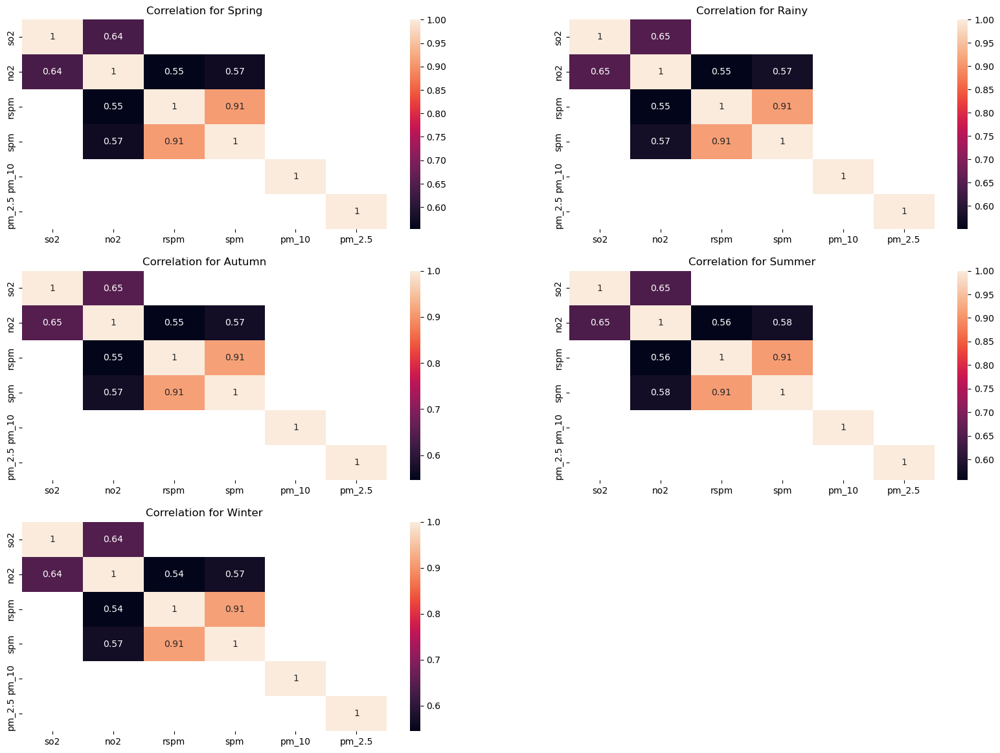

In [62]:
# What is the correlation among different pollution levels in different seasons and identify high correlation (corr>0.5 )?

clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']
st=df['Seasons'].unique().tolist()

plt.figure(figsize=(20,100))
for i in range(len(st)):
    s_u=df[df['Seasons']==st[i]]
    plt.subplot(20,2,i+1)
    corr=s_u[clm].corr()    
    sb.heatmap(abs(corr[corr>0.5]),annot=True)
    plt.title(f'Correlation for {st[i]}')

plt.show()

In [63]:
# Which state has the most and least  air pollution levels (RSPM) over time

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    yt_n= yt.groupby(['state'])['rspm'].mean().reset_index()

    yt_mx=yt_n['rspm'].max()
    ind_mx=yt_n[yt_n['rspm'] == yt_mx].index

    yt_mn=yt_n['rspm'].min()
    ind_mn=yt_n[yt_n['rspm'] == yt_mn].index
    
    print(f'For year {i}')
    print('Maximum => ')
    print('State/UT: ',yt_n['state'][ind_mx].values)
    print('RSPM: ',yt_mx )
    print('Minimum => ')
    print('State/UT: ',yt_n['state'][ind_mn].values)
    print('RSPM: ',yt_mn )
    print('\n')

For year 2024
Maximum => 
State/UT:  ['Delhi']
RSPM:  184.65342346838958
Minimum => 
State/UT:  ['Puducherry']
RSPM:  38.94203347419035


For year 2023
Maximum => 
State/UT:  ['Delhi']
RSPM:  184.65342346838958
Minimum => 
State/UT:  ['Puducherry']
RSPM:  38.94203347419035


For year 2022
Maximum => 
State/UT:  ['Delhi']
RSPM:  184.65342346838958
Minimum => 
State/UT:  ['Puducherry']
RSPM:  38.94203347419035


For year 2021
Maximum => 
State/UT:  ['Delhi']
RSPM:  184.65342346838958
Minimum => 
State/UT:  ['Puducherry']
RSPM:  38.94203347419035


For year 2020
Maximum => 
State/UT:  ['Delhi']
RSPM:  184.6534234683896
Minimum => 
State/UT:  ['Puducherry']
RSPM:  38.94203347419035


For year 2019
Maximum => 
State/UT:  ['Uttar Pradesh']
RSPM:  178.79891530519677
Minimum => 
State/UT:  ['Puducherry']
RSPM:  38.94203347419035


For year 2018
Maximum => 
State/UT:  ['Delhi']
RSPM:  184.65342346838958
Minimum => 
State/UT:  ['Puducherry']
RSPM:  38.94203347419035




In [64]:
# How does the pollution type (PM 10) vary between locations

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    yt_n= yt.groupby(['location','state'])['pm_10'].mean().reset_index()

    yt_mx=yt_n['pm_10'].max()
    ind_mx=yt_n[yt_n['pm_10'] == yt_mx].index

    yt_mn=yt_n['pm_10'].min()
    ind_mn=yt_n[yt_n['pm_10'] == yt_mn].index
    
    print(f'For year {i}')
    print('Maximum => ')
    print('State/UT: ',yt_n['state'][ind_mx].values[0])
    print('Location: ',yt_n['location'][ind_mx].values[0])
    print('PM 10: ',yt_mx )
    print('Minimum => ')
    print('State/UT: ',yt_n['state'][ind_mn].values[0])
    print('Location: ',yt_n['location'][ind_mn].values[0])
    print('PM 10: ',yt_mn )
    print('Difference:',yt_mx-yt_mn)
    print('\n')


For year 2024
Maximum => 
State/UT:  Chhattisgarh
Location:  Bilaspur
PM 10:  126.72120627169676
Minimum => 
State/UT:  Mizoram
Location:  Kolasib
PM 10:  123.49518935288964
Difference: 3.226016918807119


For year 2023
Maximum => 
State/UT:  Chhattisgarh
Location:  Bhilai
PM 10:  126.72120627169676
Minimum => 
State/UT:  Mizoram
Location:  Aizawl
PM 10:  123.49518935288964
Difference: 3.226016918807119


For year 2022
Maximum => 
State/UT:  Chhattisgarh
Location:  Bhilai
PM 10:  126.72120627169674
Minimum => 
State/UT:  Mizoram
Location:  Aizawl
PM 10:  123.49518935288964
Difference: 3.2260169188071046


For year 2021
Maximum => 
State/UT:  Chhattisgarh
Location:  Bhilai
PM 10:  126.72120627169676
Minimum => 
State/UT:  Mizoram
Location:  Aizawl
PM 10:  123.49518935288965
Difference: 3.2260169188071046


For year 2020
Maximum => 
State/UT:  Chhattisgarh
Location:  Bhilai
PM 10:  126.72120627169674
Minimum => 
State/UT:  Jharkhand
Location:  Jharia
PM 10:  123.49518935288964
Difference

In [65]:
# What are the top 3 cleanest locations in terms of average PM2.5 levels?

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    yt_n= yt.groupby(['location','state'])['pm_2.5'].mean().reset_index()

    yt_mn=yt_n.sort_values(['pm_2.5'])
    
    print(f'For year {i} , Location with minimum PM 2.5 is:')
    print(yt_mn[:3])
    print('\n')


For year 2024 , Location with minimum PM 2.5 is:
       location                 state     pm_2.5
95     Itanagar     Arunachal Pradesh  58.854401
160  Naharlagun     Arunachal Pradesh  58.854401
117     Khadoli  Dadra & Nagar Haveli  58.854401


For year 2023 , Location with minimum PM 2.5 is:
       location              state     pm_2.5
70     Itanagar  Arunachal Pradesh  58.854401
120  Naharlagun  Arunachal Pradesh  58.854401
33   Chandigarh         Chandigarh  58.980628


For year 2022 , Location with minimum PM 2.5 is:
       location       state     pm_2.5
35   Chandigarh  Chandigarh  58.980628
164      Ranchi   Jharkhand  59.002240
181      Sindri   Jharkhand  59.002240


For year 2021 , Location with minimum PM 2.5 is:
       location                 state     pm_2.5
67      Khadoli  Dadra & Nagar Haveli  58.854401
110       Patna                 Bihar  58.854401
23   Chandigarh            Chandigarh  58.980628


For year 2020 , Location with minimum PM 2.5 is:
       location

In [66]:
# Which states have the highest variation in pollution

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    yt_n= yt.groupby(['state'])[clm].mean()
    
    print(f'For year {i}')
    y_st=yt_n.sort_values(by=clm,ascending=False)
    print('State =>   ',y_st.index[0])
    print(y_st.iloc[0])
    print('\n')



For year 2024
State =>    Uttarakhand
so2        21.704771
no2        25.056035
rspm      149.041206
spm       333.233250
pm_10     125.355393
pm_2.5     59.962600
Name: Uttarakhand, dtype: float64


For year 2023
State =>    Jharkhand
so2        21.702860
no2        39.727694
rspm      176.993847
spm       306.318874
pm_10     123.495189
pm_2.5     59.002240
Name: Jharkhand, dtype: float64


For year 2022
State =>    Uttarakhand
so2        21.704771
no2        25.056035
rspm      149.041206
spm       333.233250
pm_10     125.355393
pm_2.5     59.962600
Name: Uttarakhand, dtype: float64


For year 2021
State =>    Uttarakhand
so2        21.704771
no2        25.056035
rspm      149.041206
spm       333.233250
pm_10     125.355393
pm_2.5     59.962600
Name: Uttarakhand, dtype: float64


For year 2020
State =>    Uttarakhand
so2        21.704771
no2        25.056035
rspm      149.041206
spm       333.233250
pm_10     125.355393
pm_2.5     59.962600
Name: Uttarakhand, dtype: float64


For 

In [67]:
# How does pollution (SPM) compare between capital cities (Delhi) and other state

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    yt_n= yt.groupby(['state'])['spm'].mean()
    
    print(f'For year {i}')
    yt_s=yt_n['Delhi']-yt_n
    yts=yt_s.sort_values(ascending=False)
    print(yts)
    print('\n')



For year 2024
state
Goa                     286.932416
Puducherry              285.168982
Kerala                  278.690287
Mizoram                 257.652032
Dadra & Nagar Haveli    252.414596
Meghalaya               243.641447
Daman & Diu             235.841386
Gujarat                 231.336616
Nagaland                213.883984
Tamil Nadu              198.284891
Himachal Pradesh        179.332760
Odisha                  163.971034
Chandigarh              163.195125
Assam                   154.560058
Jammu & Kashmir         147.963030
Andhra Pradesh          145.548566
Maharashtra             135.620316
Arunachal Pradesh       135.620316
Telangana               135.620316
Karnataka               135.320289
Punjab                  117.537587
West Bengal             107.599656
Madhya Pradesh           94.526986
Chhattisgarh             60.870717
Jharkhand                37.865209
Uttarakhand              10.950833
Rajasthan                10.162424
Haryana                   0.000000


KeyError: 'Delhi'

In [87]:
# What are the top polluted regions for each specific pollutant

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

for i in yr:
    yt=df[df['Year']==i]
    yt_s=yt.groupby('region')[clm].mean()
    yts=yt_s.sort_values(by=clm,ascending=False)
    print(f'For year {i}')
    print('Region =>  ',yts.index[0])
    print(yts.iloc[0])
    print('\n')


For year 2024
Region =>   West
so2        13.228102
no2        28.399998
rspm      104.690842
spm       196.383639
pm_10     124.875922
pm_2.5     60.094693
Name: West, dtype: float64


For year 2023
Region =>   West
so2        14.699009
no2        31.272919
rspm      111.225976
spm       218.722500
pm_10     125.120876
pm_2.5     60.132710
Name: West, dtype: float64


For year 2022
Region =>   West
so2        13.319552
no2        28.363539
rspm      104.815638
spm       195.442461
pm_10     124.903868
pm_2.5     60.104646
Name: West, dtype: float64


For year 2021
Region =>   West
so2        14.925152
no2        31.469200
rspm      109.123637
spm       216.350644
pm_10     125.070185
pm_2.5     60.107856
Name: West, dtype: float64


For year 2020
Region =>   West
so2        13.798192
no2        28.829282
rspm      105.120556
spm       196.456982
pm_10     125.007349
pm_2.5     60.133328
Name: West, dtype: float64


For year 2019
Region =>   West
so2        13.986990
no2        29.5958

In [88]:
# . How does pollution in industrial zones compare to sensitive zones

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    ia=df[(df['Year']==i)&(df['type']=='Industrial Area')].groupby(['type'])['so2'].mean()
    ra=df[(df['Year']==i)&(df['type']=='Sensitive Area')].groupby(['type'])['so2'].mean()

    print(f'For year {i}')
    print('Industrial Area: ',ia.values)
    print('Sensitive Area: ',ra.values)
    print('Diff: ',ia.values-ra.values)
    print('')


For year 2024
Industrial Area:  [10.01454792]
Sensitive Area:  [8.2137467]
Diff:  [1.80080122]

For year 2023
Industrial Area:  [9.71456244]
Sensitive Area:  [8.17645316]
Diff:  [1.53810928]

For year 2022
Industrial Area:  [10.21808967]
Sensitive Area:  [7.95277809]
Diff:  [2.26531158]

For year 2021
Industrial Area:  [10.7190944]
Sensitive Area:  [7.36889062]
Diff:  [3.35020378]

For year 2020
Industrial Area:  [10.98116032]
Sensitive Area:  [8.46419503]
Diff:  [2.51696529]

For year 2019
Industrial Area:  [10.73817479]
Sensitive Area:  [7.39978826]
Diff:  [3.33838653]

For year 2018
Industrial Area:  [9.99980095]
Sensitive Area:  [9.16290161]
Diff:  [0.83689933]



In [89]:
# How do pollution levels (NO2) compare between summer vs. winter season in different year

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    ia=df[(df['Year']==i)&(df['Seasons']=='Winter')].groupby(['Seasons'])['no2'].mean()
    ra=df[(df['Year']==i)&(df['Seasons']=='Rainy')].groupby(['Seasons'])['no2'].mean()

    print(f'For State {i}')
    print('Winter Season: ',ia.values)
    print('Summer Season: ',ra.values)
    print('Diff: ',ia.values-ra.values)
    print('')



For State 2024
Winter Season:  [23.93110495]
Summer Season:  [23.87351672]
Diff:  [0.05758823]

For State 2023
Winter Season:  [23.96778772]
Summer Season:  [23.93256061]
Diff:  [0.03522711]

For State 2022
Winter Season:  [22.84861368]
Summer Season:  [22.51713379]
Diff:  [0.33147989]

For State 2021
Winter Season:  [23.98973727]
Summer Season:  [24.25126964]
Diff:  [-0.26153238]

For State 2020
Winter Season:  [26.03474203]
Summer Season:  [25.89435828]
Diff:  [0.14038376]

For State 2019
Winter Season:  [25.2418218]
Summer Season:  [25.29461746]
Diff:  [-0.05279566]

For State 2018
Winter Season:  [24.83795529]
Summer Season:  [24.67593862]
Diff:  [0.16201667]



In [90]:
# Are there states where pollution levels (RSPM) are consistently abovw the national average?

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    yt_s=yt.groupby(['state'])['rspm'].mean()
    print(f'For year {i}')
    yts= yt_s[yt_s.mean()<yt_s]
    print('National RSPM level: ',yt_s.mean())
    print(yts)
    print('\n')


For year 2024
National RSPM level:  101.93081722542159
state
Chhattisgarh       123.626876
Delhi              184.653423
Haryana            162.494684
Jammu & Kashmir    117.449483
Jharkhand          176.993847
Madhya Pradesh     124.447538
Maharashtra        103.069802
Punjab             153.306967
Rajasthan          159.295550
Uttar Pradesh      178.798915
Uttarakhand        149.041206
West Bengal        116.725396
Name: rspm, dtype: float64


For year 2023
National RSPM level:  104.29177942908903
state
Chhattisgarh       123.626876
Delhi              184.653423
Haryana            162.494684
Jammu & Kashmir    117.449483
Jharkhand          176.993847
Madhya Pradesh     124.447538
Punjab             153.306967
Rajasthan          159.295550
Uttar Pradesh      178.798915
West Bengal        116.725396
Name: rspm, dtype: float64


For year 2022
National RSPM level:  107.24452769500168
state
Chhattisgarh       123.626876
Delhi              184.653423
Haryana            162.494684
Jammu & K

#### 3. Pollutant-Specific Analysis

In [92]:
# What is the trend of SO2 levels in the past 6 years

yr=list(df['Year'].unique())
yr.sort(reverse=True)
yr=yr[:6]

for i in yr:
    yt=df[df['Year']==i]
    print(f'For year {i}')
    print('Max SO2:',yt['so2'].max() )
    print('Min SO2:',yt['so2'].min() )
    print('Diff:',yt['so2'].max()-yt['so2'].min())
    print('\n')


For year 2024
Max SO2: 21.704770677596624
Min SO2: 2.0011979230549084
Diff: 19.703572754541717


For year 2023
Max SO2: 21.70286002494622
Min SO2: 2.005441451053614
Diff: 19.697418573892605


For year 2022
Max SO2: 21.704770677596624
Min SO2: 2.0011979230549084
Diff: 19.703572754541717


For year 2021
Max SO2: 21.704770677596624
Min SO2: 2.005441451053614
Diff: 19.69932922654301


For year 2020
Max SO2: 21.704770677596624
Min SO2: 2.0011979230549084
Diff: 19.703572754541717


For year 2019
Max SO2: 21.704770677596624
Min SO2: 2.0011979230549084
Diff: 19.703572754541717




In [93]:
# Which zone(statewise) has shown the most drastic increase of PM 2.5 over time

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['state','type'])['pm_2.5'].mean().reset_index()
    
    y_mx=y_st['pm_2.5'].max()
    ind_mx=y_st[y_st['pm_2.5']==y_mx].index

    print('Zone: ',y_st['type'][ind_mx].values.tolist())
    print('State: ',y_st['state'][ind_mx].values[0])
    print('PM 2.5 level: ',y_mx)
    print('\n')



Zone:  ['Industrial Area']
State:  Daman & Diu
PM 2.5 level:  60.839995900587084


Zone:  ['Industrial Area', 'Rural and other Areas']
State:  Gujarat
PM 2.5 level:  60.40360237222638


Zone:  ['Rural and other Areas']
State:  Nagaland
PM 2.5 level:  60.43026162180507


Zone:  ['Industrial Area']
State:  Daman & Diu
PM 2.5 level:  60.839995900587084


Zone:  ['Industrial Area']
State:  Daman & Diu
PM 2.5 level:  60.839995900587084


Zone:  ['Industrial Area']
State:  Daman & Diu
PM 2.5 level:  60.83999590058708


Zone:  ['Industrial Area']
State:  Daman & Diu
PM 2.5 level:  60.839995900587084




In [94]:
# Which state is the biggest contributor to overall air quality deterioration?

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['state'])[clm].mean().reset_index()
    print(f'For year {i}')
    yst=y_st.sort_values(by=clm,ascending=False)
    print(yst.iloc[0])
    print('\n')


For year 2024
state     Uttarakhand
so2         21.704771
no2         25.056035
rspm       149.041206
spm         333.23325
pm_10      125.355393
pm_2.5        59.9626
Name: 28, dtype: object


For year 2023
state      Jharkhand
so2         21.70286
no2        39.727694
rspm      176.993847
spm       306.318874
pm_10     123.495189
pm_2.5      59.00224
Name: 11, dtype: object


For year 2022
state     Uttarakhand
so2         21.704771
no2         25.056035
rspm       149.041206
spm         333.23325
pm_10      125.355393
pm_2.5        59.9626
Name: 24, dtype: object


For year 2021
state     Uttarakhand
so2         21.704771
no2         25.056035
rspm       149.041206
spm         333.23325
pm_10      125.355393
pm_2.5        59.9626
Name: 26, dtype: object


For year 2020
state     Uttarakhand
so2         21.704771
no2         25.056035
rspm       149.041206
spm         333.23325
pm_10      125.355393
pm_2.5        59.9626
Name: 26, dtype: object


For year 2019
state     Uttarakhand
s

In [95]:
# How does NO2 concentration vary across different seasons of the year regionwise

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    y_st=pd.pivot_table(data=yt,columns='Seasons',index='region',
                        values='no2',aggfunc='mean')
    print(f'For year {i}')
    print(y_st)
    print('\n')

For year 2024
Seasons     Autumn      Rainy     Spring     Summer     Winter
region                                                        
East     26.657012  26.069095  26.898458  27.096796  26.465755
North    23.256904  23.324829  23.287024  23.191553  23.289710
South    18.647259  18.295919  18.684575  18.604511  18.676499
West     28.552549  28.486923  28.373997  28.708249  28.011504


For year 2023
Seasons     Autumn      Rainy     Spring     Summer     Winter
region                                                        
East     23.913680  24.394725  22.927358  23.435198  23.430260
North    23.419889  23.342102  23.337192  23.375702  23.319434
South    18.787440  18.681216  18.755592  18.699705  18.602585
West     31.864971  31.560197  30.805603  31.029800  31.272643


For year 2022
Seasons     Autumn      Rainy     Spring     Summer     Winter
region                                                        
East     17.684237  18.313386  20.909000  19.318821  20.358605
North    

In [96]:
# What is the minimal pollutant value accross different region

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    y_st=pd.pivot_table(data=yt,index='region',
                        values=clm,aggfunc='min')
    print(f'For year {i}')
    print(y_st)
    print('\n')

For year 2024
              no2       pm_10     pm_2.5       rspm       so2         spm
region                                                                   
East     5.469697  123.495189  58.854401  44.152100  2.001198   86.532051
North   12.213181  124.167962  58.980628  91.191141  2.005441  164.851323
South   12.587885  124.444679  59.416195  38.942033  4.189784   59.015101
West    12.507033  123.555186  58.854401  51.211982  6.316789   57.251667


For year 2023
              no2       pm_10     pm_2.5       rspm       so2         spm
region                                                                   
East     5.469697  123.495189  58.854401  44.152100  2.057449   86.532051
North   12.213181  124.167962  58.980628  91.191141  2.005441  164.851323
South   12.587885  124.444679  59.416195  38.942033  4.189784   59.015101
West    12.507033  123.555186  59.881720  63.756576  6.316789   57.251667


For year 2022
              no2       pm_10     pm_2.5       rspm       so2     

In [97]:
# How do (SO2 & NO2),(spm & rspm),(PM 10 & PM 2.5) levels correlate with each other?
 
yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    crr_sn=yt[['so2','no2']].corr()
    crr_sr=yt[['spm','rspm']].corr()
    crr_pm=yt[['pm_10','pm_2.5']].corr()
    print(f'For year {i}')
    print('Corr for (SO2 & NO2): \n',crr_sn)
    print('Corr for (spm & rspm): \n',crr_sr)
    print('Corr for (PM 10 & PM ): \n',crr_pm)
    print('\n')



For year 2024
Corr for (SO2 & NO2): 
           so2       no2
so2  1.000000  0.622335
no2  0.622335  1.000000
Corr for (spm & rspm): 
            spm      rspm
spm   1.000000  0.906494
rspm  0.906494  1.000000
Corr for (PM 10 & PM ): 
            pm_10    pm_2.5
pm_10   1.000000  0.210905
pm_2.5  0.210905  1.000000


For year 2023
Corr for (SO2 & NO2): 
          so2      no2
so2  1.00000  0.64578
no2  0.64578  1.00000
Corr for (spm & rspm): 
            spm      rspm
spm   1.000000  0.910208
rspm  0.910208  1.000000
Corr for (PM 10 & PM ): 
            pm_10    pm_2.5
pm_10   1.000000  0.261481
pm_2.5  0.261481  1.000000


For year 2022
Corr for (SO2 & NO2): 
           so2       no2
so2  1.000000  0.711556
no2  0.711556  1.000000
Corr for (spm & rspm): 
            spm      rspm
spm   1.000000  0.901736
rspm  0.901736  1.000000
Corr for (PM 10 & PM ): 
            pm_10    pm_2.5
pm_10   1.000000  0.261811
pm_2.5  0.261811  1.000000


For year 2021
Corr for (SO2 & NO2): 
           s

In [98]:
# How does PM2.5 compare to PM10 in different location and which is maximum

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['state','location'])[['pm_10','pm_2.5']].mean().reset_index()

    print(f'For year {i}')
    yst=y_st.sort_values(['pm_10','pm_2.5'],ascending=False)
    print(yst.max())
    print('\n')

For year 2024
state          West Bengal
location    West Singhbhum
pm_10           126.721206
pm_2.5           60.839996
dtype: object


For year 2023
state        West Bengal
location    Yamuna Nagar
pm_10         126.721206
pm_2.5         60.403602
dtype: object


For year 2022
state        West Bengal
location    Yamuna Nagar
pm_10         126.721206
pm_2.5         60.430262
dtype: object


For year 2021
state       West Bengal
location        Wayanad
pm_10        126.721206
pm_2.5        60.839996
dtype: object


For year 2020
state        West Bengal
location    Yamuna Nagar
pm_10         126.721206
pm_2.5         60.839996
dtype: object


For year 2019
state        West Bengal
location    Yamuna Nagar
pm_10         126.721206
pm_2.5         60.839996
dtype: object


For year 2018
state       West Bengal
location    Yamunanagar
pm_10        126.721206
pm_2.5        60.839996
dtype: object




In [106]:
# What is the zonewise maximum recorded value for SO2 pollutant, in which state

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['state','type'])['so2'].mean().reset_index()
    
    y_mx=y_st['so2'].max()
    ind_mx=y_st[y_st['so2']==y_mx].index
    
    print(f'For year {i}')
    print('Zone: ',y_st['type'][ind_mx].values.tolist())
    print('State: ',y_st['state'][ind_mx].values.tolist()[0])
    print('PM 2.5 level: ',y_mx)
    print('\n')
    


For year 2024
Zone:  ['Industrial Area', 'Rural and other Areas']
State:  Uttarakhand
PM 2.5 level:  21.704770677596624


For year 2023
Zone:  ['Industrial Area', 'Rural and other Areas']
State:  Jharkhand
PM 2.5 level:  21.70286002494622


For year 2022
Zone:  ['Industrial Area', 'Rural and other Areas']
State:  Uttarakhand
PM 2.5 level:  21.704770677596624


For year 2021
Zone:  ['Industrial Area', 'Rural and other Areas']
State:  Uttarakhand
PM 2.5 level:  21.704770677596624


For year 2020
Zone:  ['Industrial Area', 'Rural and other Areas']
State:  Uttarakhand
PM 2.5 level:  21.704770677596624


For year 2019
Zone:  ['Industrial Area']
State:  Uttarakhand
PM 2.5 level:  21.704770677596624


For year 2018
Zone:  ['Industrial Area', 'Residential']
State:  Jharkhand
PM 2.5 level:  21.70286002494622




In [107]:
# Which state peaks in Autumn compared to Spring for SPM

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    wn=yt[(yt['Year']==i)&(yt['Seasons']=='Autumn')].groupby(['state'])['spm'].mean().reset_index()
    sm=yt[(yt['Year']==i)&(yt['Seasons']=='Spring')].groupby(['state'])['spm'].mean().reset_index()

    wn_mx=wn['spm'].max()
    ind_wnmx=wn[wn['spm']==wn_mx].index

    sm_mx=sm['spm'].max()
    ind_smmx=sm[sm['spm']==sm_mx].index
    
    print(f'For years {i}')

    print('In Autumn => ')
    print('State: ',y_st['state'][ind_wnmx].values.tolist()[0])
    print('SPM level: ',wn_mx)
    
    print('In Spring => ')
    print('State: ',y_st['state'][ind_smmx].values.tolist()[0])
    print('SPM level: ',sm_mx)

    print('\n')



For years 2024
In Autumn => 
State:  Chhattisgarh
SPM level:  344.18408296931955
In Spring => 
State:  Chandigarh
SPM level:  344.18408296931955


For years 2023
In Autumn => 
State:  Chandigarh
SPM level:  344.18408296931955
In Spring => 
State:  Bihar
SPM level:  344.18408296931955


For years 2022
In Autumn => 
State:  Bihar
SPM level:  344.18408296931955
In Spring => 
State:  Bihar
SPM level:  344.18408296931955


For years 2021
In Autumn => 
State:  Chhattisgarh
SPM level:  344.18408296931955
In Spring => 
State:  Chhattisgarh
SPM level:  344.18408296931955


For years 2020
In Autumn => 
State:  Chandigarh
SPM level:  344.18408296931955
In Spring => 
State:  Chandigarh
SPM level:  344.18408296931955


For years 2019
In Autumn => 
State:  Dadra & Nagar Haveli
SPM level:  344.18408296931955
In Spring => 
State:  Dadra & Nagar Haveli
SPM level:  344.18408296931955


For years 2018
In Autumn => 
State:  Chhattisgarh
SPM level:  344.18408296931955
In Spring => 
State:  Chhattisgarh
SPM

In [108]:
# What is the minimum (PM10,PM2.5) and (SPM,RSPM) levels ( state and seasonwise)

yr=list(df['Year'].unique())
yr.sort(reverse=True)
cl=['pm_10','pm_2.5','spm','rspm']

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['state','Seasons'])[cl].mean().reset_index().min()
    
    print(f'For year {i}')
    print(y_st)
    print('\n')
    


For year 2024
state      Andhra Pradesh
Seasons            Autumn
pm_10          123.495189
pm_2.5          58.854401
spm             57.251667
rspm            38.942033
dtype: object


For year 2023
state      Andhra Pradesh
Seasons            Autumn
pm_10          123.495189
pm_2.5          58.854401
spm             57.251667
rspm            38.942033
dtype: object


For year 2022
state      Andhra Pradesh
Seasons            Autumn
pm_10          123.495189
pm_2.5          58.980628
spm             57.251667
rspm            38.942033
dtype: object


For year 2021
state      Andhra Pradesh
Seasons            Autumn
pm_10          123.495189
pm_2.5          58.854401
spm             57.251667
rspm            38.942033
dtype: object


For year 2020
state      Andhra Pradesh
Seasons            Autumn
pm_10          123.495189
pm_2.5          58.854401
spm             57.251667
rspm            38.942033
dtype: object


For year 2019
state      Andhra Pradesh
Seasons            Autumn
pm_1

In [109]:
# How do PM2.5 and PM10 levels change zonewise before and after a major rainfall event

yr=list(df['Year'].unique())
yr.sort(reverse=True)
cl=['pm_10','pm_2.5','spm','rspm']

for i in yr:
    yt=df[df['Year']==i]
    ss=df[(df['Seasons']=='Spring')|(df['Seasons']=='Summer')].groupby('type')[['pm_2.5','pm_10']].mean()
    aw=df[(df['Seasons']=='Autumn')|(df['Seasons']=='Winter')].groupby('type')[['pm_2.5','pm_10']].mean()
    
    print(f'For years {i}')
    print('Pre Rainy Day: \n',ss,'\n')
    print('Post Rainy Day: \n',aw)
    print('\n')

For years 2024
Pre Rainy Day: 
                           pm_2.5       pm_10
type                                        
Industrial Area        59.920283  125.070894
RIRUO                  60.184770  126.067276
Residential            59.898365  125.138291
Rural and other Areas  59.897651  125.080895
Sensitive Area         59.981148  125.137208 

Post Rainy Day: 
                           pm_2.5       pm_10
type                                        
Industrial Area        59.931805  125.086522
RIRUO                  60.218564  125.986717
Residential            59.897894  125.150714
Rural and other Areas  59.900417  125.084549
Sensitive Area         59.984902  125.126550


For years 2023
Pre Rainy Day: 
                           pm_2.5       pm_10
type                                        
Industrial Area        59.920283  125.070894
RIRUO                  60.184770  126.067276
Residential            59.898365  125.138291
Rural and other Areas  59.897651  125.080895
Sensitive Area

In [111]:
# Which Quarter show a drastic increase of pollution level , along with region

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

for i in yr:
    yt=df[df['Year']==i]
    qr=pd.pivot_table(data=yt,index=['region','Qtr'],values=clm,aggfunc='mean').reset_index()
    print(f'For year {i}')
    print(qr.max())
    print('\n')

    

For year 2024
region          West
Qtr            Qtr 4
no2        28.837754
pm_10     125.306034
pm_2.5     60.136626
rspm      140.623557
so2        13.531691
spm       258.515813
dtype: object


For year 2023
region          West
Qtr            Qtr 4
no2        31.912019
pm_10     125.282024
pm_2.5     60.141713
rspm      139.950492
so2        14.868427
spm       254.753659
dtype: object


For year 2022
region          West
Qtr            Qtr 4
no2        28.693388
pm_10     125.243158
pm_2.5      60.11182
rspm      139.087289
so2        13.381091
spm       257.212545
dtype: object


For year 2021
region          West
Qtr            Qtr 4
no2         32.12524
pm_10     125.154742
pm_2.5     60.128198
rspm      140.494524
so2        14.976319
spm       259.951301
dtype: object


For year 2020
region          West
Qtr            Qtr 4
no2        38.367008
pm_10     125.331975
pm_2.5     60.136667
rspm       141.55029
so2        13.909943
spm       264.703709
dtype: object


For year 2

In [112]:
# How does air pollution vary near industrial zones vs. non industrial zone, Quarterwise

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

for i in yr:
    yt=df[df['Year']==i]
    i_st=yt[(yt['Year']==i)&(yt['type']=='Industrial Area')]
    ni_st=yt[(yt['Year']==i)&(yt['type']!='Industrial Area')]  
    
    print(f'For Year {i}')
    print('Industrial Area => ')
    print(i_st[clm].mean(),'\n')
    print('Industrial Area => ')
    print(ni_st[clm].mean())
    print('\n')


For Year 2024
Industrial Area => 
so2        10.014548
no2        25.396123
rspm      110.777809
spm       214.167938
pm_10     125.089556
pm_2.5     59.903137
dtype: float64 

Industrial Area => 
so2         9.298837
no2        23.337080
rspm      104.209111
spm       201.850625
pm_10     125.083467
pm_2.5     59.902314
dtype: float64


For Year 2023
Industrial Area => 
so2         9.714562
no2        25.466247
rspm      109.325670
spm       211.280523
pm_10     125.142637
pm_2.5     59.915472
dtype: float64 

Industrial Area => 
so2         9.263411
no2        22.992720
rspm      103.821047
spm       204.296494
pm_10     125.135860
pm_2.5     59.889151
dtype: float64


For Year 2022
Industrial Area => 
so2        10.218090
no2        24.383631
rspm      110.643218
spm       211.140766
pm_10     125.039944
pm_2.5     59.935952
dtype: float64 

Industrial Area => 
so2         9.245853
no2        21.749595
rspm      102.532107
spm       199.160249
pm_10     125.025417
pm_2.5     59.9119

In [115]:
# Which state is responsible for the highest air quality index 

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby('state')[clm].mean().reset_index().min()
    print(f'For year {i}')
    print(y_st)
    print('\n')

For year 2024
state     Andhra Pradesh
so2             2.001198
no2             5.469697
rspm           38.942033
spm            57.251667
pm_10         123.495189
pm_2.5         58.854401
dtype: object


For year 2023
state     Andhra Pradesh
so2             2.005441
no2             5.469697
rspm           38.942033
spm            57.251667
pm_10         123.495189
pm_2.5         58.854401
dtype: object


For year 2022
state     Andhra Pradesh
so2             2.001198
no2             6.414027
rspm           38.942033
spm            57.251667
pm_10         123.495189
pm_2.5         58.980628
dtype: object


For year 2021
state     Andhra Pradesh
so2             2.005441
no2             6.414027
rspm           38.942033
spm            57.251667
pm_10         123.495189
pm_2.5         58.854401
dtype: object


For year 2020
state     Andhra Pradesh
so2             2.001198
no2             6.414027
rspm           38.942033
spm            57.251667
pm_10         123.495189
pm_2.5         5

In [117]:
# How does air pollution (spm and rspm) behave during spring and autumn season

yr=list(df['Year'].unique())
yr.sort(reverse=True)
cl=['pm_10','pm_2.5','spm','rspm']

for i in yr:
    yt=df[df['Year']==i]
    ss=df[(df['Seasons']=='Spring')].groupby('type')[['spm','rspm']].mean()
    aw=df[(df['Seasons']=='Autumn')].groupby('type')[['spm','rspm']].mean()
    
    print(f'For years {i}')
    print('In Spring: \n',ss,'\n')
    print('In Autumn: \n',aw)
    print('\n')

For years 2024
In Spring: 
                               spm        rspm
type                                         
Industrial Area        213.599977  112.602787
RIRUO                  182.740729  104.583388
Residential            214.880796  111.209700
Rural and other Areas  205.394626  106.125865
Sensitive Area         207.356664   98.251313 

In Autumn: 
                               spm        rspm
type                                         
Industrial Area        213.436715  111.726516
RIRUO                  203.632737  109.294634
Residential            220.094215  112.969293
Rural and other Areas  206.150950  106.157471
Sensitive Area         207.836740   99.157623


For years 2023
In Spring: 
                               spm        rspm
type                                         
Industrial Area        213.599977  112.602787
RIRUO                  182.740729  104.583388
Residential            214.880796  111.209700
Rural and other Areas  205.394626  106.125865
Sensiti

In [118]:
# Are there locations where  SO2 and NO2 levels are higher (mention its state)

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['location','state'])[['so2','no2']].mean().reset_index().max()
    print(f'For year {i}')
    print(y_st)
    print('\n')
    
    

For year 2024
location    West Singhbhum
state          West Bengal
so2              21.704771
no2              51.369083
dtype: object


For year 2023
location    Yamuna Nagar
state        West Bengal
so2             21.70286
no2            51.369083
dtype: object


For year 2022
location    Yamuna Nagar
state        West Bengal
so2            21.704771
no2            51.369083
dtype: object


For year 2021
location        Wayanad
state       West Bengal
so2           21.704771
no2           51.369083
dtype: object


For year 2020
location    Yamuna Nagar
state        West Bengal
so2            21.704771
no2            51.369083
dtype: object


For year 2019
location    Yamuna Nagar
state        West Bengal
so2            21.704771
no2            51.369083
dtype: object


For year 2018
location    Yamunanagar
state       West Bengal
so2            21.70286
no2           51.369083
dtype: object




#### 4. Comparative & Anomaly Detection 

In [121]:
#  Which state has shown the biggest improvement in air quality over time

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['state'])[clm].mean().reset_index().min()
    print(f'For year {i}')
    print(y_st)
    print('\n')


For year 2024
state     Andhra Pradesh
so2             2.001198
no2             5.469697
rspm           38.942033
spm            57.251667
pm_10         123.495189
pm_2.5         58.854401
dtype: object


For year 2023
state     Andhra Pradesh
so2             2.005441
no2             5.469697
rspm           38.942033
spm            57.251667
pm_10         123.495189
pm_2.5         58.854401
dtype: object


For year 2022
state     Andhra Pradesh
so2             2.001198
no2             6.414027
rspm           38.942033
spm            57.251667
pm_10         123.495189
pm_2.5         58.980628
dtype: object


For year 2021
state     Andhra Pradesh
so2             2.005441
no2             6.414027
rspm           38.942033
spm            57.251667
pm_10         123.495189
pm_2.5         58.854401
dtype: object


For year 2020
state     Andhra Pradesh
so2             2.001198
no2             6.414027
rspm           38.942033
spm            57.251667
pm_10         123.495189
pm_2.5         5

In [123]:
# Are pollution levels more stable or erratic across different locations, which one

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['location','state'])[clm].mean().reset_index().min()
    print(f'For year {i}')
    print(y_st)
    print('\n')

For year 2024
location        ANKLESHWAR
state       Andhra Pradesh
so2               2.001198
no2               5.469697
rspm             38.942033
spm              57.251667
pm_10           123.495189
pm_2.5           58.854401
dtype: object


For year 2023
location              Agra
state       Andhra Pradesh
so2               2.005441
no2               5.469697
rspm             38.942033
spm              57.251667
pm_10           123.495189
pm_2.5           58.854401
dtype: object


For year 2022
location              Agra
state       Andhra Pradesh
so2               2.001198
no2               6.414027
rspm             38.942033
spm              57.251667
pm_10           123.495189
pm_2.5           58.980628
dtype: object


For year 2021
location         Ahmedabad
state       Andhra Pradesh
so2               2.005441
no2               6.414027
rspm             38.942033
spm              57.251667
pm_10           123.495189
pm_2.5           58.854401
dtype: object


For year 2020
lo

In [125]:
# Identify the top 10 highest particle spikes recorded in history , with state

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['location','state'])[clm].mean().reset_index()
    print(f'For year {i}')
    print(y_st.sort_values(by=clm,ascending=False).iloc[:10])
    print('\n')

For year 2024
       location        state        so2        no2        rspm         spm  \
58     Dehradun  Uttarakhand  21.704771  25.056035  149.041206  333.233250   
196   Rishikesh  Uttarakhand  21.704771  25.056035  149.041206  333.233250   
86     Haldwani  Uttarakhand  21.704771  25.056035  149.041206  333.233250   
87     Haridwar  Uttarakhand  21.704771  25.056035  149.041206  333.233250   
115    Kashipur  Uttarakhand  21.704771  25.056035  149.041206  333.233250   
198    Rudrapur  Uttarakhand  21.704771  25.056035  149.041206  333.233250   
63      Dhanbad    Jharkhand  21.702860  39.727694  176.993847  306.318874   
103  Jamshedpur    Jharkhand  21.702860  39.727694  176.993847  306.318874   
105      Jharia    Jharkhand  21.702860  39.727694  176.993847  306.318874   
191      Ranchi    Jharkhand  21.702860  39.727694  176.993847  306.318874   

          pm_10    pm_2.5  
58   125.355393  59.96260  
196  125.355393  59.96260  
86   125.355393  59.96260  
87   125.355393

In [126]:
# Which State  pollution levels (NO2) exceed mean threshold

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['state'])['no2'].mean()
    yst=y_st[y_st>y_st.mean()].sort_values(ascending=False)
    print(f'For year {i}')
    print('Threshold: ',y_st.mean())
    print(yst)
    print('\n')

For year 2024
Threshold:  21.60995184429622
state
Delhi            51.369083
West Bengal      51.369083
Jharkhand        39.727694
Maharashtra      33.039551
Rajasthan        31.108496
Haryana          28.428532
Uttar Pradesh    28.402677
Punjab           25.459481
Uttarakhand      25.056035
Chhattisgarh     24.197280
Telangana        23.865435
Gujarat          22.611837
Name: no2, dtype: float64


For year 2023
Threshold:  22.200169719993465
state
West Bengal      51.369083
Delhi            51.369083
Jharkhand        39.727694
Maharashtra      33.039551
Rajasthan        31.108496
Haryana          28.428532
Uttar Pradesh    28.402677
Punjab           25.459481
Chhattisgarh     24.197280
Telangana        23.865435
Gujarat          22.611837
Name: no2, dtype: float64


For year 2022
Threshold:  22.29560754206606
state
Delhi            51.369083
West Bengal      51.369083
Jharkhand        39.727694
Maharashtra      33.039551
Rajasthan        31.108496
Haryana          28.428532
Uttar Prad

In [127]:
# At which month  is the biggest air pollution event recorded

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['Month'])[clm].mean().reset_index().max()
    print(f'For year {i}')
    print(y_st)
    print('\n')


For year 2024
Month      September
so2         9.867959
no2        24.231139
rspm      108.616893
spm       210.502483
pm_10     125.133492
pm_2.5     59.924194
dtype: object


For year 2023
Month      September
so2         9.556649
no2        24.310947
rspm      107.861668
spm       210.732949
pm_10     125.149128
pm_2.5     59.911368
dtype: object


For year 2022
Month      September
so2         9.692483
no2        23.285941
rspm      107.390963
spm        206.89039
pm_10     125.051018
pm_2.5     59.941472
dtype: object


For year 2021
Month      September
so2        10.281999
no2        24.618319
rspm      110.118418
spm       213.464745
pm_10     125.080883
pm_2.5      59.91137
dtype: object


For year 2020
Month      September
so2        10.683155
no2        26.226454
rspm      113.722101
spm       215.951704
pm_10     125.137232
pm_2.5      59.98209
dtype: object


For year 2019
Month      September
so2        10.360467
no2        25.579255
rspm      111.802321
spm       213.943

In [128]:
# Are there days of the year when pollution always peaks

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['Day'])[clm].mean().reset_index().max()
    print(f'For year {i}')
    print(y_st)
    print('\n')


For year 2024
Day        Wednesday
so2        10.207904
no2        27.117373
rspm      108.513463
spm       211.955718
pm_10     125.246832
pm_2.5     59.928103
dtype: object


For year 2023
Day        Wednesday
so2         9.665266
no2        24.886363
rspm      107.033517
spm       210.784196
pm_10     125.161979
pm_2.5     59.924083
dtype: object


For year 2022
Day        Wednesday
so2         9.791198
no2        23.154517
rspm      107.456651
spm       210.457064
pm_10     125.068901
pm_2.5     59.949602
dtype: object


For year 2021
Day        Wednesday
so2        10.428137
no2        24.494207
rspm      109.800568
spm        212.35868
pm_10     125.085552
pm_2.5     59.891384
dtype: object


For year 2020
Day        Wednesday
so2        10.896195
no2        27.030871
rspm      114.533542
spm       218.039217
pm_10     125.161727
pm_2.5     59.986674
dtype: object


For year 2019
Day        Wednesday
so2        10.922608
no2        27.977333
rspm      112.837418
spm       215.377

In [129]:
# Compare min and max air pollution levels (PM 10) between two locations 

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['location','state'])[['pm_10','pm_2.5']].mean().reset_index()
    
    print(f'For year {i}')
    print('Maximum Value =>')
    print(y_st.max(),'\n')
    print('Minimum Value =>')
    print(y_st.min(),'\n')
    
    print('PM 10 Diff:',y_st.max()['pm_10']-y_st.min()['pm_10'])
    print('PM 2.5 Diff:',y_st.max()['pm_2.5']-y_st.min()['pm_2.5'])
    print('\n')


For year 2024
Maximum Value =>
location    West Singhbhum
state          West Bengal
pm_10           126.721206
pm_2.5           60.839996
dtype: object 

Minimum Value =>
location        ANKLESHWAR
state       Andhra Pradesh
pm_10           123.495189
pm_2.5           58.854401
dtype: object 

PM 10 Diff: 3.226016918807119
PM 2.5 Diff: 1.9855950521738919


For year 2023
Maximum Value =>
location    Yamuna Nagar
state        West Bengal
pm_10         126.721206
pm_2.5         60.403602
dtype: object 

Minimum Value =>
location              Agra
state       Andhra Pradesh
pm_10           123.495189
pm_2.5           58.854401
dtype: object 

PM 10 Diff: 3.226016918807119
PM 2.5 Diff: 1.5492015238131884


For year 2022
Maximum Value =>
location    Yamuna Nagar
state        West Bengal
pm_10         126.721206
pm_2.5         60.430262
dtype: object 

Minimum Value =>
location              Agra
state       Andhra Pradesh
pm_10           123.495189
pm_2.5           58.980628
dtype: object 



In [130]:
# Identify Quarterwise days with low pollution  over the past 5 years

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['Day','Qtr'])[clm].mean().reset_index().min()
    print(f'For year {i}')
    print(y_st)
    print('\n')


For year 2024
Day           Friday
Qtr            Qtr 1
so2         8.889914
no2        22.642147
rspm       99.046849
spm       196.244233
pm_10      125.01764
pm_2.5     59.847387
dtype: object


For year 2023
Day           Friday
Qtr            Qtr 1
so2         9.128286
no2        22.869193
rspm      103.029002
spm       201.393771
pm_10     125.110223
pm_2.5     59.862324
dtype: object


For year 2022
Day           Friday
Qtr            Qtr 1
so2         9.247541
no2        21.843677
rspm      101.115286
spm       193.297283
pm_10     124.986254
pm_2.5     59.882953
dtype: object


For year 2021
Day           Friday
Qtr            Qtr 1
so2         9.729272
no2        23.499494
rspm      104.422427
spm       205.300851
pm_10     125.023134
pm_2.5     59.847925
dtype: object


For year 2020
Day           Friday
Qtr            Qtr 1
so2        10.204013
no2        25.042704
rspm      108.956522
spm       205.936622
pm_10     125.054119
pm_2.5     59.932795
dtype: object


For year 2

In [131]:
# Identify states where pollution control measures have worked best

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['state'])[clm].mean().reset_index().min()
    print(f'For year {i}')
    print(y_st)
    print('\n')

For year 2024
state     Andhra Pradesh
so2             2.001198
no2             5.469697
rspm           38.942033
spm            57.251667
pm_10         123.495189
pm_2.5         58.854401
dtype: object


For year 2023
state     Andhra Pradesh
so2             2.005441
no2             5.469697
rspm           38.942033
spm            57.251667
pm_10         123.495189
pm_2.5         58.854401
dtype: object


For year 2022
state     Andhra Pradesh
so2             2.001198
no2             6.414027
rspm           38.942033
spm            57.251667
pm_10         123.495189
pm_2.5         58.980628
dtype: object


For year 2021
state     Andhra Pradesh
so2             2.005441
no2             6.414027
rspm           38.942033
spm            57.251667
pm_10         123.495189
pm_2.5         58.854401
dtype: object


For year 2020
state     Andhra Pradesh
so2             2.001198
no2             6.414027
rspm           38.942033
spm            57.251667
pm_10         123.495189
pm_2.5         5

In [132]:
# What are the top 3 months with highest spm and rspm pollution levels every year

yr=list(df['Year'].unique())
yr.sort(reverse=True)

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['Month'])[['spm','rspm']].mean().reset_index()
    yst=y_st.sort_values(by=['spm','rspm'],ascending=False)
    print(f'For year {i}')
    print(yst.iloc[:3])
    print('\n')

For year 2024
        Month         spm        rspm
8         May  210.502483  108.616893
0       April  209.220747  107.765575
11  September  208.416019  107.448343


For year 2023
       Month         spm        rspm
2   December  210.732949  107.861668
9   November  208.719269  105.723325
10   October  208.290219  106.457460


For year 2022
        Month         spm        rspm
4     January  206.890390  107.390963
11  September  205.509545  105.167432
3    February  204.510836  106.542998


For year 2021
       Month         spm        rspm
6       June  213.464745  110.118418
10   October  213.347132  109.046863
9   November  213.163008  109.230735


For year 2020
      Month         spm        rspm
9  November  215.951704  113.395696
3  February  215.290063  113.722101
0     April  215.068444  113.641226


For year 2019
      Month         spm        rspm
9  November  213.943112  111.802321
8       May  212.933403  111.330277
0     April  212.830141  111.095352


For year 2018
  

In [133]:
# Identify the 5 least predictable month for pollution trends 

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['Month'])[clm].mean().reset_index().min()
    print(f'For year {i}')
    print(y_st)
    print('\n')

For year 2024
Month          April
so2         9.193619
no2        23.791478
rspm        104.4952
spm       201.513097
pm_10     125.042872
pm_2.5     59.875376
dtype: object


For year 2023
Month          April
so2         9.308184
no2        23.532704
rspm      104.214776
spm       204.356279
pm_10     125.122749
pm_2.5     59.872241
dtype: object


For year 2022
Month          April
so2         9.421414
no2        22.206984
rspm      103.365332
spm       200.761694
pm_10     125.010544
pm_2.5     59.904631
dtype: object


For year 2021
Month          April
so2         9.984131
no2        23.545728
rspm      106.932974
spm       206.607602
pm_10     125.034946
pm_2.5     59.867769
dtype: object


For year 2020
Month          April
so2        10.433473
no2        25.705382
rspm      110.401581
spm       209.528261
pm_10     125.102579
pm_2.5     59.957955
dtype: object


For year 2019
Month          April
so2        10.088028
no2        24.968627
rspm      109.932495
spm       210.124

In [134]:
# What is the mont pollutant month  in terms of seasonwise and location & statewise

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

for i in yr:
    yt=df[df['Year']==i]
    y_st=yt.groupby(['Month','Seasons','location','state'])[clm].mean().reset_index().max()
    print(f'For year {i}')
    print(y_st)
    print('\n')

For year 2024
Month            September
Seasons             Winter
location    West Singhbhum
state          West Bengal
so2              21.704771
no2              51.369083
rspm            184.653423
spm             344.184083
pm_10           126.721206
pm_2.5           60.839996
dtype: object


For year 2023
Month          September
Seasons           Winter
location    Yamuna Nagar
state        West Bengal
so2             21.70286
no2            51.369083
rspm          184.653423
spm           344.184083
pm_10         126.721206
pm_2.5         60.403602
dtype: object


For year 2022
Month          September
Seasons           Winter
location    Yamuna Nagar
state        West Bengal
so2            21.704771
no2            51.369083
rspm          184.653423
spm           344.184083
pm_10         126.721206
pm_2.5         60.430262
dtype: object


For year 2021
Month         September
Seasons          Winter
location        Wayanad
state       West Bengal
so2           21.704771
no2   

In [135]:
# How do pollution levels compare between COVID vs. open economies

y1=[2018, 2019, 2022, 2023, 2024]
y2=[2020, 2021]
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']


yt1=df[df['Year'].isin(y1)]
yt2=df[df['Year'].isin(y2)]
    
y1_m=yt1[clm].mean().reset_index()
y2_m=yt2[clm].mean().reset_index()
    
y1_m.columns=['Pollutant','Covid']
y2_m.columns=['Pollutant','Non_Covid']

mg=pd.merge(y1_m,y2_m,on='Pollutant')
mg['Diff']=mg['Non_Covid']-mg['Covid']
print(mg)

  Pollutant       Covid   Non_Covid      Diff
0       so2    9.698066   10.341818  0.643752
1       no2   23.980690   25.069649  1.088959
2      rspm  107.688342  110.729882  3.041540
3       spm  208.097664  211.943163  3.845499
4     pm_10  125.092442  125.089308 -0.003134
5    pm_2.5   59.908027   59.927096  0.019068


### Visual Analysis

#### 1. Time-Series Visualizations 

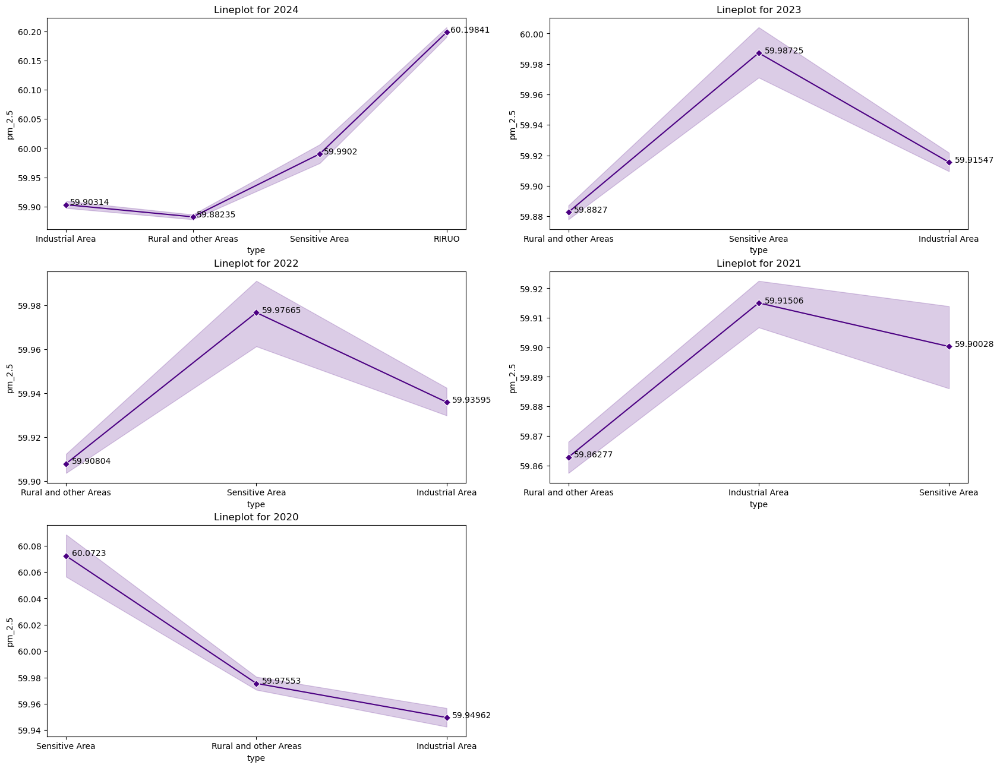

In [138]:
# How do PM2.5 levels vary Zonewise over the last 5 years using a line chart

yr=list(df['Year'].unique())
yr.sort(reverse=True)
yr=yr[:5]

plt.figure(figsize=(20,110))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    cl=sb.lineplot(x=yt['type'],y=yt['pm_2.5'],color='indigo',marker='D')
    for j in cl.get_lines():
        for a,b in zip(j.get_xdata(),j.get_ydata()):
            plt.text(a+0.03,b,round(b,5))
    plt.title(f'Lineplot for {yr[i]}')

plt.show()

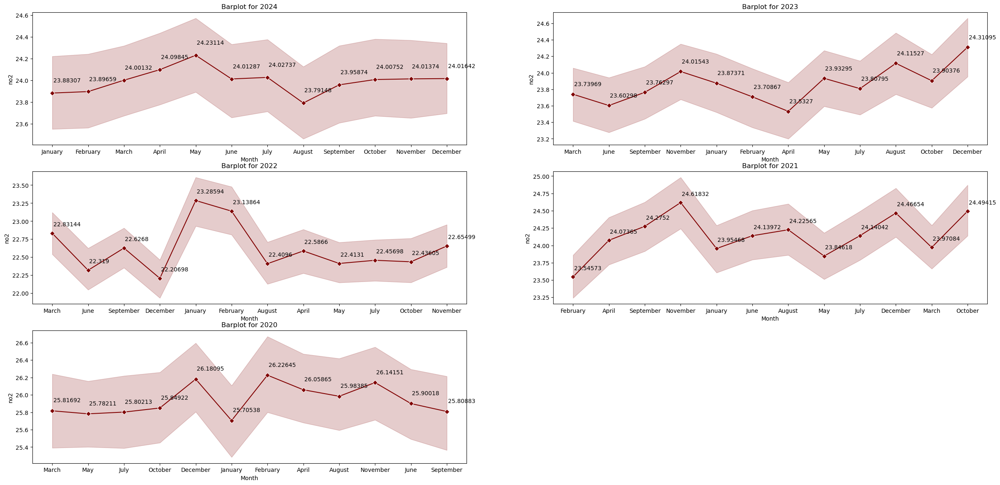

In [140]:
# What is the Monthly trend of NO2 levels over the past 5 years

yr=list(df['Year'].unique())
yr.sort(reverse=True)
yr=yr[:5]

plt.figure(figsize=(30,100))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    cl=sb.lineplot(x=yt['Month'],y=yt['no2'],color='maroon',marker='D')
    for j in cl.get_lines():
        for a,b in zip(j.get_xdata(),j.get_ydata()):
            plt.text(a+0.03,b+0.1,round(b,5))
    plt.title(f'Barplot for {yr[i]}')

plt.show()

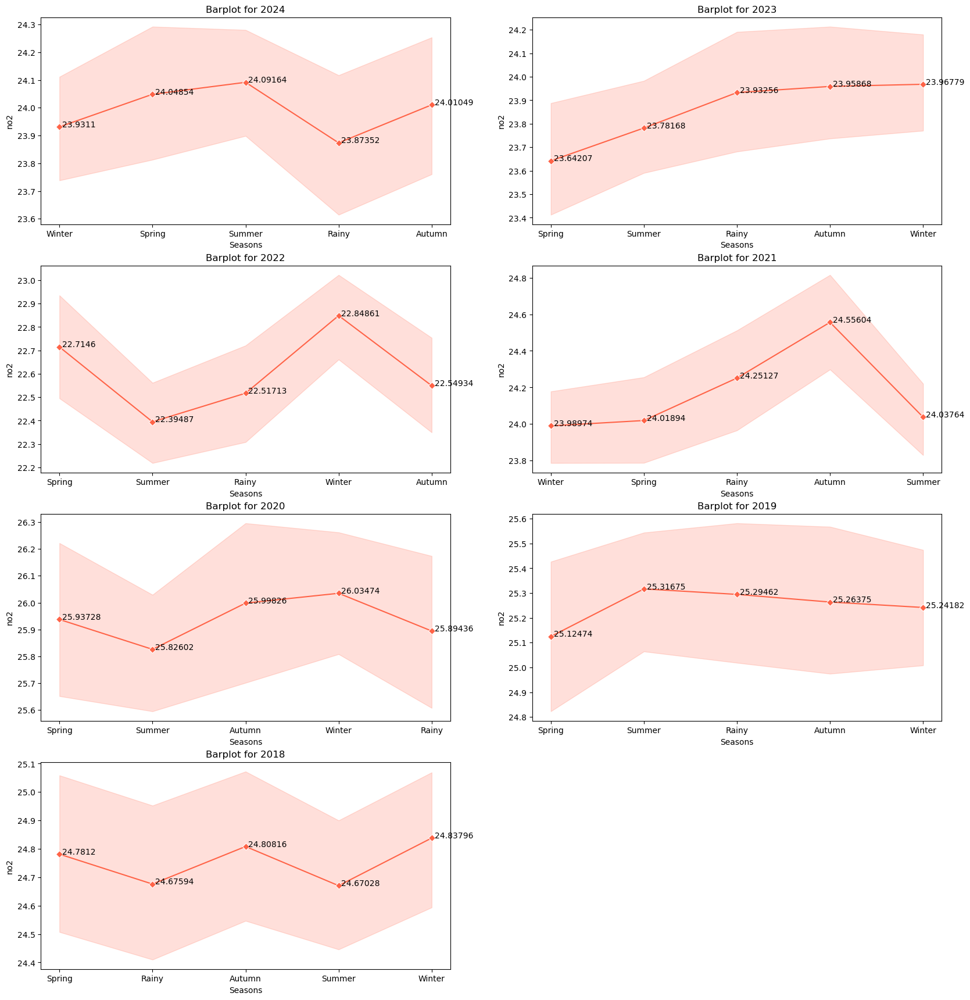

In [141]:
# Show a seasonal trend analysis of PM10 levels across different years

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(20,110))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    cl=sb.lineplot(x=yt['Seasons'],y=yt['no2'],color="#FF6347",marker='D')
    for j in cl.get_lines():
        for a,b in zip(j.get_xdata(),j.get_ydata()):
            plt.text(a+0.03,b,round(b,5))
    plt.title(f'Barplot for {yr[i]}')


plt.show()

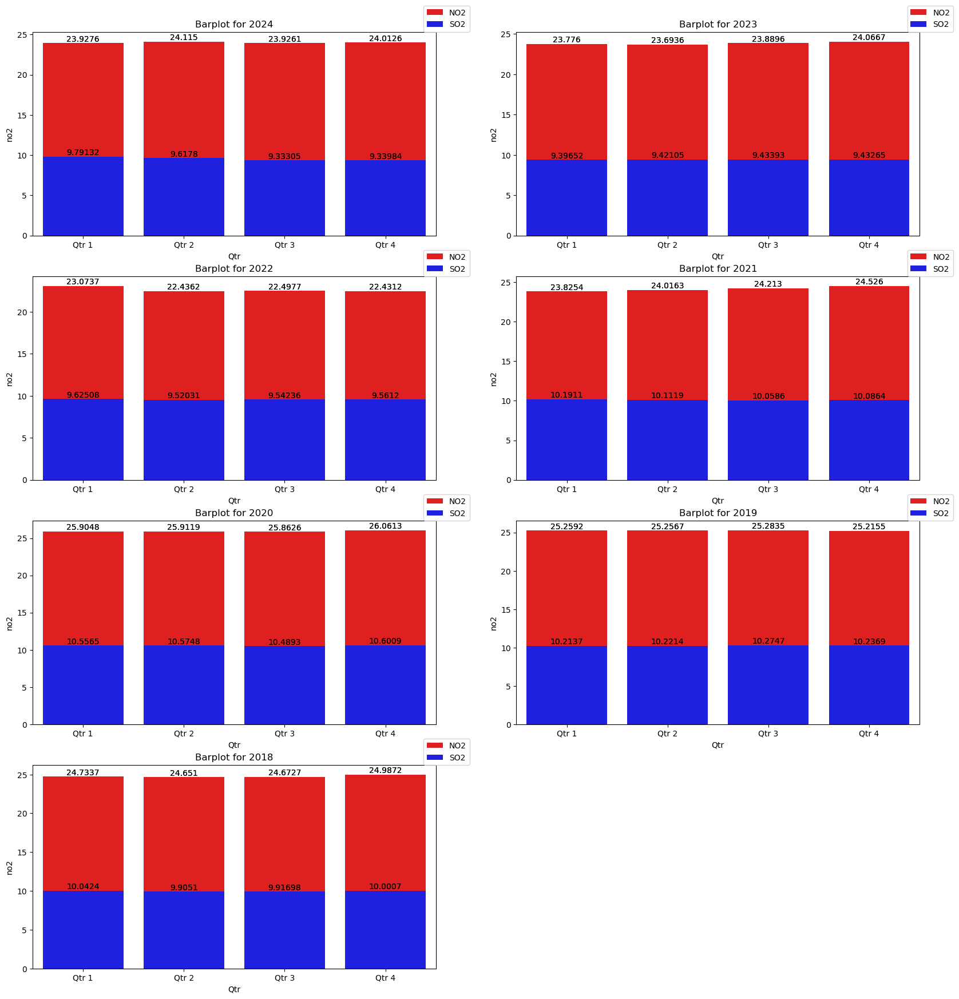

In [143]:
# Compare the quarterly pollution levels of SO2, NO2 using a stacked area chart.

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(20,110))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    c1=sb.barplot(x=yt['Qtr'],y=yt['no2'],color="red",label='NO2',errorbar=('ci',0))
    c2=sb.barplot(x=yt['Qtr'],y=yt['so2'],color="blue",label='SO2',errorbar=('ci',0))
    for j in c1.containers:
        c1.bar_label(j)
    for k in c1.containers:
        c1.bar_label(k)
    plt.title(f'Barplot for {yr[i]}')
    plt.legend(loc=(0.97,1))

plt.show()


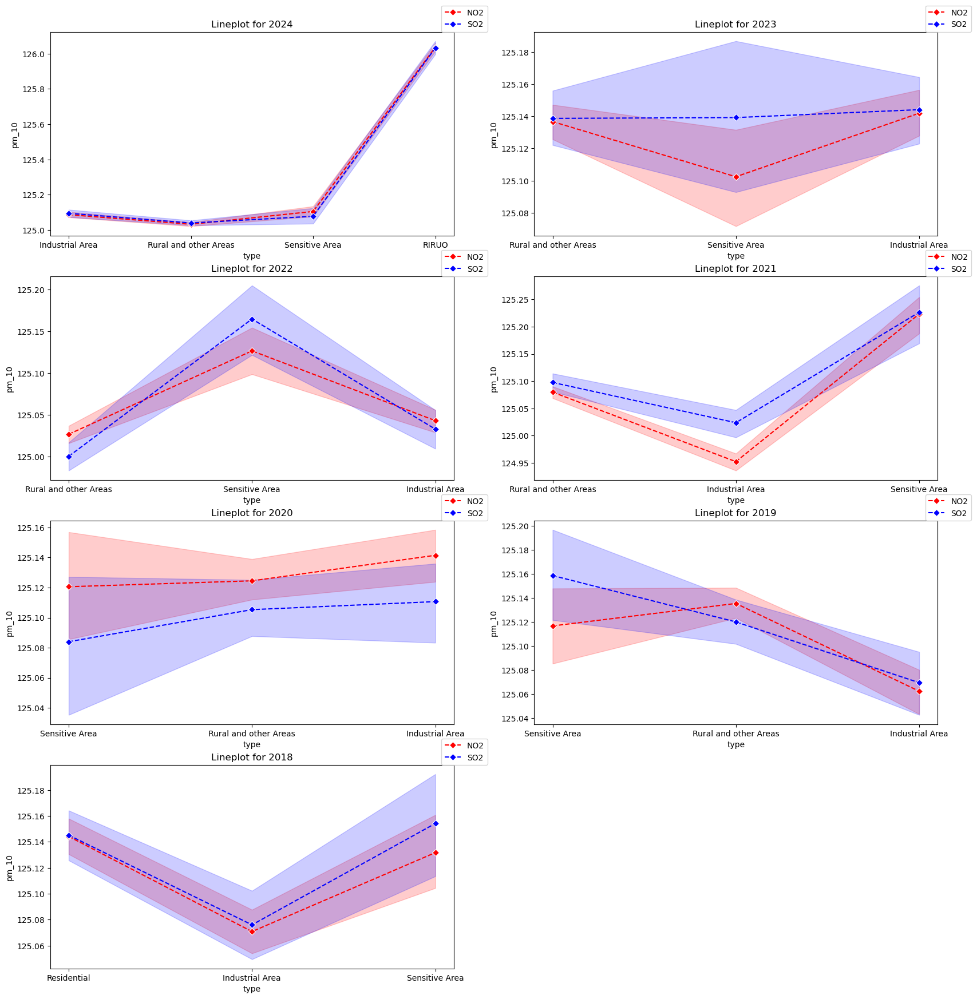

In [145]:
# How does air pollution PM 10 fluctuate on weekdays vs. weekends over time

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(20,110))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    wd=yt[yt['IsWeekend']=='Weekday']
    wk=yt[yt['IsWeekend']!='Weekday']
    c1=sb.lineplot(x=wd['type'],y=wd['pm_10'],color="red",label='NO2',marker='D',linestyle='--')
    c2=sb.lineplot(x=wk['type'],y=wk['pm_10'],color="blue",label='SO2',marker='D',linestyle='--')
    
    plt.title(f'Lineplot for {yr[i]}')
    plt.legend(loc=(0.97,1))    

    

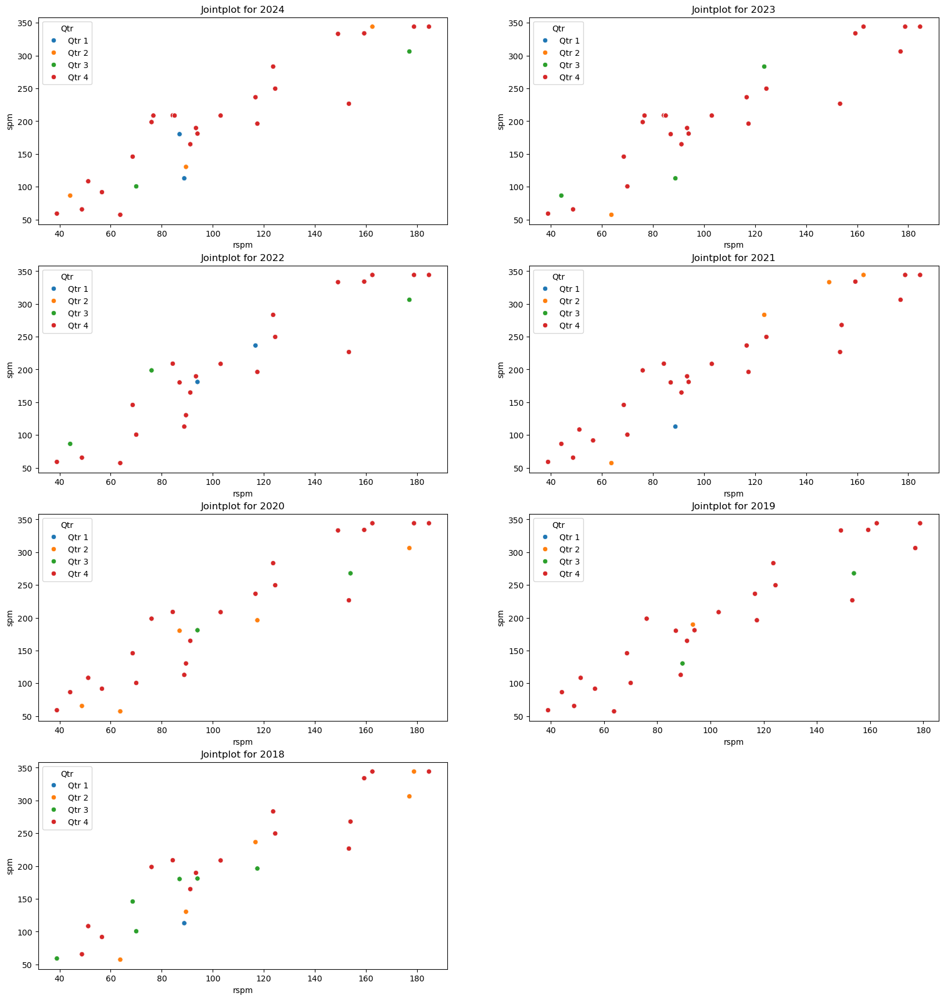

In [147]:
# Which Quarter of the year consistently show the highest Relattion between spm & rspm

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(20,110))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    sb.scatterplot(data=yt,x='rspm',y='spm',hue='Qtr')
    plt.title(f'Jointplot for {yr[i]}')

plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

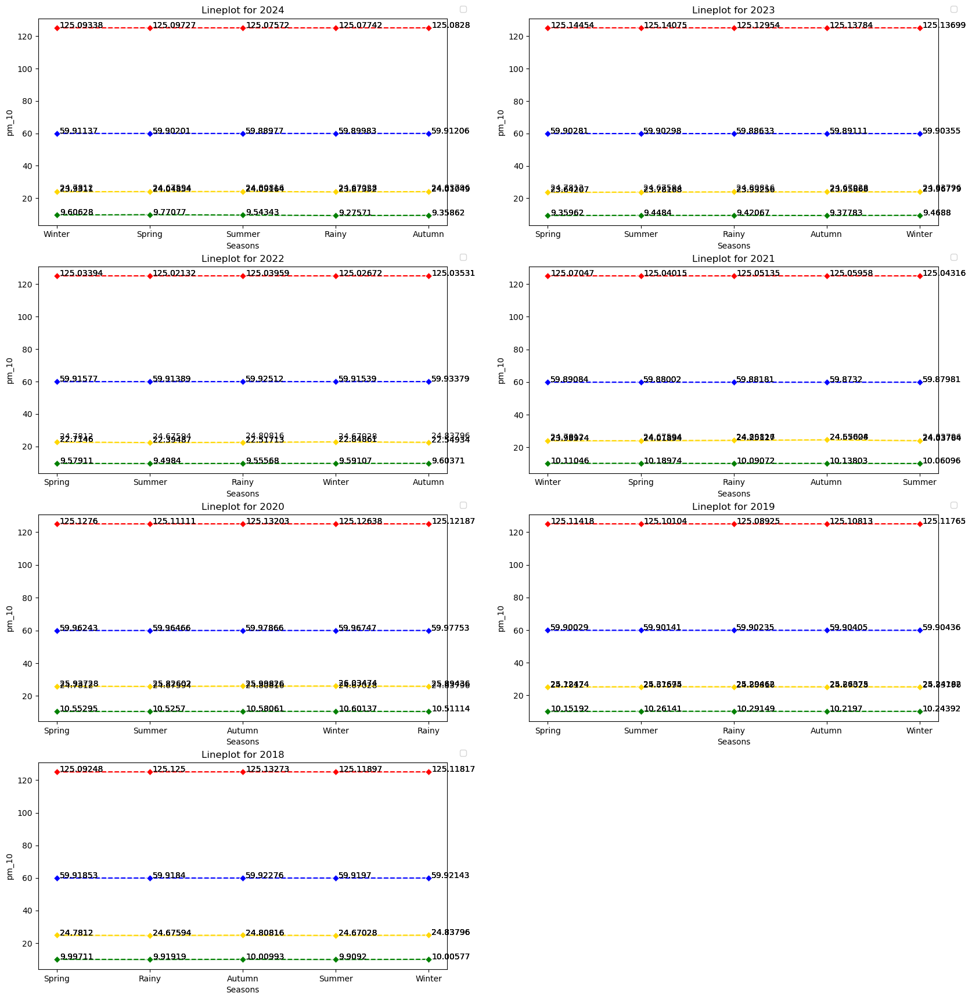

In [148]:
# Plot the yearly average SO2, NO2, PM10, PM 2.5 concentrations to observe long-term trends. 

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(20,110))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    c1=sb.lineplot(x=yt['Seasons'],y=yt['pm_10'],color="red",marker='D',linestyle='--')
    c2=sb.lineplot(x=yt['Seasons'],y=yt['pm_2.5'],color="blue",marker='D',linestyle='--')
    c3=sb.lineplot(x=yt['Seasons'],y=yt['so2'],color="green",marker='D',linestyle='--')
    c4=sb.lineplot(x=yt['Seasons'],y=yt['no2'],color="gold",marker='D',linestyle='--')

    for j in cl.get_lines():
        for a,b in zip(j.get_xdata(),j.get_ydata()):
            plt.text(a+0.03,b,round(b,5))
    for k in c2.get_lines():
        for c,d in zip(k.get_xdata(),k.get_ydata()):
            plt.text(c+0.03,d,round(d,5))
    for l in c3.get_lines():
        for e,f in zip(l.get_xdata(),l.get_ydata()):
            plt.text(e+0.03,f,round(f,5))
    for m in c4.get_lines():
        for g,h in zip(m.get_xdata(),m.get_ydata()):
            plt.text(g+0.03,h,round(h,5))

    
    plt.title(f'Lineplot for {yr[i]}')
    plt.legend(loc=(1.03,1.03))

plt.show()


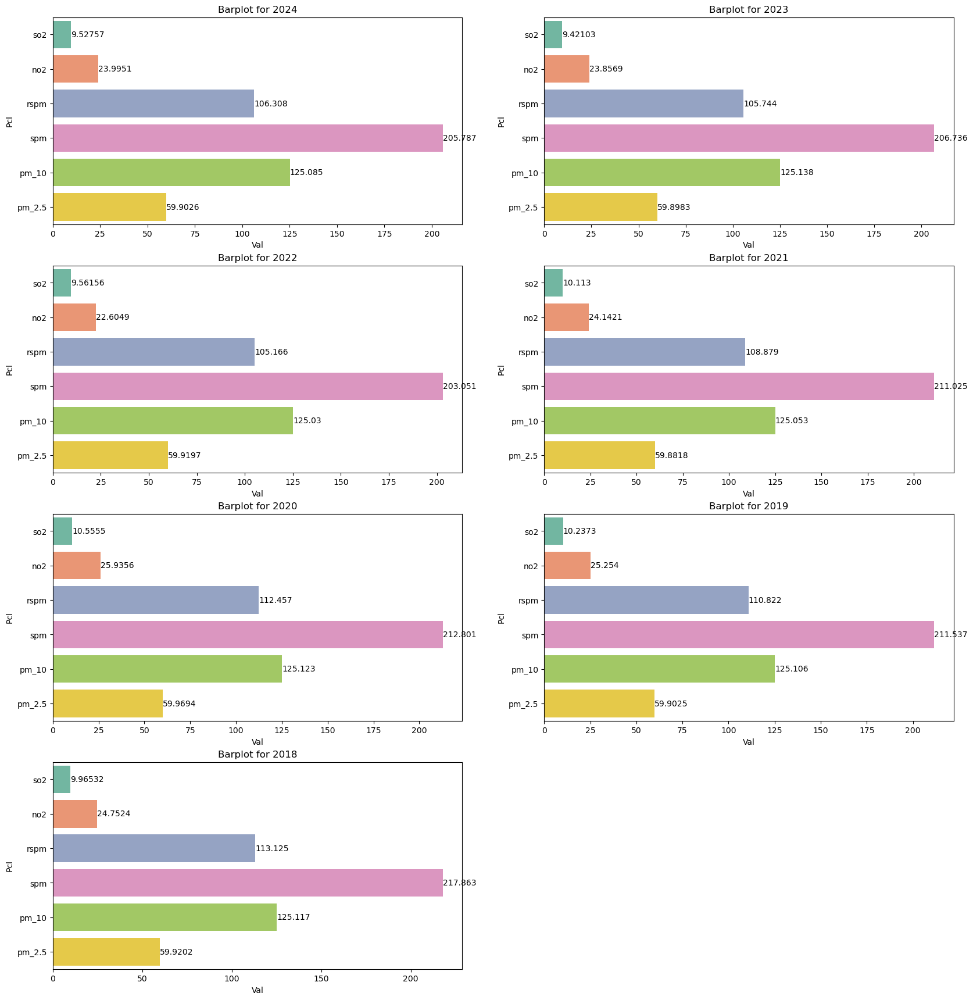

In [149]:
# Identify yearwise sharp increases or decreases in pollution using an visualization.

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

plt.figure(figsize=(20,110))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    xt=yt[clm].mean().reset_index()
    xt.columns=['Pcl','Val']
    cl=sb.barplot(y=xt['Pcl'],x=xt['Val'],palette='Set2')
    for j in cl.containers:
        cl.bar_label(j)
    plt.title(f'Barplot for {yr[i]}')

plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

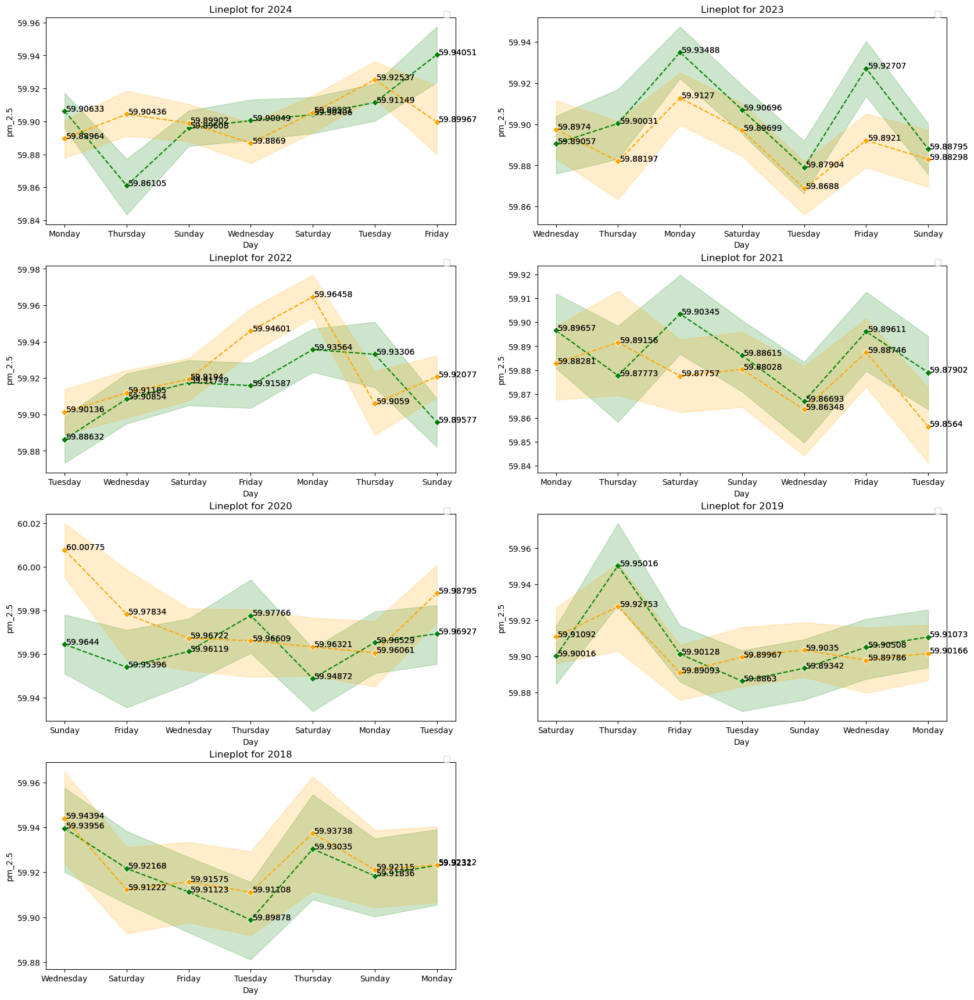

In [150]:
# How does pollution PM 2.5 vary 1st and 2nd half statewise Daywise

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(20,110))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    h1=yt[yt['Qtr'].isin(['Qtr 1','Qtr 2'])]
    h2=yt[yt['Qtr'].isin(['Qtr 3','Qtr 4'])]
    c1=sb.lineplot(x=h1['Day'],y=h1['pm_2.5'],color="green",marker='D',linestyle='--')
    c2=sb.lineplot(x=h2['Day'],y=h2['pm_2.5'],color="orange",marker='D',linestyle='--')

    for j in c1.get_lines():
        for a,b in zip(j.get_xdata(),j.get_ydata()):
            plt.text(a+0.03,b,round(b,5))
    for k in c2.get_lines():
        for c,d in zip(k.get_xdata(),k.get_ydata()):
            plt.text(c+0.03,d,round(d,5))    
    
    plt.title(f'Lineplot for {yr[i]}')
    plt.legend(loc=(0.97,1)) 

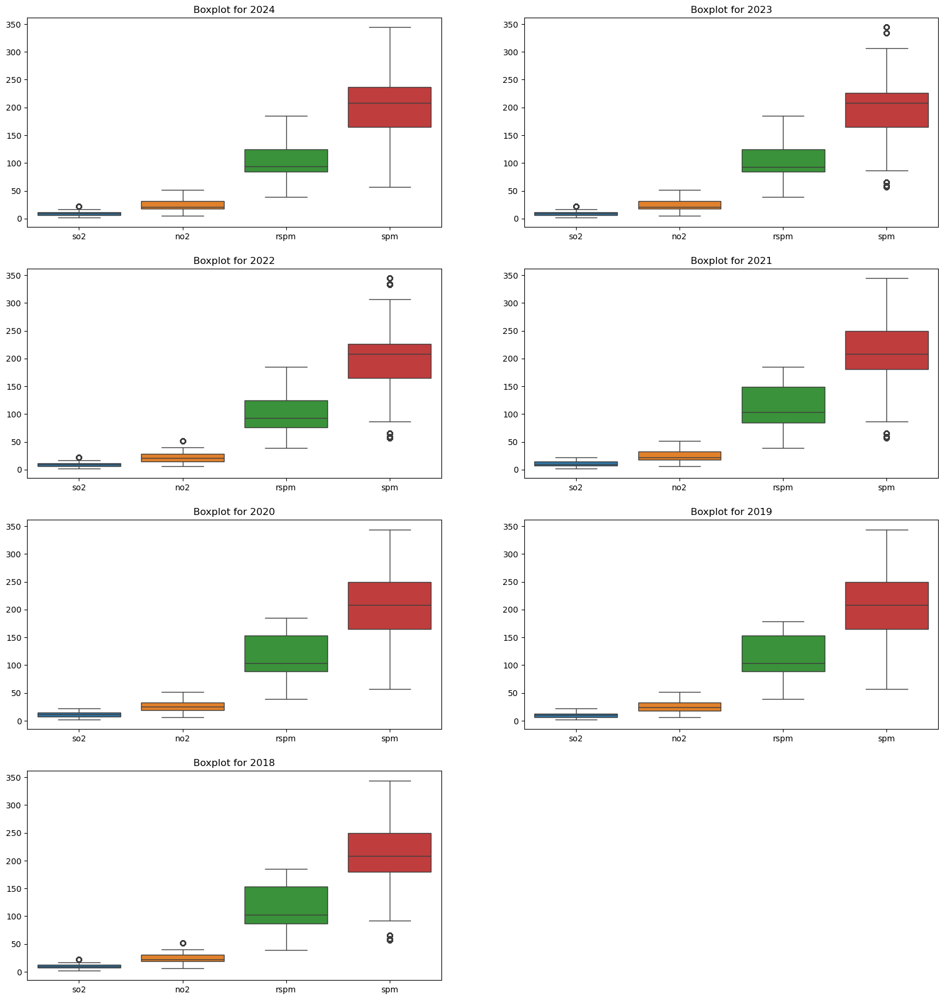

In [151]:
# Show the daily average pollution levels ('so2', 'no2', 'rspm', 'spm') across an entire year using boxplot.

yr=list(df['Year'].unique())
yr.sort(reverse=True)
cl=['so2', 'no2', 'rspm', 'spm']

plt.figure(figsize=(20,110))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    sb.boxplot(data=yt[cl])
    plt.title(f'Boxplot for {yr[i]}')

plt.show()

#### 2. Location & State-Based Visualizations

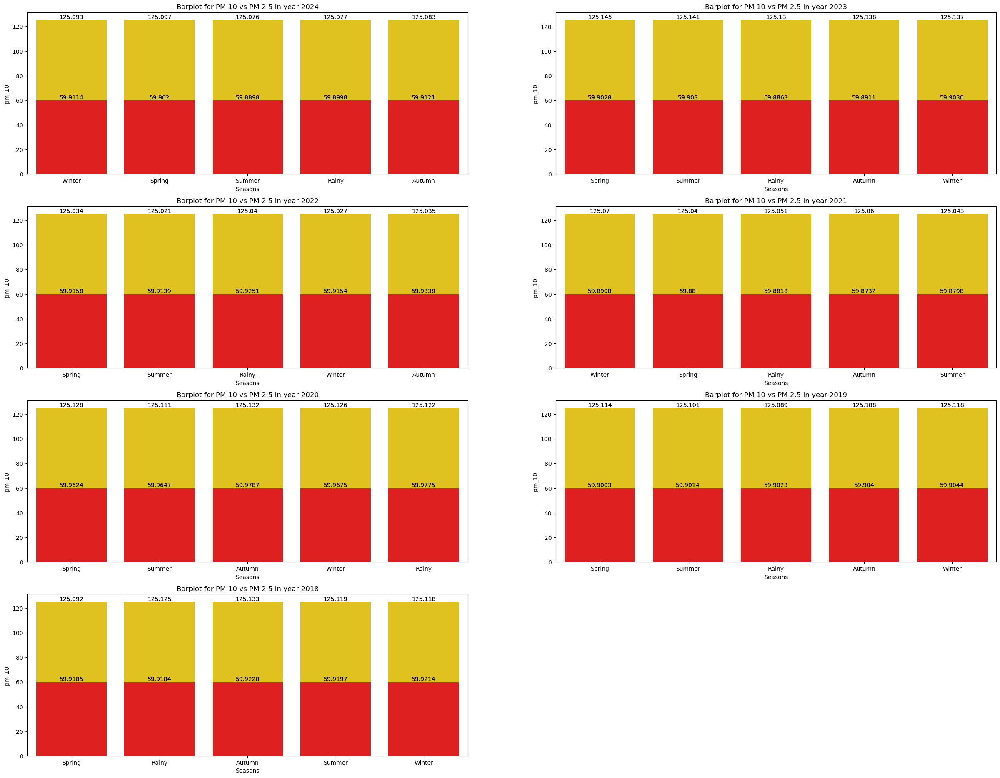

In [155]:
#  seasonwisewise have the  PM 2.5 vs PM 10 levels

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(30,120))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    c1=sb.barplot(x=yt['Seasons'],y=yt['pm_10'],color="gold",estimator='mean')
    c2=sb.barplot(x=yt['Seasons'],y=yt['pm_2.5'],color="red",estimator='mean')
    for j in c1.containers:
        c1.bar_label(j)
    for k in c2.containers:
        c2.bar_label(k)
    plt.title(f'Barplot for PM 10 vs PM 2.5 in year {yr[i]}')

plt.show()

Graph 1 : Boxplot for North and West
Graph 2 : Boxplot for South and East


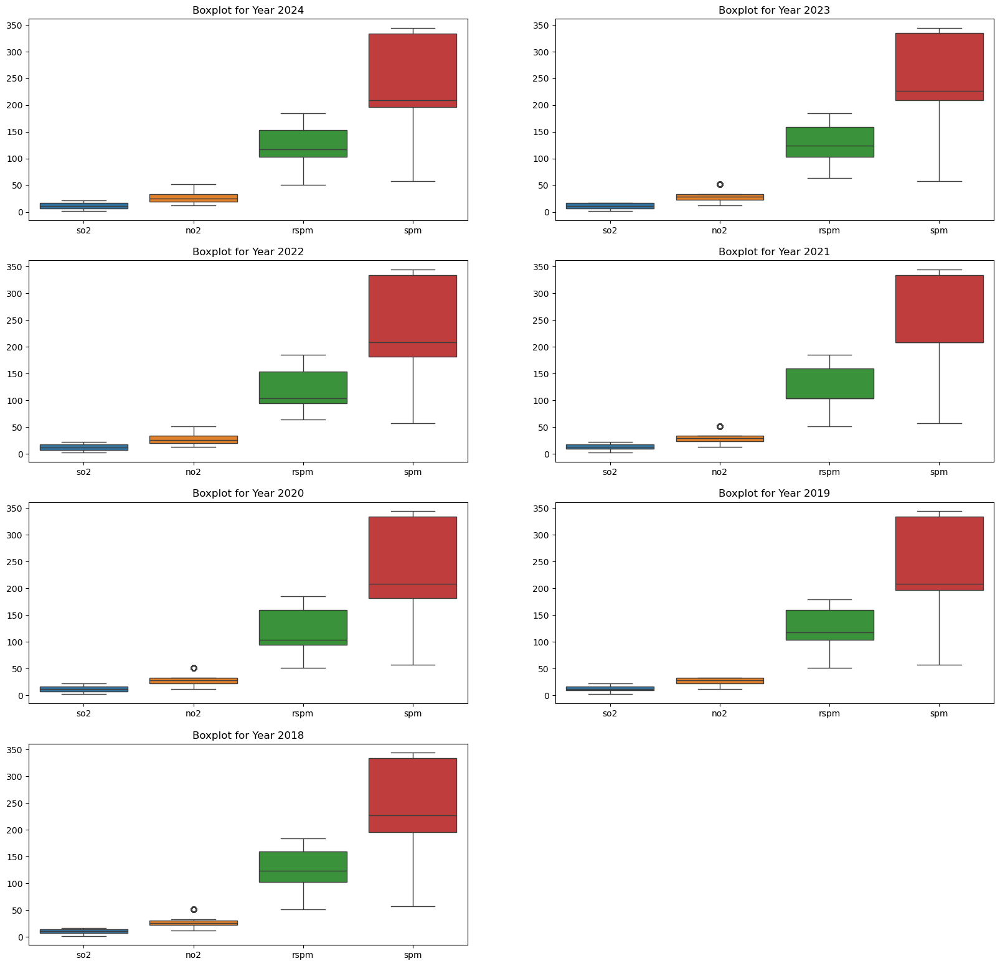

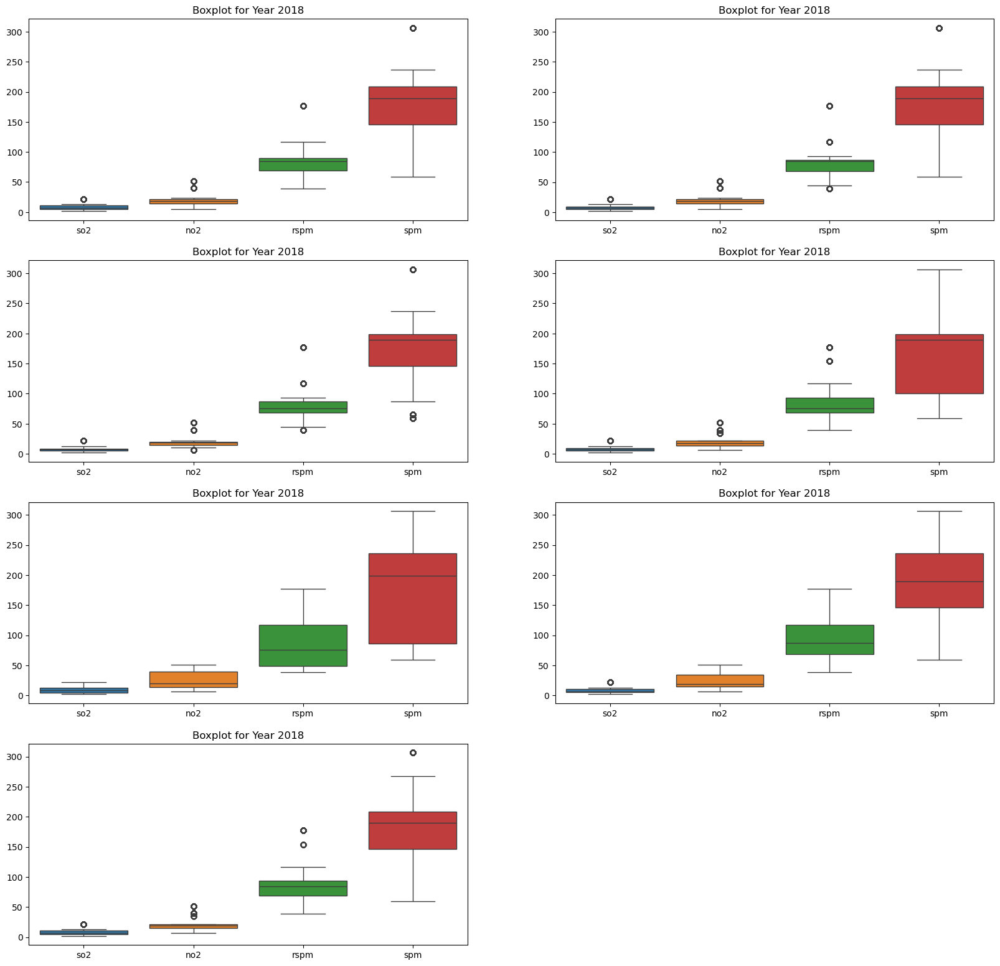

In [157]:
# Compare pollution levels in nort and west vs. south and east  locations using a box plot.

yr=list(df['Year'].unique())
yr.sort(reverse=True)
cl=['so2', 'no2', 'rspm', 'spm']

print('Graph 1 : Boxplot for North and West')
plt.figure(figsize=(20,100))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    h1=yt[yt['region'].isin(['North', 'West'])]
    plt.subplot(20,2,i+1)
    sb.boxplot(data=h1[cl])
    plt.title(f'Boxplot for Year {yr[i]}')

print('Graph 2 : Boxplot for South and East')
plt.figure(figsize=(20,100))
for j in range(len(yr)):
    yt=df[df['Year']==yr[j]]
    h2=yt[yt['region'].isin(['South', 'East'])]
    plt.subplot(20,2,j+1)
    sb.boxplot(data=h2[cl])
    plt.title(f'Boxplot for Year {yr[i]}')
    

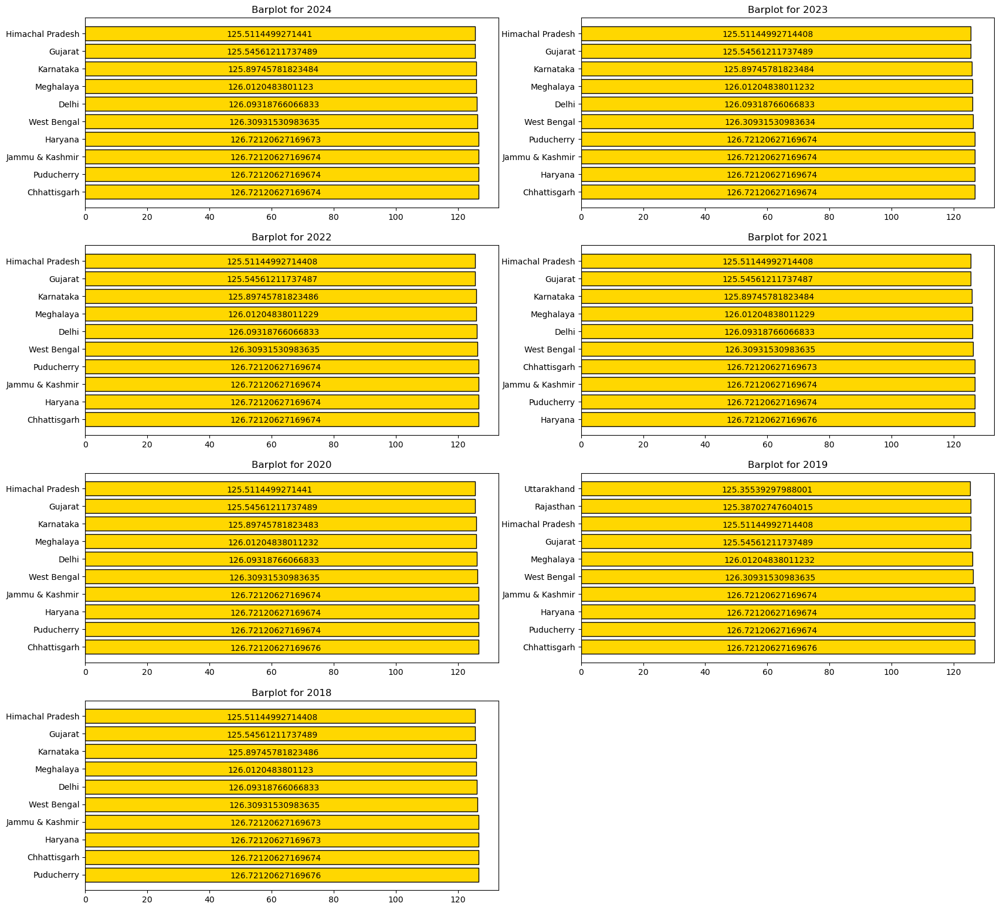

In [159]:
# What are the top 10 most polluted locations in the dataset having High PM 10 ?

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

plt.figure(figsize=(20,100))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    s=yt.groupby('state')['pm_10'].mean().reset_index()
    st=s.sort_values(by='pm_10',ascending=False).iloc[:10]
    plt.barh(st['state'],st['pm_10'],color='gold',edgecolor='black')
    for j ,k in enumerate(st['pm_10']):
        plt.text(k-80,j-0.2,str(k))
    
    plt.title(f'Barplot for {yr[i]}')


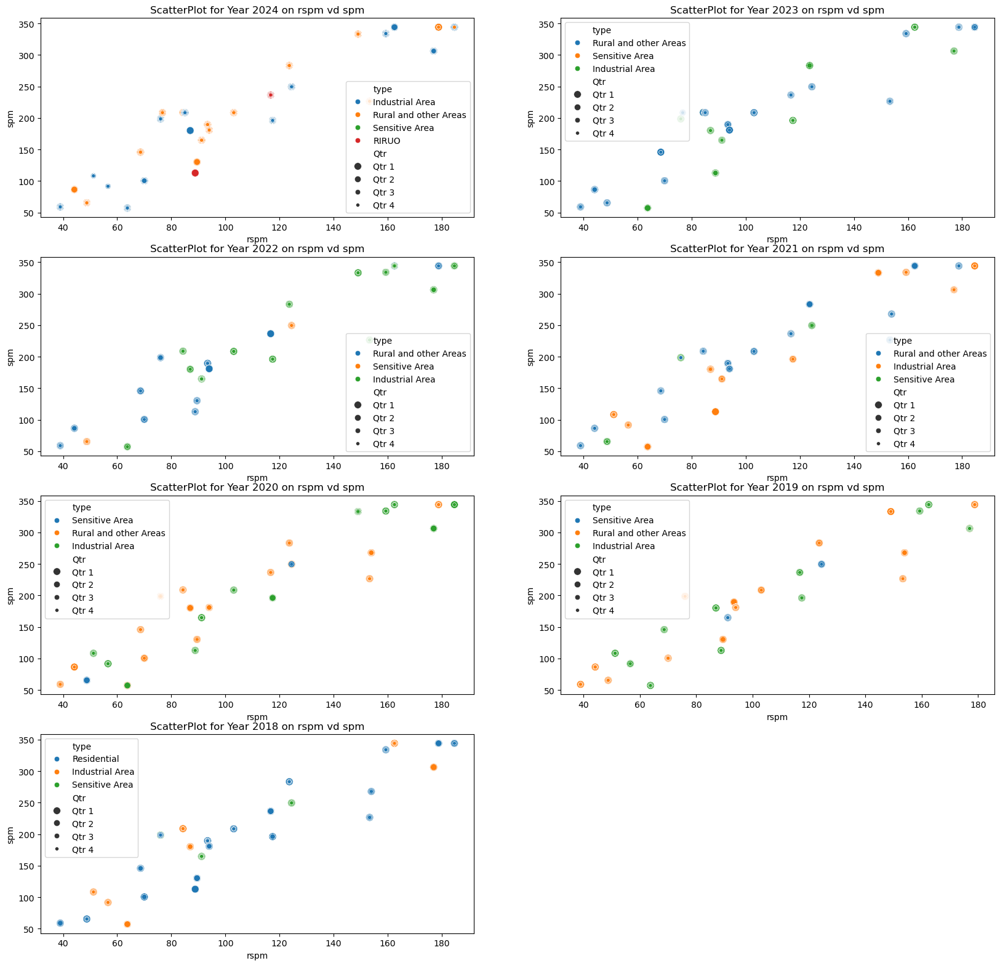

In [160]:
# Visualize relationship b/w pm_10 and spm using scatterplot zonewise , along  quarterwisww

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(20,100))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    sb.scatterplot(data=yt,x='rspm',y='spm',hue='type',size='Qtr')
    plt.title(f'ScatterPlot for Year {yr[i]} on rspm vd spm')
plt.show()


Graph 1: Graph for 1st half (Qtr 1 & Qtr2)
Graph 2: Graph for 2nd half (Qtr 3 & Qtr4)


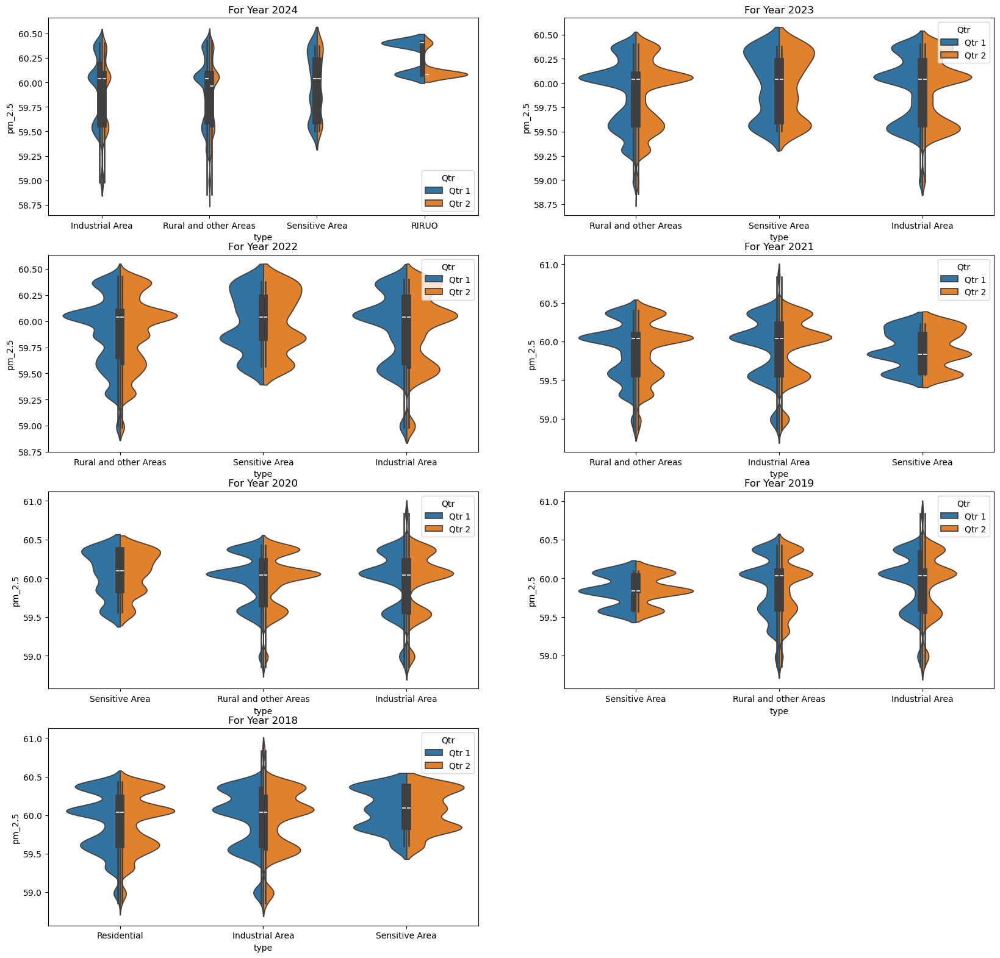

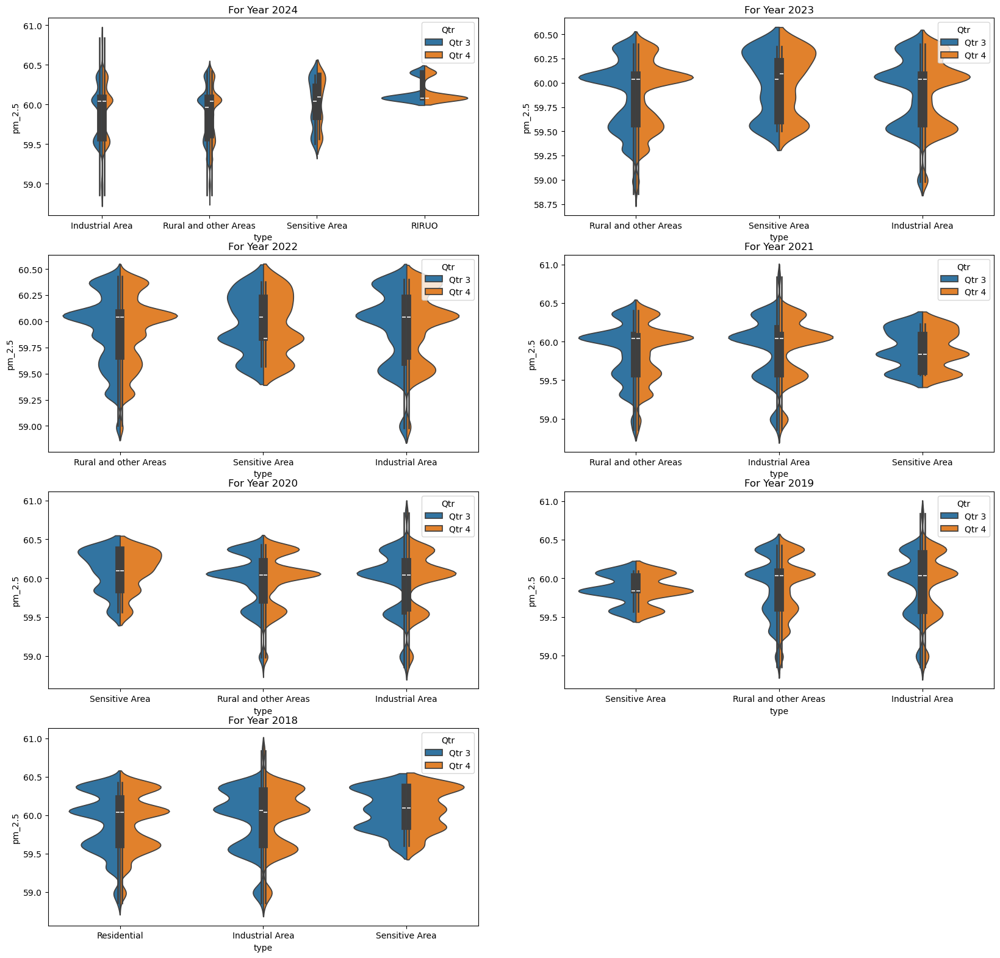

In [161]:
# How do PM 2.5  differ  zonewise across 1st half vs. 2nd half? (Violin Chart)

yr=list(df['Year'].unique())
yr.sort(reverse=True)

print('Graph 1: Graph for 1st half (Qtr 1 & Qtr2)')
print('Graph 2: Graph for 2nd half (Qtr 3 & Qtr4)')

plt.figure(figsize=(20,100))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    h1=yt[yt['Qtr'].isin(['Qtr 1','Qtr 2'])]
    plt.subplot(20,2,i+1)
    sb.violinplot(data=h1,x='type',y='pm_2.5',hue='Qtr',split=True)
    plt.title(f'For Year {yr[i]}')

plt.figure(figsize=(20,100))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    h2=yt[yt['Qtr'].isin(['Qtr 3','Qtr 4'])]
    plt.subplot(20,2,i+1)
    sb.violinplot(data=h2,x='type',y='pm_2.5',hue='Qtr',split=True)
    plt.title(f'For Year {yr[i]}')

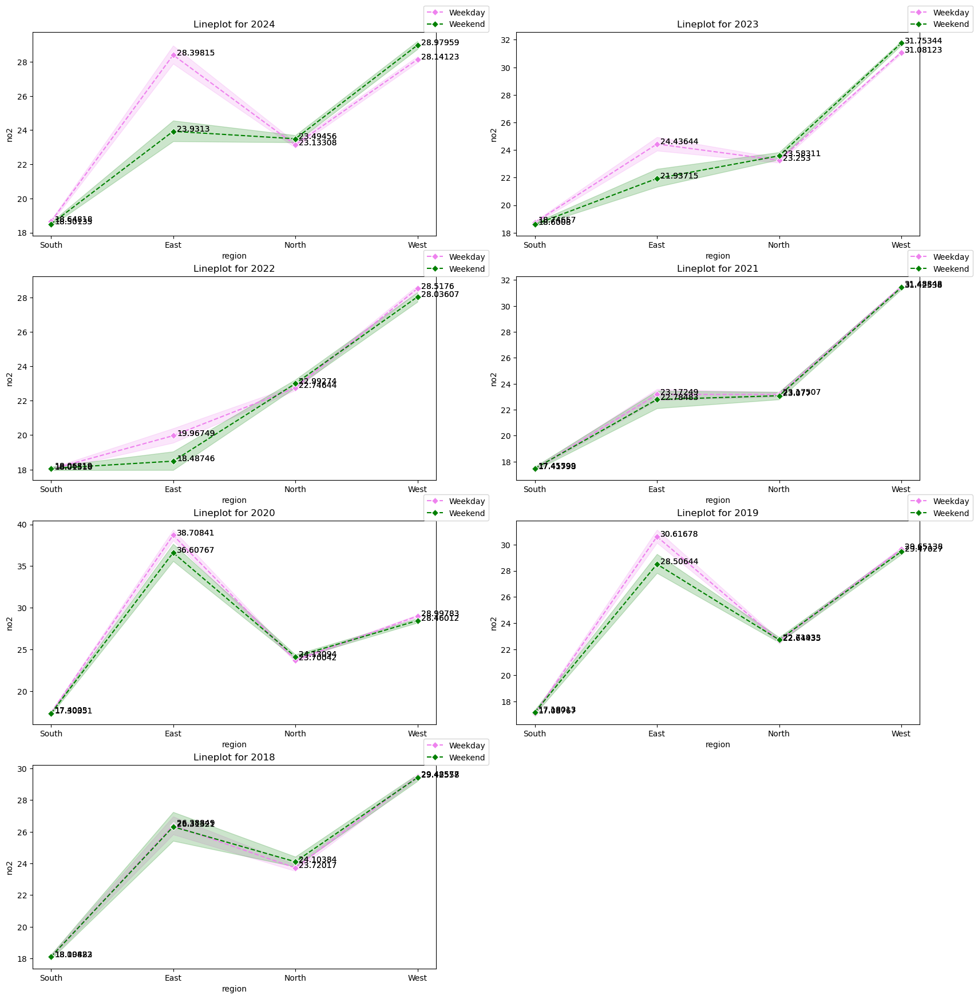

In [162]:
#  Compare the NO2 pollution trends for the regions in weekend and weekdays over time.

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(20,110))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    h1=yt[yt['IsWeekend']=='Weekday']
    h2=yt[yt['IsWeekend']=='Weekend']
    c1=sb.lineplot(x=h1['region'],y=h1['no2'],label='Weekday',color="violet",marker='D',linestyle='--')
    c2=sb.lineplot(x=h2['region'],y=h2['no2'],label='Weekend',color="green",marker='D',linestyle='--')

    for j in c1.get_lines():
        for a,b in zip(j.get_xdata(),j.get_ydata()):
            plt.text(a+0.03,b,round(b,5))
    for k in c2.get_lines():
        for c,d in zip(k.get_xdata(),k.get_ydata()):
            plt.text(c+0.03,d,round(d,5))    
    
    plt.title(f'Lineplot for {yr[i]}')
    plt.legend(loc=(0.97,1)) 

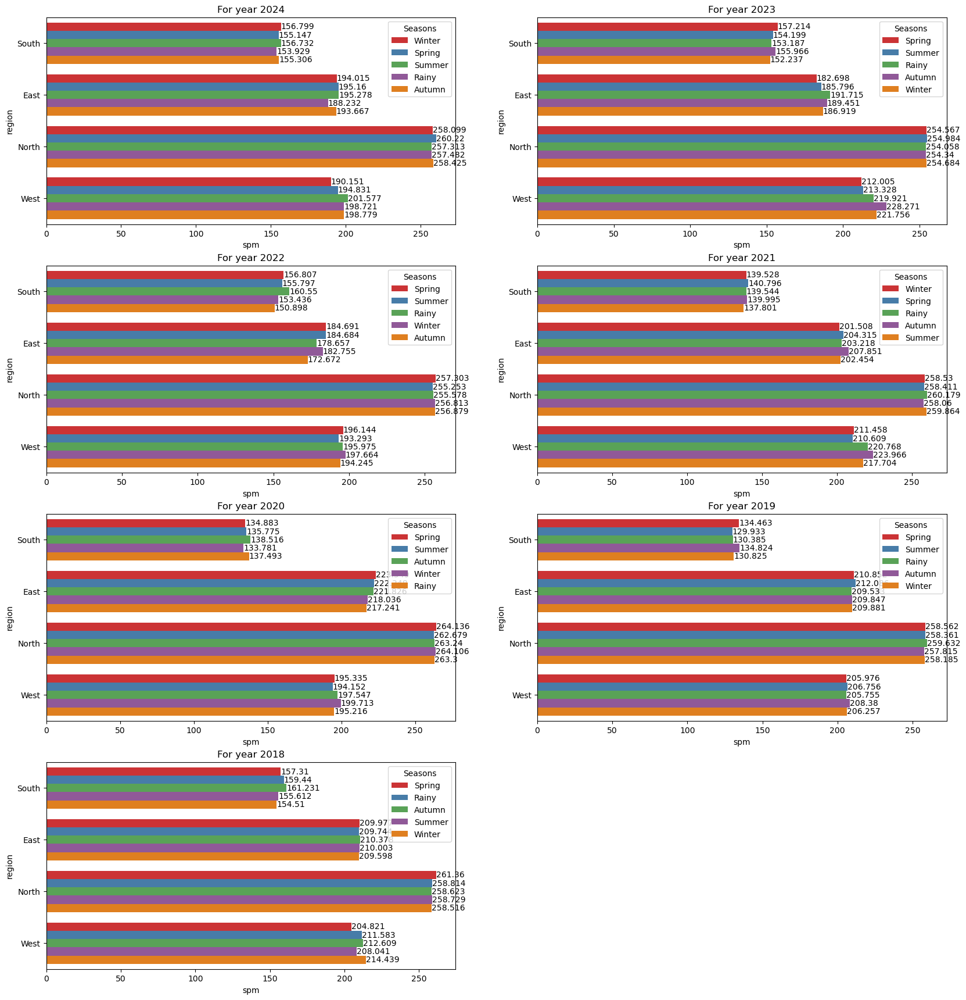

In [163]:
# Which region show the largest seasonal variations in pollution

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(20,110))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    cl=sb.barplot(data=yt,y='region',x='spm',hue='Seasons',errorbar=('ci',0),palette='Set1')
    for j in cl.containers:
        cl.bar_label(j)
    plt.title(f'For year {yr[i]}')

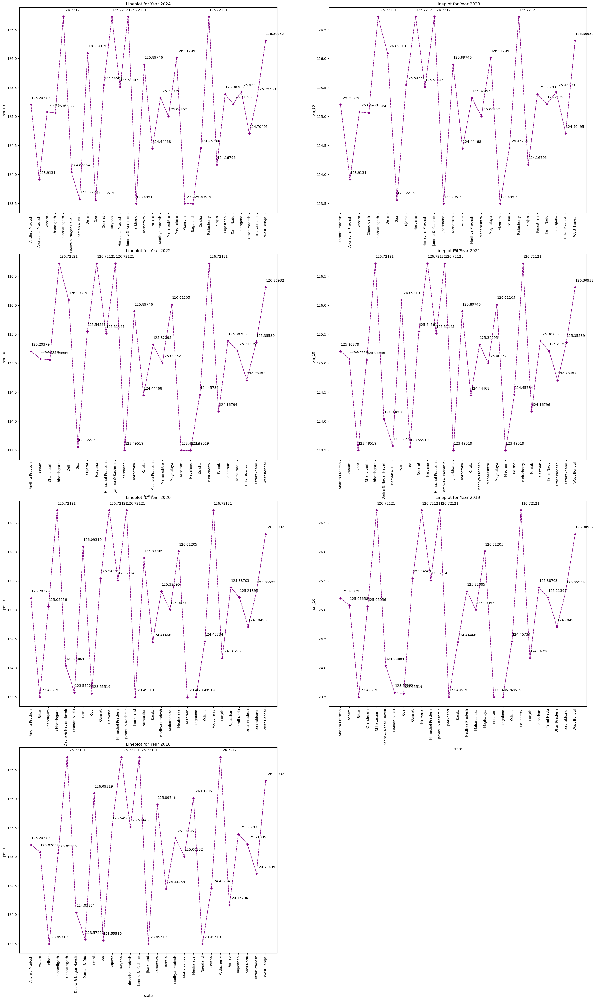

In [164]:
# Use Lineplot to show the distribution of PM 10 contributors across state

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(30,260))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    cl=sb.lineplot(data=yt,x='state',y='pm_10',marker='D',color='purple',linestyle='--')
    for j in cl.get_lines():
        for a,b in zip(j.get_xdata(),j.get_ydata()):
            plt.text(a+0.03,b+0.1,round(b,5))
    plt.title(f'Lineplot for Year {yr[i]}')
    plt.xticks(rotation=90)

plt.show()


Graph 1: Graph for 1st half (Qtr 1 & Qtr2)
Graph 2: Graph for 2nd half (Qtr 3 & Qtr4)


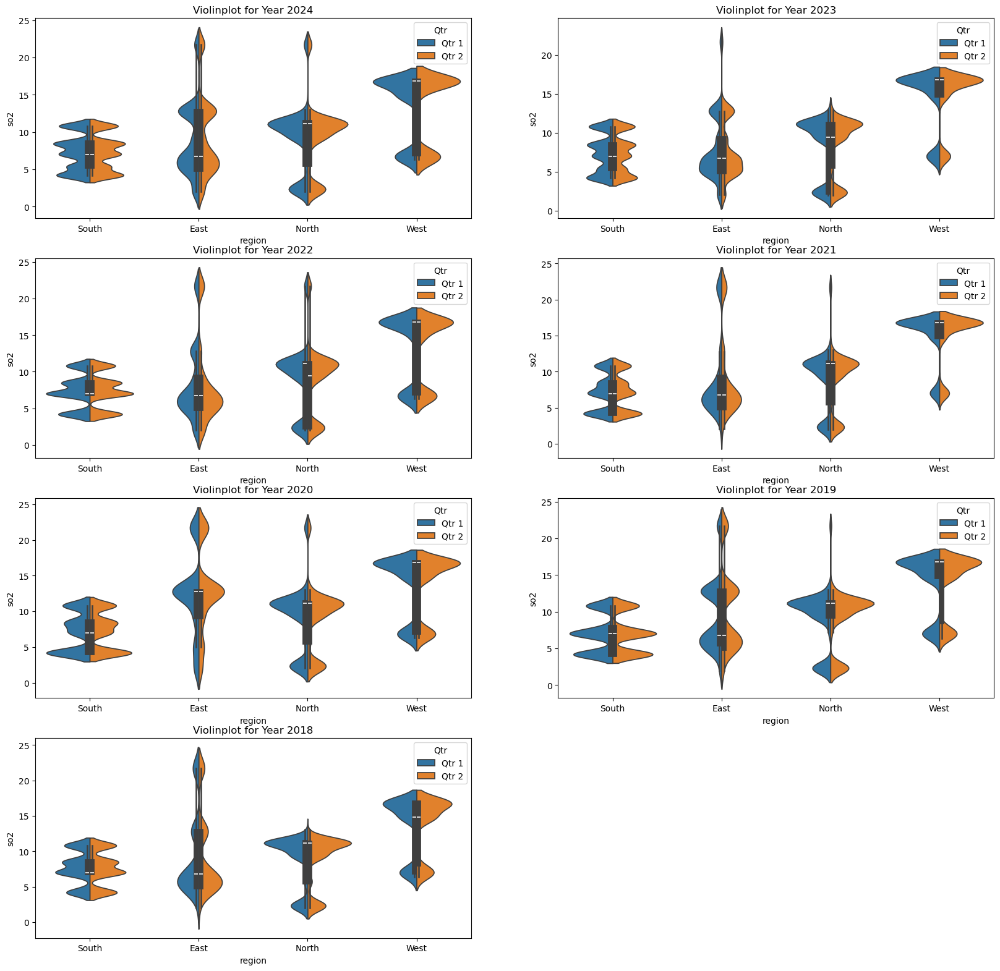

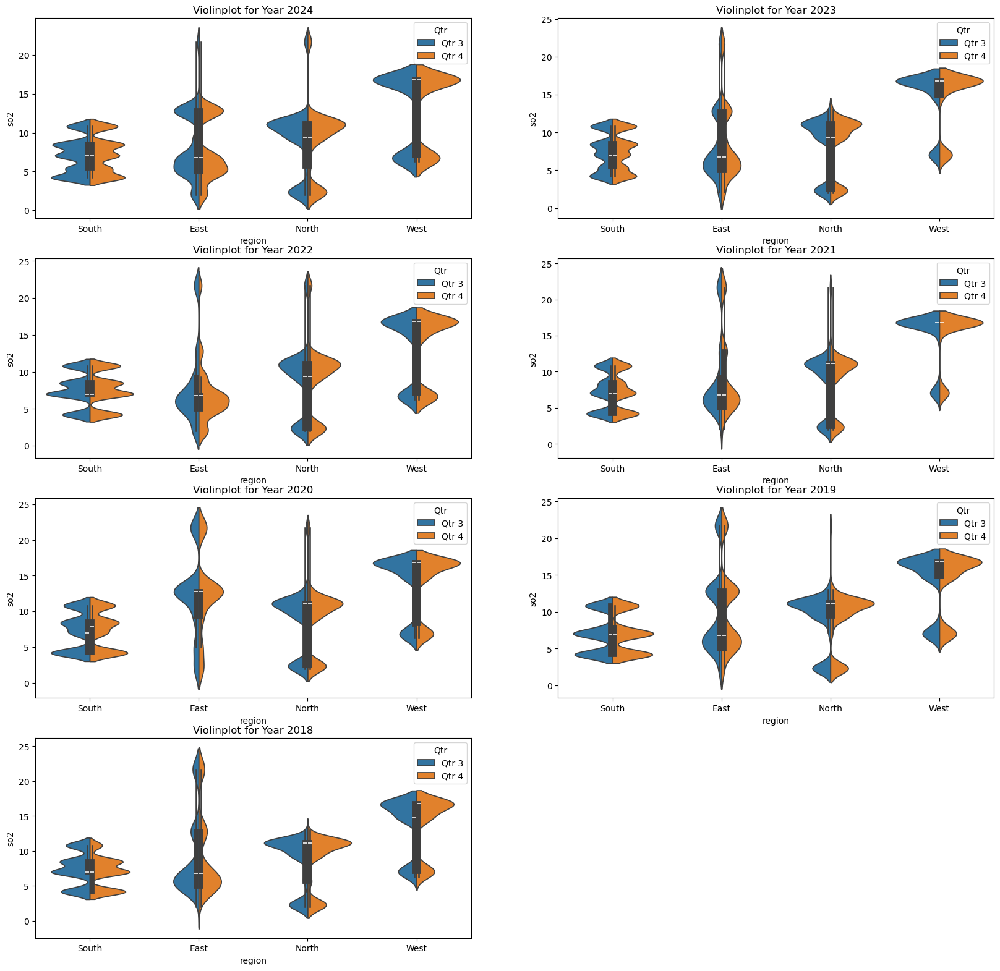

In [165]:
# Show pollution (SO2) across different regions using a violinplot on a map for 1st and 2nd half

yr=list(df['Year'].unique())
yr.sort(reverse=True)

print('Graph 1: Graph for 1st half (Qtr 1 & Qtr2)')
print('Graph 2: Graph for 2nd half (Qtr 3 & Qtr4)')

plt.figure(figsize=(20,100))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    h1=yt[yt['Qtr'].isin(['Qtr 1','Qtr 2'])]
    plt.subplot(20,2,i+1)
    sb.violinplot(data=h1,x='region',y='so2',hue='Qtr',split=True)
    plt.title(f'Violinplot for Year {yr[i]}')

plt.figure(figsize=(20,100))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    h2=yt[yt['Qtr'].isin(['Qtr 3','Qtr 4'])]
    plt.subplot(20,2,i+1)
    sb.violinplot(data=h2,x='region',y='so2',hue='Qtr',split=True)
    plt.title(f'Violinplot for Year {yr[i]}')

plt.show()

Graph 1: For States
Graph 2: For Union Terotory


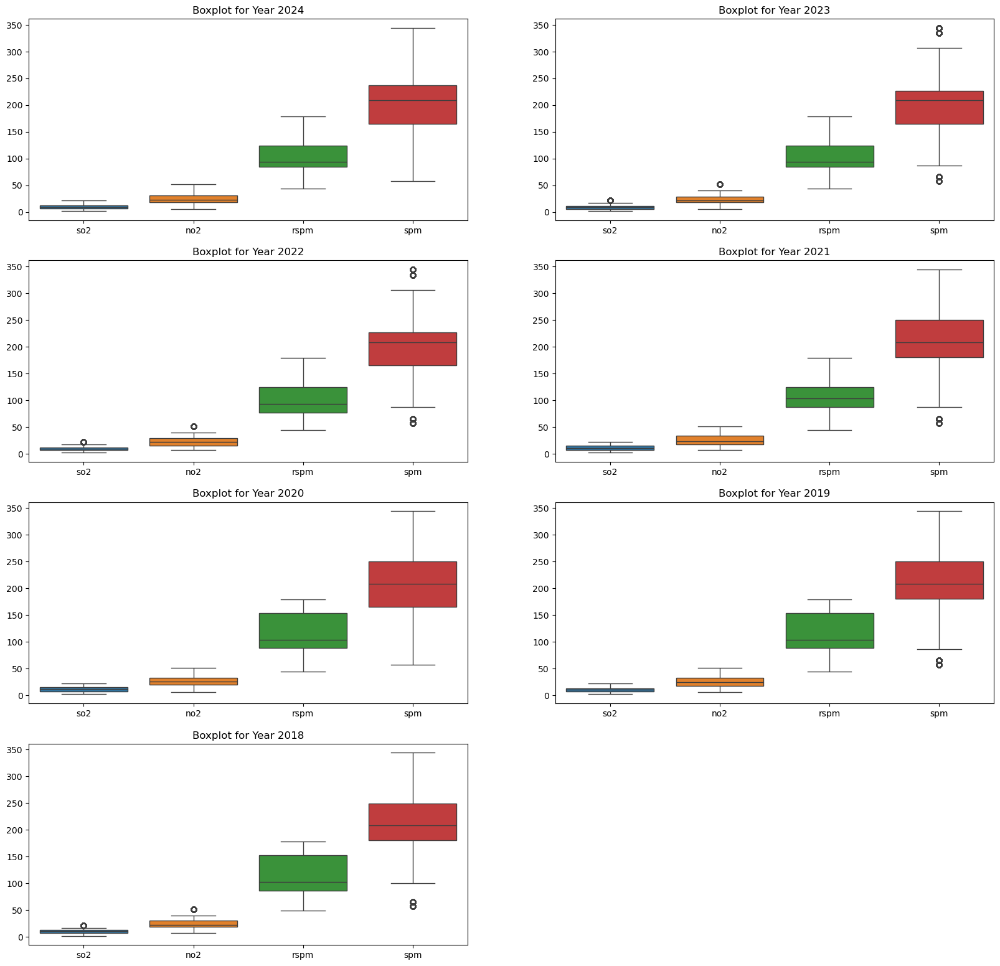

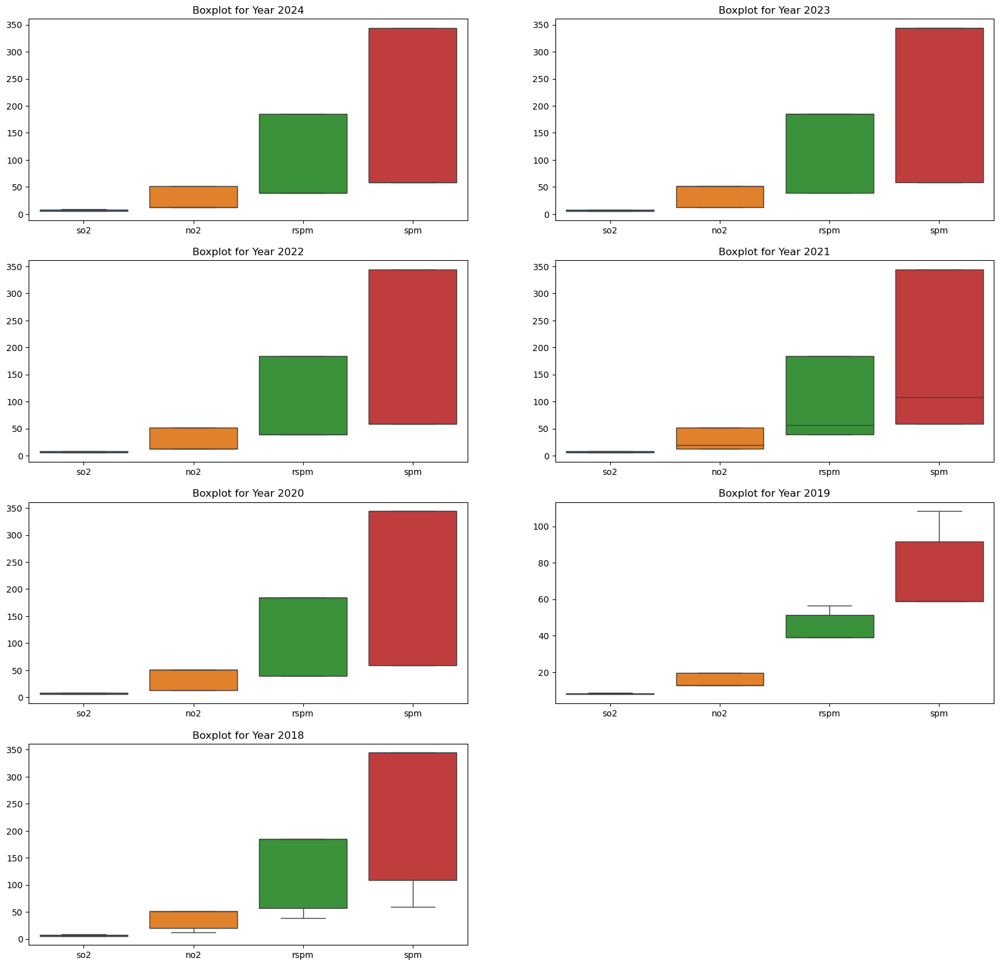

In [166]:
# Compare pollution in capital cities vs. other cities using a box plot.

yr=list(df['Year'].unique())
yr.sort(reverse=True)
ut=['Daman & Diu','Delhi', 'Puducherry','Dadra & Nagar Haveli']
clm=['so2', 'no2', 'rspm', 'spm']

print('Graph 1: For States')
print('Graph 2: For Union Terotory')

plt.figure(figsize=(20,100))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    h1=yt[~(yt['state'].isin(ut))]
    plt.subplot(20,2,i+1)
    sb.boxplot(h1[clm])
    plt.title(f'Boxplot for Year {yr[i]}')

plt.figure(figsize=(20,100))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    h2=yt[yt['state'].isin(ut)]
    plt.subplot(20,2,i+1)
    sb.boxplot(h2[clm])
    plt.title(f'Boxplot for Year {yr[i]}')


#### 3. Pollutant-Specific Comparisons

Graph 1: SO2 vs NO2
Graph 2: PM 10 vs PM 2.5


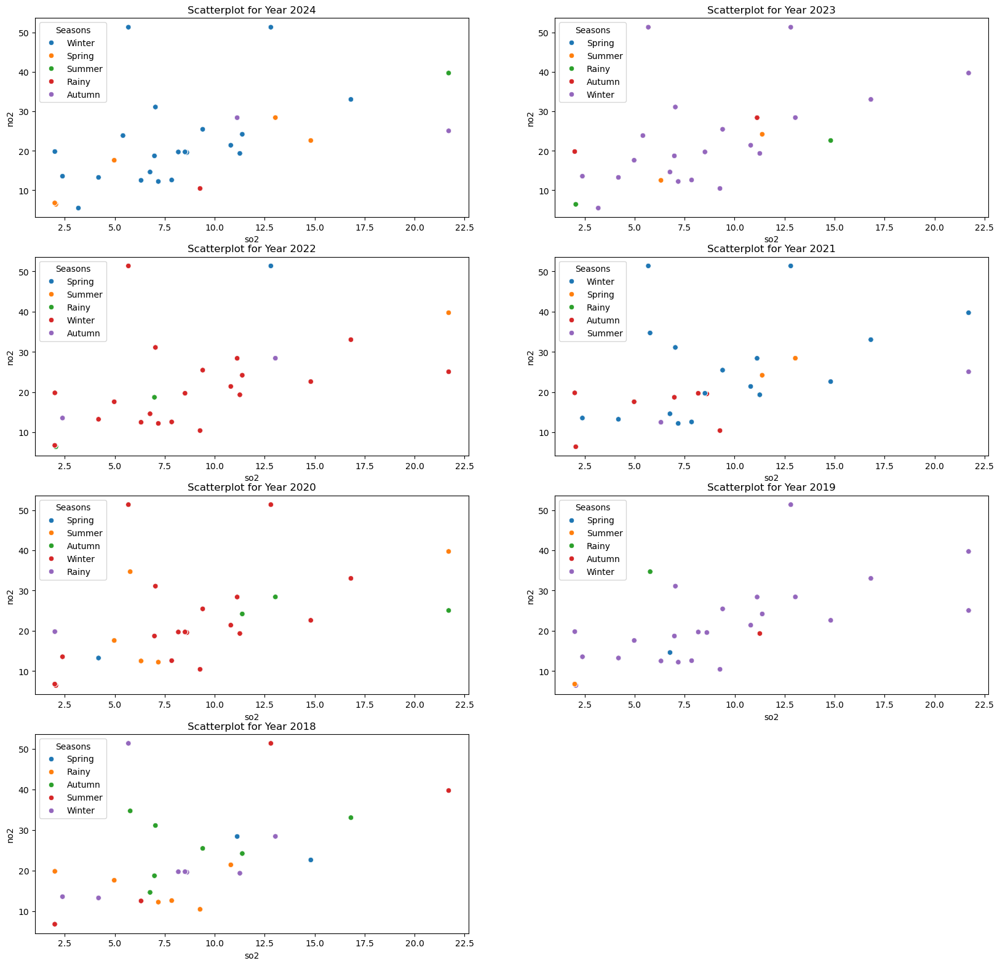

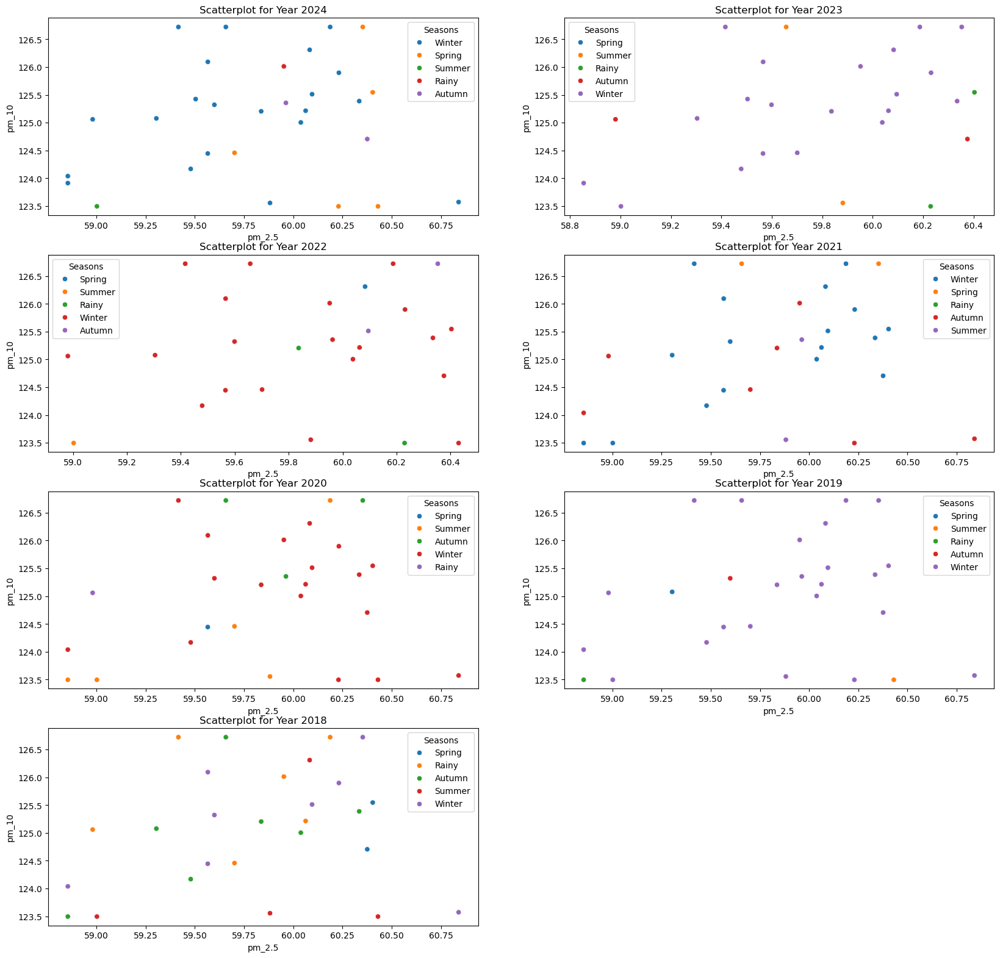

In [168]:
#  How do SO2, NO2, PM10, and PM2.5 correlate with each other Seasonwise

yr=list(df['Year'].unique())
yr.sort(reverse=True)

print('Graph 1: SO2 vs NO2')
print('Graph 2: PM 10 vs PM 2.5')

plt.figure(figsize=(20,100))
for i in range(len(yr)):
    yt1=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    sb.scatterplot(data=yt1,x='so2',y='no2',hue='Seasons')
    plt.title(f'Scatterplot for Year {yr[i]}')

plt.figure(figsize=(20,100))
for i in range(len(yr)):
    yt2=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    sb.scatterplot(data=yt2,x='pm_2.5',y='pm_10',hue='Seasons')
    plt.title(f'Scatterplot for Year {yr[i]}')

plt.show()

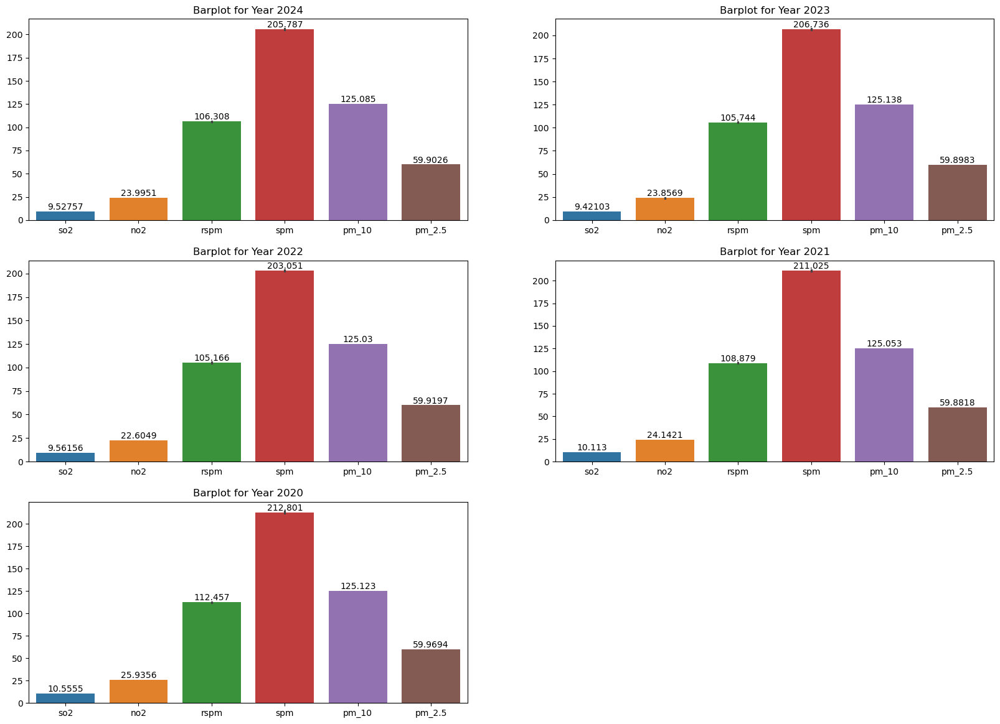

In [169]:
#  Which pollutant has shown the most significant increase over the last 5 years

yr=list(df['Year'].unique())
yr.sort(reverse=True)
yr=yr[:5]
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

plt.figure(figsize=(20,100))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    cl=sb.barplot(data=yt[clm])
    for j in cl.containers:
        cl.bar_label(j)
    plt.title(f'Barplot for Year {yr[i]}')

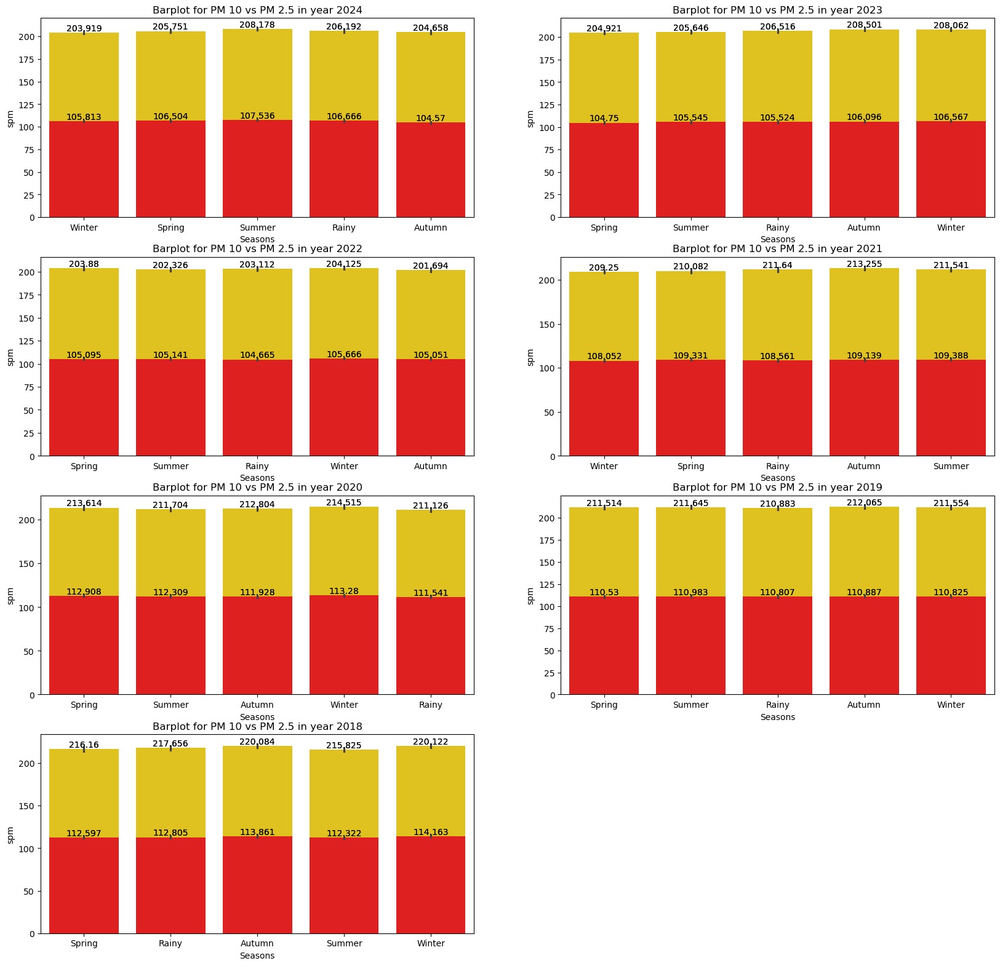

In [170]:
# How do SPM and RSPM levels compare in different seasons

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(20,100))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)

    h1=sb.barplot(data=yt,x='Seasons',y='spm',color='gold')
    h2=sb.barplot(data=yt,x='Seasons',y='rspm',color='red')

    for j in h1.containers:
        h1.bar_label(j)
    for k in h2.containers:
        h2.bar_label(k)
    plt.title(f'Barplot for PM 10 vs PM 2.5 in year {yr[i]}')

plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

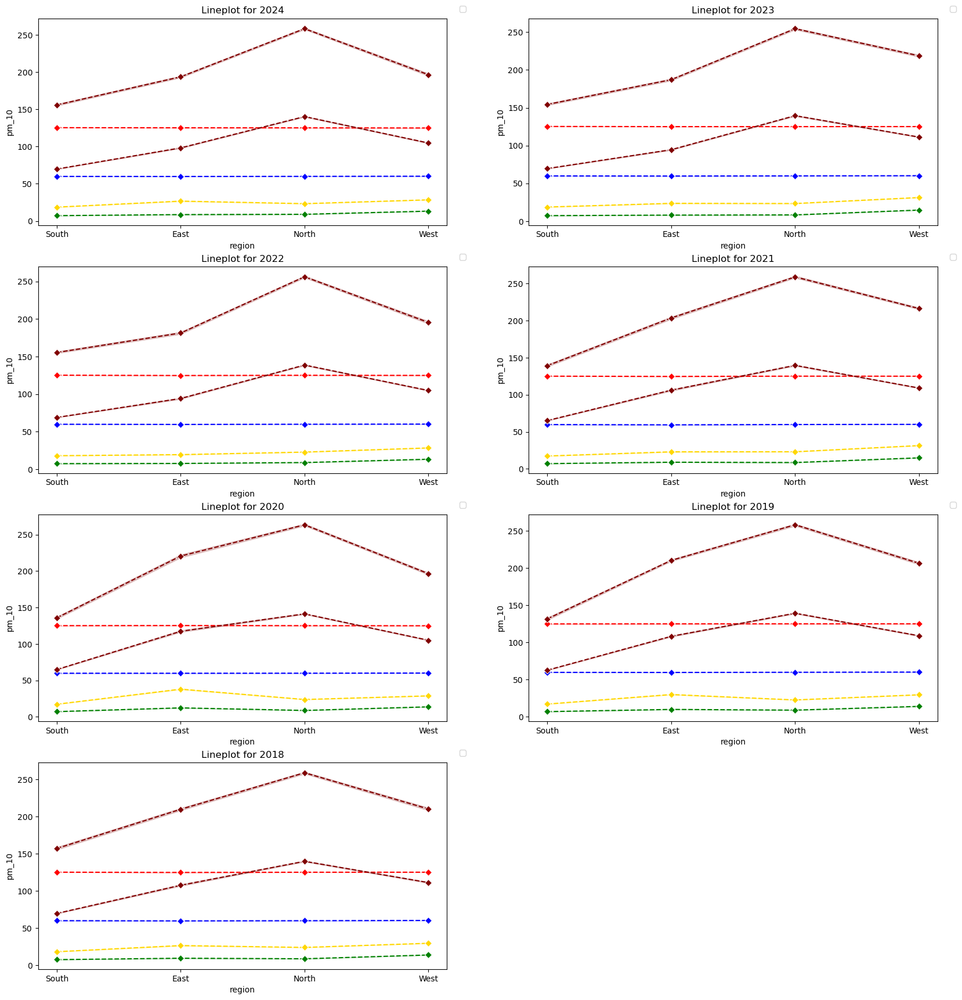

In [171]:
# Show a stacked area chart representing the total contribution of each pollutant over time.

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(20,110))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    c1=sb.lineplot(x=yt['region'],y=yt['pm_10'],color="red",marker='D',linestyle='--')
    c2=sb.lineplot(x=yt['region'],y=yt['pm_2.5'],color="blue",marker='D',linestyle='--')
    c3=sb.lineplot(x=yt['region'],y=yt['so2'],color="green",marker='D',linestyle='--')
    c4=sb.lineplot(x=yt['region'],y=yt['no2'],color="gold",marker='D',linestyle='--')
    c5=sb.lineplot(x=yt['region'],y=yt['spm'],color="maroon",marker='D',linestyle='--')
    c6=sb.lineplot(x=yt['region'],y=yt['rspm'],color="maroon",marker='D',linestyle='--')
    
    plt.title(f'Lineplot for {yr[i]}')
    plt.legend(loc=(1.03,1.03))

plt.show()

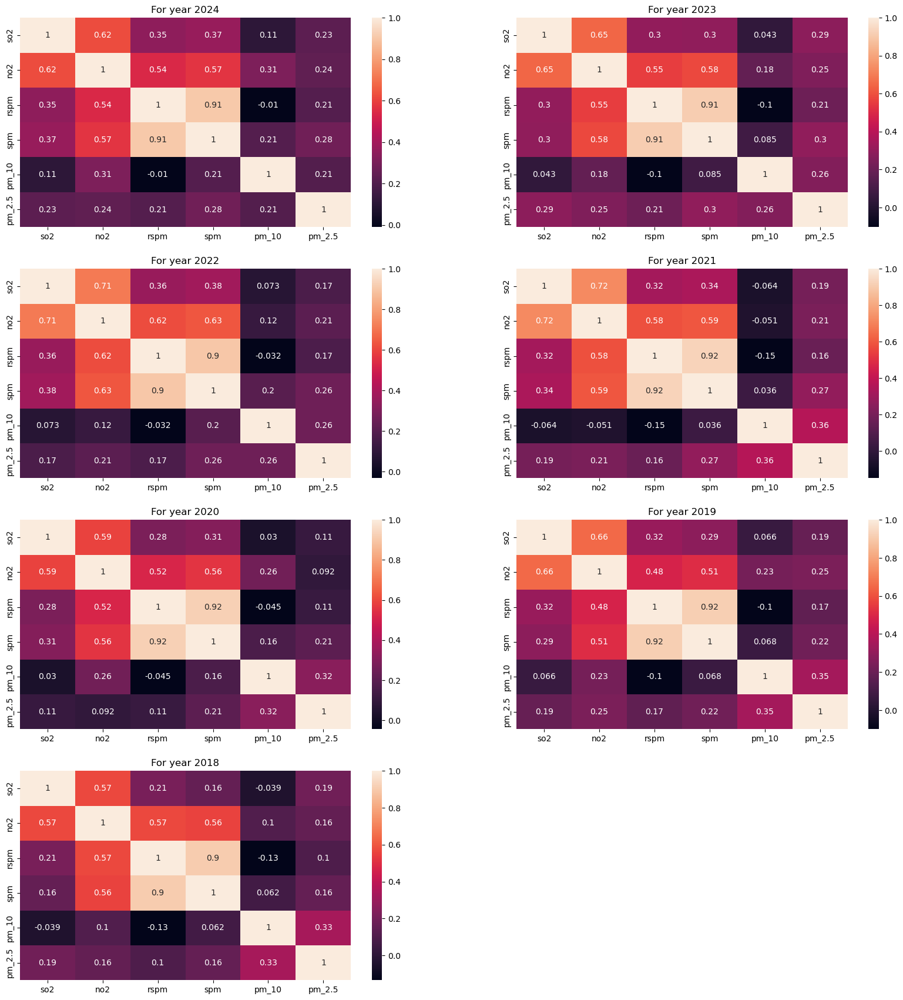

In [176]:
# Compare the concentration levels of all pollutant 

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

plt.figure(figsize=(20,110))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    sb.heatmap(yt[clm].corr(),annot=True)
    plt.title(f'For year {yr[i]}')

plt.show()

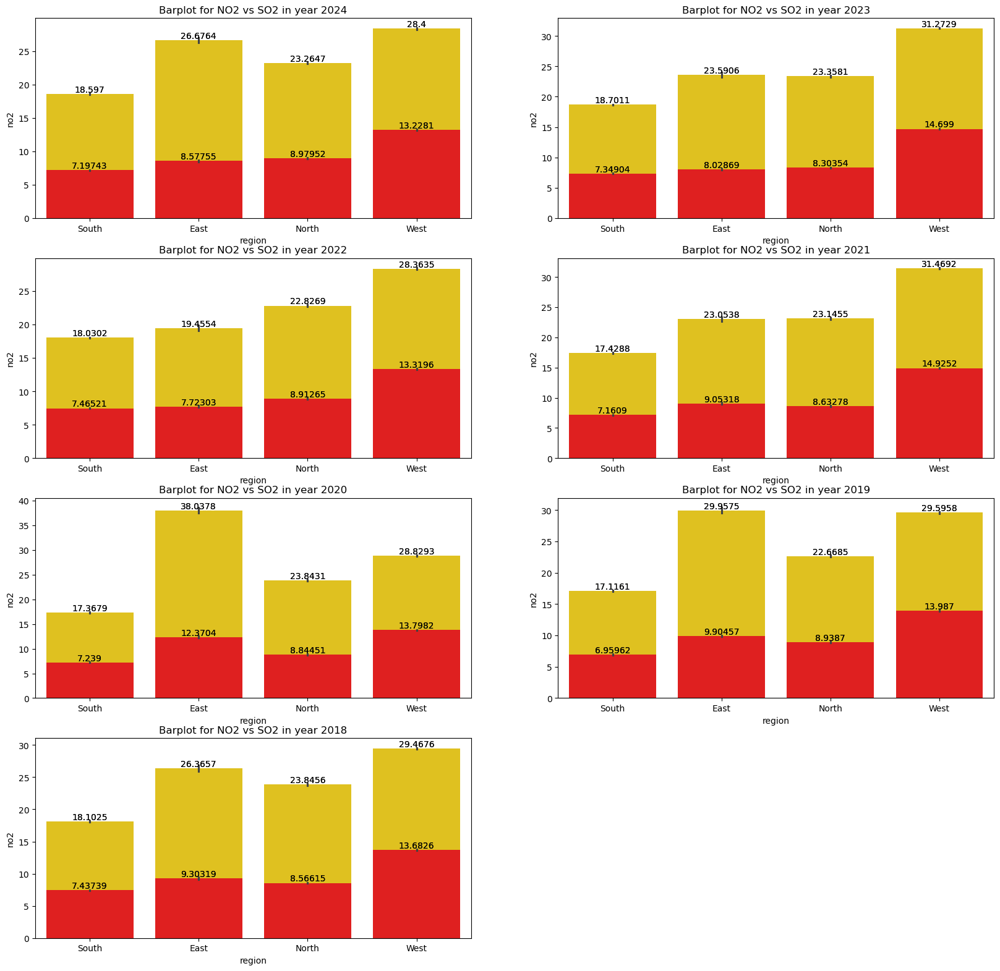

In [177]:
# How does the ratio of NO2 to SO2 vary across different region

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(20,100))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)

    h1=sb.barplot(data=yt,x='region',y='no2',color='gold')
    h2=sb.barplot(data=yt,x='region',y='so2',color='red')

    for j in h1.containers:
        h1.bar_label(j)
    for k in h2.containers:
        h2.bar_label(k)
    plt.title(f'Barplot for NO2 vs SO2 in year {yr[i]}')

plt.show()

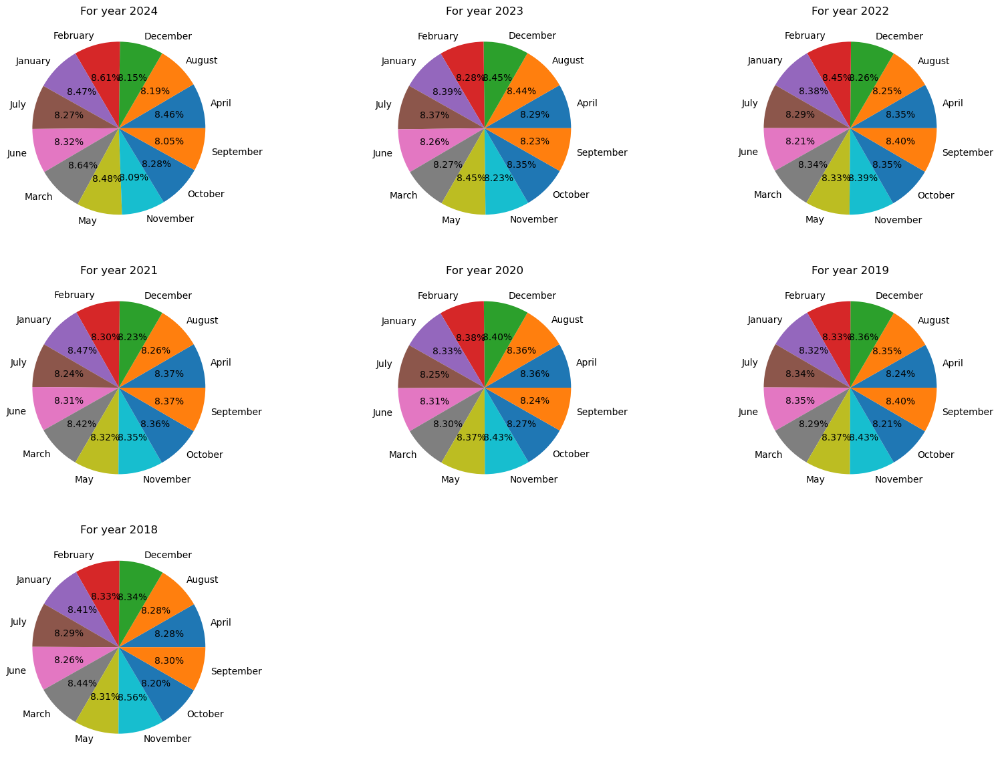

In [179]:
# Visualize how SO2 contributes to overall air quality in different month. 

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(20,100))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,3,i+1)

    st=yt.groupby(['Month'])['so2'].mean()
    plt.pie(st,labels=st.index,autopct="%0.2f%%")
    plt.title(f'For year {yr[i]}')

plt.show()

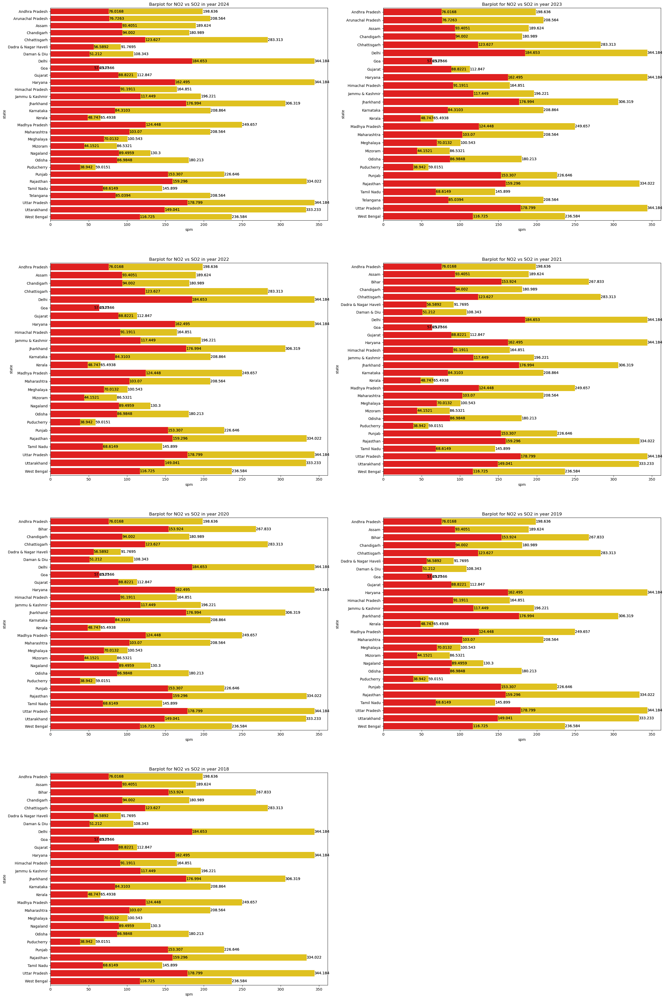

In [181]:
# Show the pollutant composition (SPM & RSPM) per state using a stacked bar char

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(30,250))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)

    h1=sb.barplot(data=yt,y='state',x='spm',color='gold')
    h2=sb.barplot(data=yt,y='state',x='rspm',color='red')

    for j in h1.containers:
        h1.bar_label(j)
    for k in h2.containers:
        h2.bar_label(k)
    plt.title(f'Barplot for NO2 vs SO2 in year {yr[i]}')

plt.show()

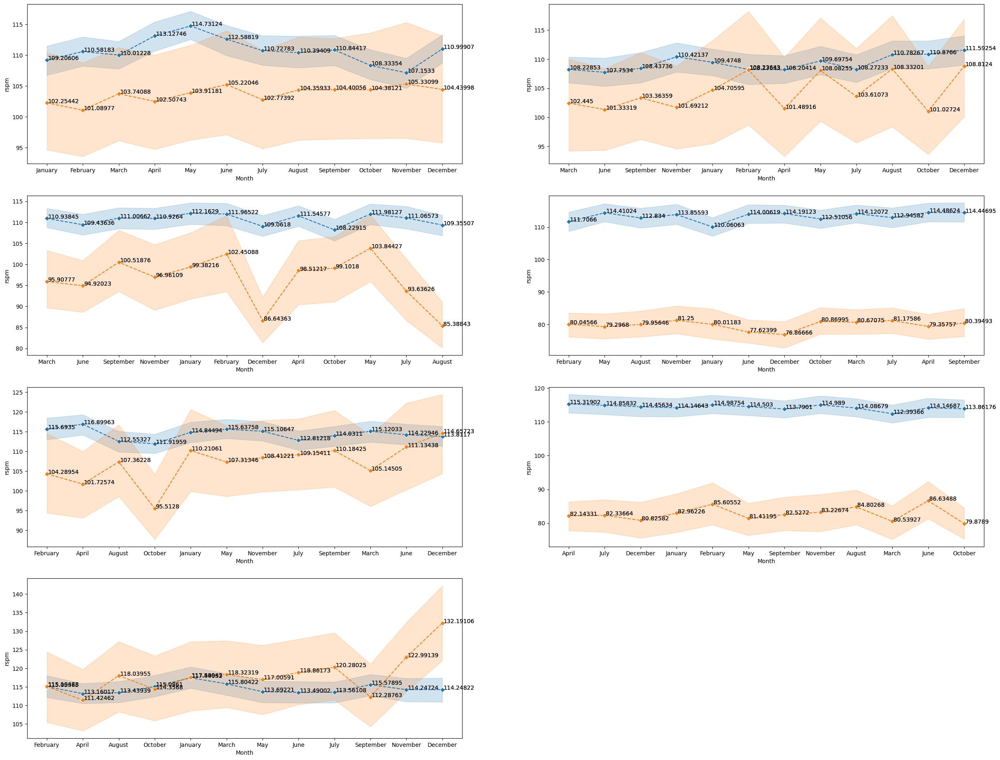

In [184]:
# How does the RSPM differ between industrial and sensitive areas Monthwise

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(30,120))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    s1=yt[yt['type']=='Industrial Area']
    s2=yt[yt['type']=='Sensitive Area']
    c1=sb.lineplot(data=s1,x='Month',y='rspm',marker='D',linestyle='--')
    c2=sb.lineplot(data=s2,x='Month',y='rspm',marker='D',linestyle='--')
    for j in c1.get_lines():
        for a,b in zip(j.get_xdata(),j.get_ydata()):
            plt.text(a+0.03,b,round(b,5))
    for k in c2.get_lines():
        for c,d in zip(k.get_xdata(),k.get_ydata()):
            plt.text(c+0.03,d,round(d,5))    

plt.show()
    

#### 4. Comparative Analysis

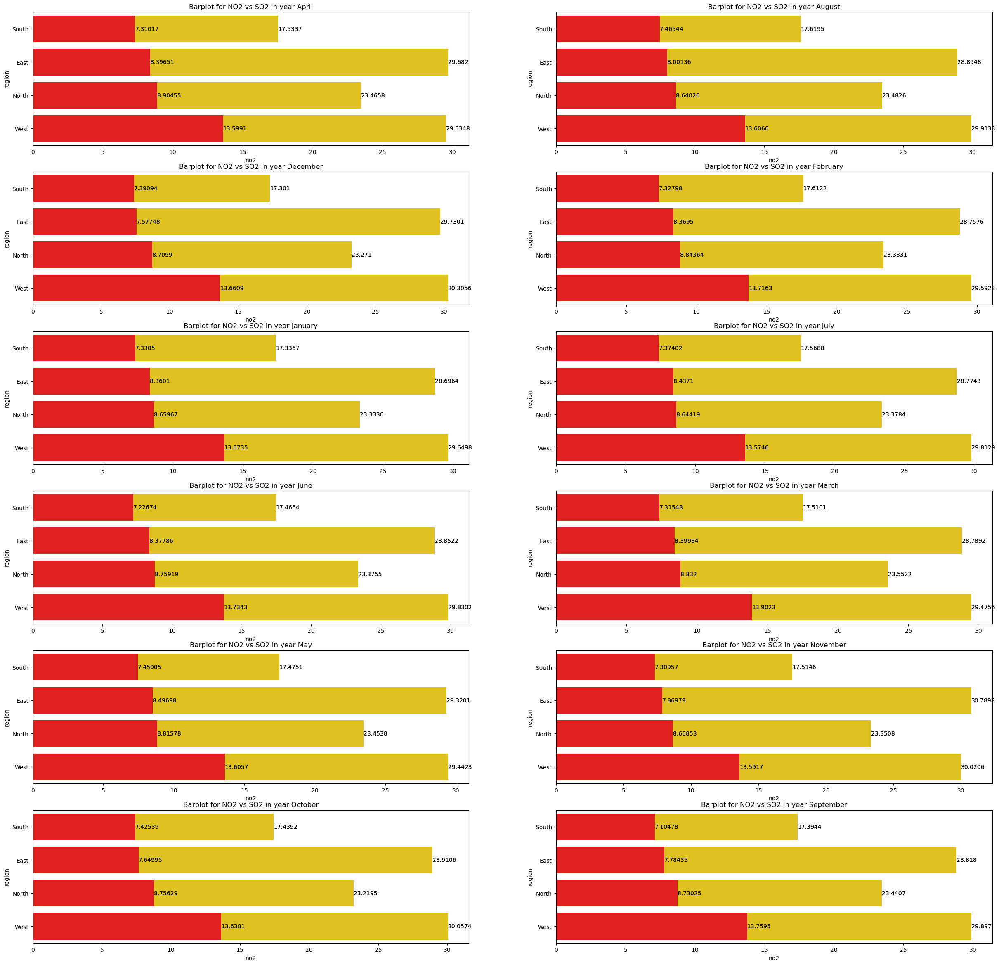

In [256]:
# Compare pollution levels SO2 and NO2 before and after lockdown periods regionwise

mn=list(df['Month'].unique())
mn.sort()

plt.figure(figsize=(30,200))
for i in range(len(mn)):
    yt=df[df['Month']==mn[i]]
    plt.subplot(40,2,i+1)
    s1=yt[yt['Year'].between(2018,2021)]
    s2=yt[yt['Year'].between(2022,2024)]
    c1=sb.barplot(data=s1,y='region',x='no2',color='gold',errorbar=('ci',0))
    c2=sb.barplot(data=s2,y='region',x='so2',color='red',errorbar=('ci',0))
    for j in c1.containers:
        c1.bar_label(j)
    for k in c2.containers:
        c2.bar_label(k)
    plt.title(f'Barplot for NO2 vs SO2 in year {mn[i]}')




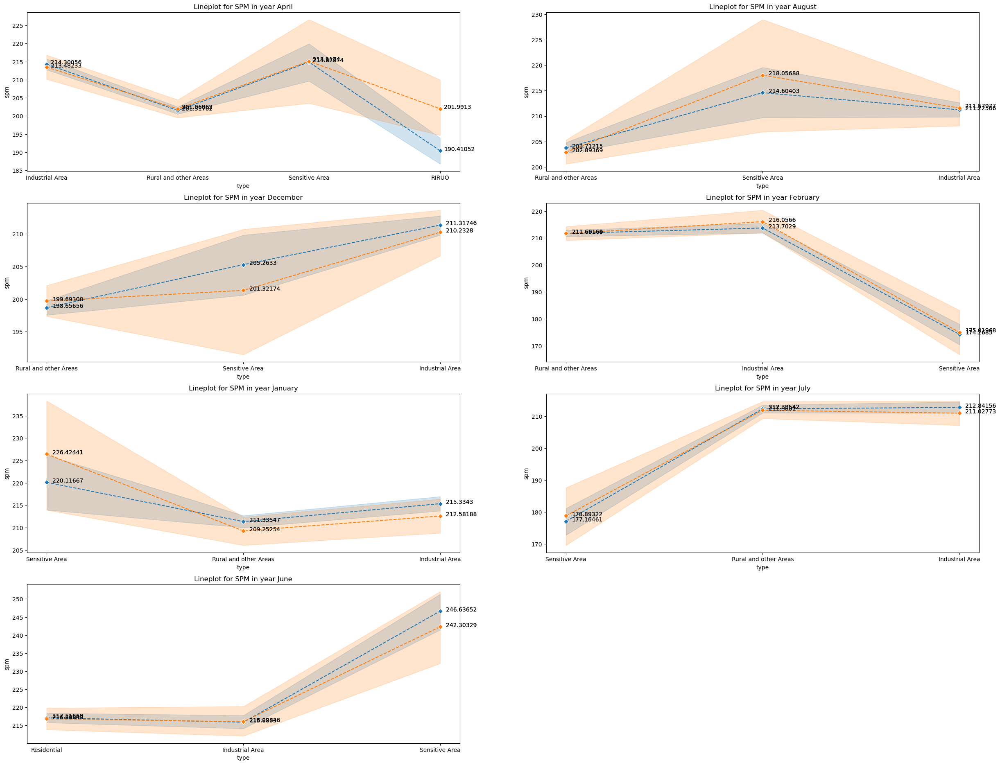

In [270]:
# How do SPM levels change during and after rainfall events zonewise

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(30,120))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    s1=yt[yt['Seasons'].isin(['Spring','Autumn','Summer','Winter'])]
    s2=yt[yt['Seasons']=='Rainy']
    c1=sb.lineplot(data=s1,x='type',y='spm',marker='D',linestyle='--')
    c2=sb.lineplot(data=s2,x='type',y='spm',marker='D',linestyle='--')
    for j in c1.get_lines():
        for a,b in zip(j.get_xdata(),j.get_ydata()):
            plt.text(a+0.03,b,round(b,5))
    for k in c2.get_lines():
        for c,d in zip(k.get_xdata(),k.get_ydata()):
            plt.text(c+0.03,d,round(d,5))    
    plt.title(f'Lineplot for SPM in year {mn[i]}')

plt.show()

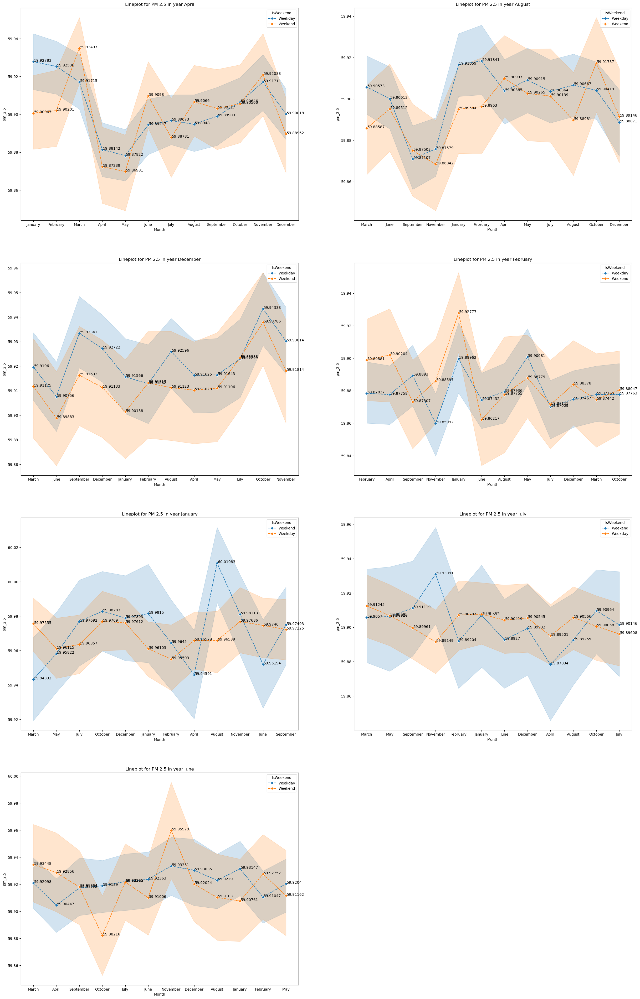

In [348]:
# Show the difference in PM 2.5 levels between weekdays and weekends based on month

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(30,250))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    c=sb.lineplot(data=yt,x='Month',y='pm_2.5',hue='IsWeekend',marker='D',linestyle='--')
    for j in c.get_lines():
        for a,b in zip(j.get_xdata(),j.get_ydata()):
            plt.text(a+0.03,b,round(b,5))
    plt.title(f'Lineplot for PM 2.5 in year {mn[i]}')
plt.show()

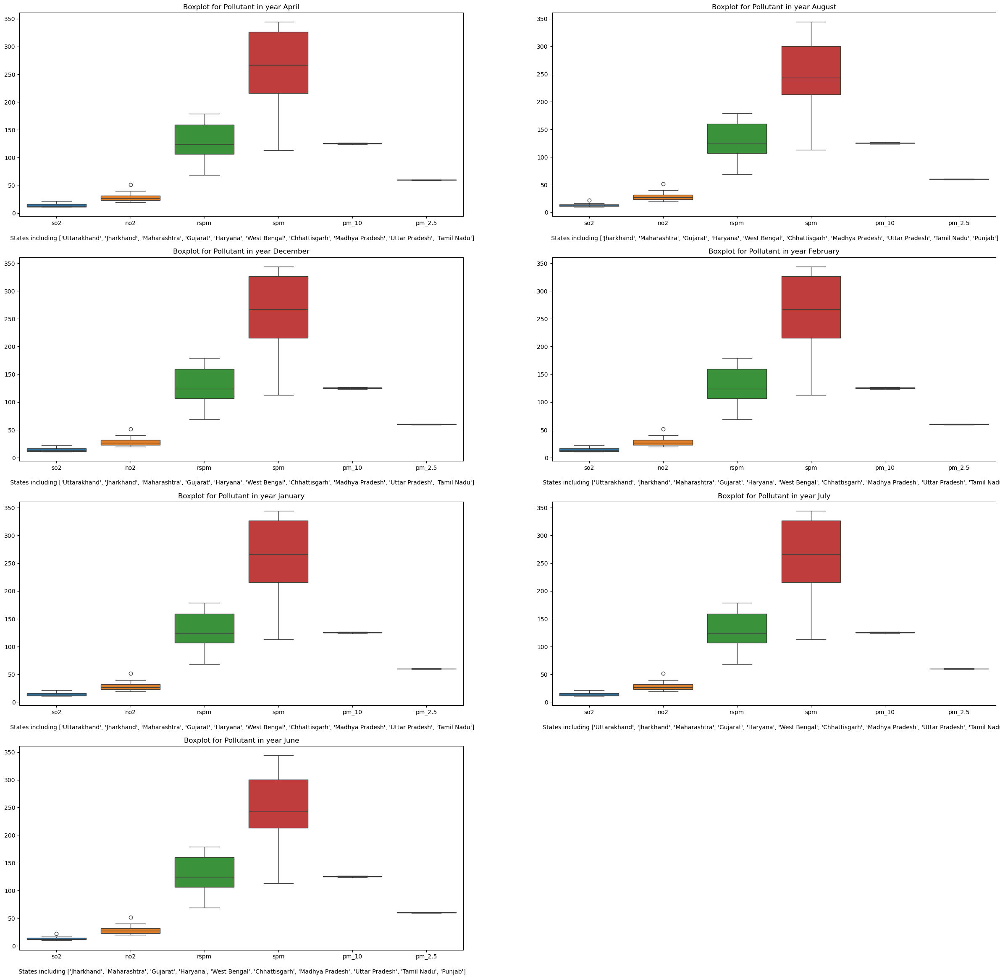

In [475]:
# What are the 5 most volatile state in terms of SPM  pollution fluctuations

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

plt.figure(figsize=(30,150))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    el=yt.groupby(['state'])[clm].mean().reset_index()
    el=el.sort_values(by=clm,ascending=False)[:10]
    sb.boxplot(el)
    plt.title(f'Boxplot for Pollutant in year {mn[i]}')
    plt.xlabel(f'\n States including {list(el['state'])}',size=10)
    
plt.show()

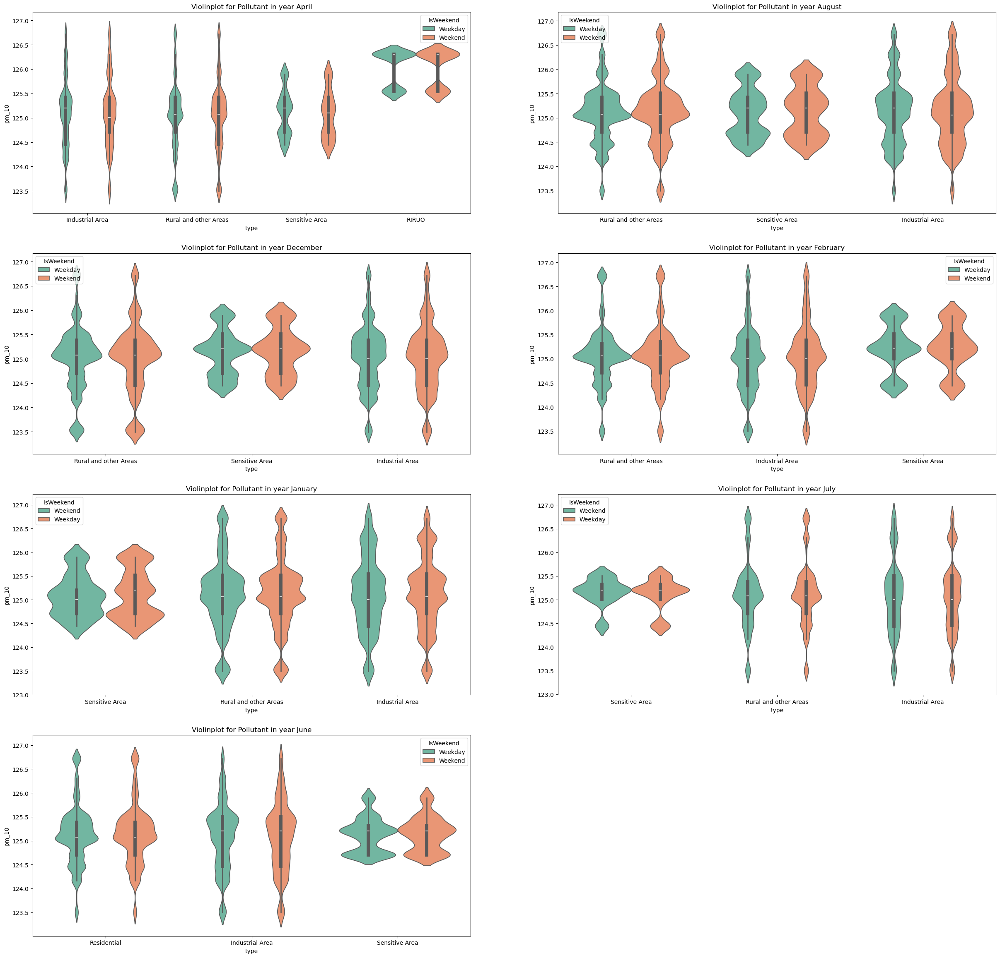

In [380]:
# Compare PM 10 pollution levels on weekends vs. weekdaysdays zonewise

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

plt.figure(figsize=(30,150))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    sb.violinplot(data=yt,x='type',y='pm_10',hue='IsWeekend',palette='Set2')
    plt.title(f'Violinplot for Pollutant in year {mn[i]}')

    
plt.show()

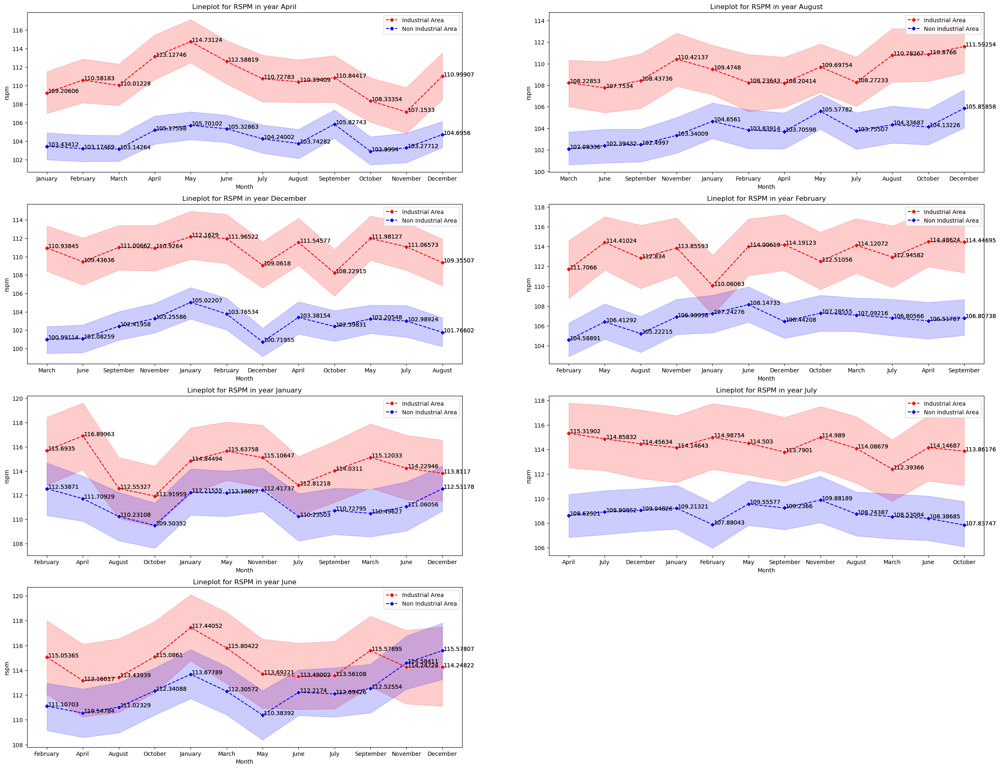

In [497]:
# Visualize the RSPM level difference between industrial and non-industrial regions month

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(30,120))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    s1=yt[yt['type']=='Industrial Area']
    s2=yt[yt['type']!='Industrial Area']
    c1=sb.lineplot(data=s1,x='Month',y='rspm',marker='D',linestyle='--',color='red',label='Industrial Area')
    c2=sb.lineplot(data=s2,x='Month',y='rspm',marker='D',linestyle='--',color='blue',label='Non Industrial Area')
    for j in c1.get_lines():
        for a,b in zip(j.get_xdata(),j.get_ydata()):
            plt.text(a+0.03,b,round(b,5))
    for k in c2.get_lines():
        for c,d in zip(k.get_xdata(),k.get_ydata()):
            plt.text(c+0.03,d,round(d,5))    
    plt.title(f'Lineplot for RSPM in year {mn[i]}')

plt.show()    


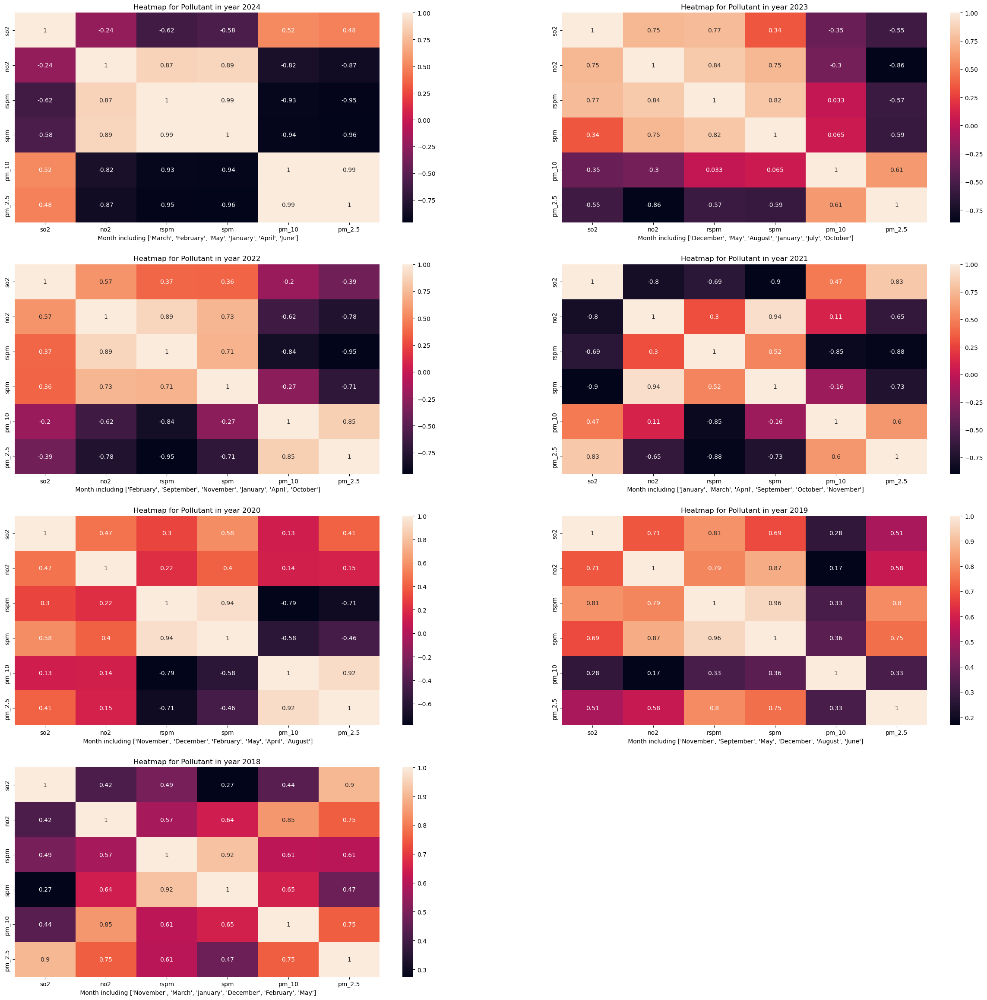

In [477]:
# What are the top 3 months with unusual pollution levels every year

yr=list(df['Year'].unique())
yr.sort(reverse=True)
clm=['so2', 'no2', 'rspm', 'spm', 'pm_10', 'pm_2.5']

plt.figure(figsize=(30,150))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    e=yt.groupby(['Month'])[clm].mean().reset_index()
    e=e.sort_values(by=clm,ascending=False)[:6]
    sb.heatmap(e[clm].corr(),annot=True)
    plt.title(f'Heatmap for Pollutant in year {yr[i]}')
    plt.xlabel(f' Month including {list(e['Month'])}',size=10)
    
plt.show()    

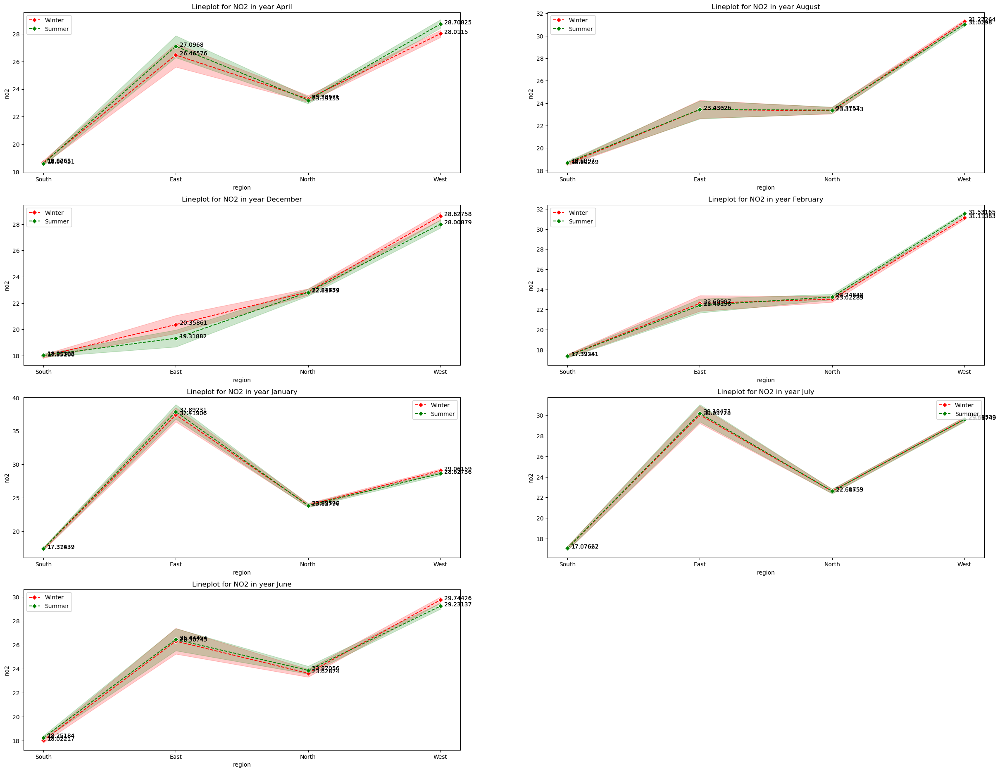

In [495]:
# How does NO2 vary between winter and summer months Regionwise? (Stacked Line Chart)

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(30,120))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    s1=yt[yt['Seasons']=='Winter']
    s2=yt[yt['Seasons']=='Summer']
    c1=sb.lineplot(data=s1,x='region',y='no2',marker='D',linestyle='--',color='red',label='Winter')
    c2=sb.lineplot(data=s2,x='region',y='no2',marker='D',linestyle='--',color='green',label='Summer')
    for j in c1.get_lines():
        for a,b in zip(j.get_xdata(),j.get_ydata()):
            plt.text(a+0.03,b,round(b,5))
    for k in c2.get_lines():
        for c,d in zip(k.get_xdata(),k.get_ydata()):
            plt.text(c+0.03,d,round(d,5))    
    plt.title(f'Lineplot for NO2 in year {mn[i]}')

plt.show()   

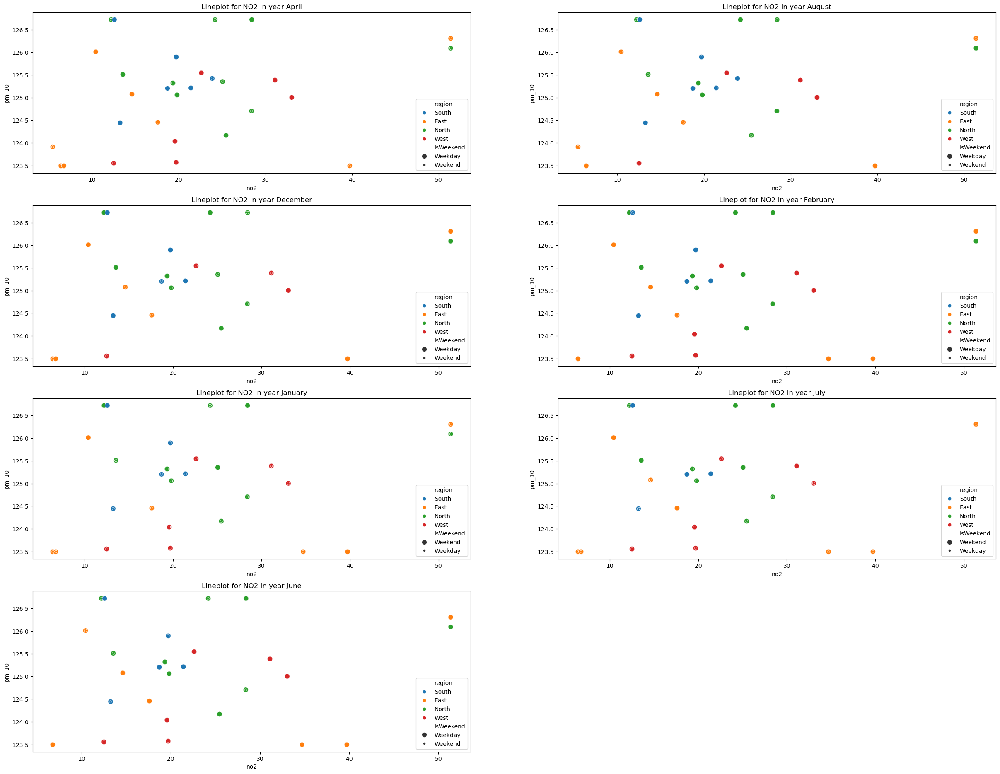

In [527]:
# Compare NO2,SPM and PM10 pollution trends statewise. 

yr=list(df['Year'].unique())
yr.sort(reverse=True)

plt.figure(figsize=(30,120))
for i in range(len(yr)):
    yt=df[df['Year']==yr[i]]
    plt.subplot(20,2,i+1)
    sb.scatterplot(data=yt,x='no2',y='pm_10',hue='region',size='IsWeekend',markers=['D','d'])
    plt.legend(loc=4)
    plt.title(f'Lineplot for NO2 in year {mn[i]}')

plt.show()   

## Divide the data into Actuall Groups (Clustering [KMean] )

In [710]:
from sklearn.cluster import KMeans

### Scaling and Encoding

In [588]:
from sklearn.preprocessing import StandardScaler,LabelEncoder

In [607]:
# Encoding

In [647]:
ws=df.dtypes[df.dtypes=='object'].index
for i in ws:
    print(i,df[i].nunique())

stn_code 276803
state 31
location 279
agency 36
type 7
location_monitoring_station 930


In [623]:
lb=LabelEncoder()
cl=['state','location','Month','Day']
for i in cl:
    df[i]=lb.fit_transform(df[i])

In [627]:
dm=pd.get_dummies(data=df,columns=['type','Qtr','IsWeekend','Seasons','region','In_ct'],drop_first=True,dtype=int)
dm.shape

(226429, 28)

In [740]:
x=dm.drop('date',axis=1)
x.shape

(226429, 27)

In [690]:
# Standardization

In [742]:
ss=StandardScaler()
x_s=ss.fit_transform(x)

In [744]:
xs=pd.DataFrame(data=x_s,columns=x.columns)
xs.shape

(226429, 27)

### Determine optimal Clusters

In [716]:
n_cls=np.arange(1,21)
wcss=[]

In [718]:
for i in n_cls:
    cs=KMeans(n_clusters=i,random_state=50)
    cs.fit(xs)
    wcss.append(cs.inertia_)

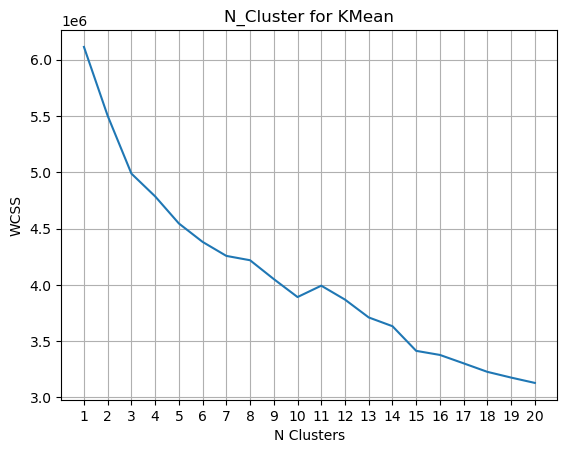

In [724]:
plt.plot(n_cls,wcss)
plt.title('N_Cluster for KMean')
plt.xlabel('N Clusters')
plt.ylabel('WCSS')
plt.xticks(n_cls)
plt.grid()
plt.show()

In [726]:
# Optimal Clusters :- 4,5,6,7

### Clustering using optimal clusters [4,5,6,7 ]

In [728]:
cls1=KMeans(n_clusters=4,random_state=50)
cls1.fit(xs)

cls2=KMeans(n_clusters=5,random_state=50)
cls2.fit(xs)

cls3=KMeans(n_clusters=6,random_state=50)
cls1.fit(xs)

cls4=KMeans(n_clusters=7,random_state=50)
cls1.fit(xs)

KMeans(n_clusters=4, random_state=50)

In [731]:
x['cls_1']=cls1.fit_predict(xs)
x['cls_2']=cls2.fit_predict(xs)
x['cls_3']=cls3.fit_predict(xs)
x['cls_4']=cls4.fit_predict(xs)


In [735]:
cls=['cls_1','cls_2','cls_3','cls_4']
for i in cls:
    print(x[i].value_counts())
    print('\n')

cls_1
0    65291
1    60562
2    59744
3    40832
Name: count, dtype: int64


cls_2
0    54665
1    50850
2    43180
3    40822
4    36912
Name: count, dtype: int64


cls_3
5    50203
0    45633
1    38711
4    33351
2    30389
3    28142
Name: count, dtype: int64


cls_4
0    45624
1    35781
4    32761
5    32648
2    30380
3    28108
6    21127
Name: count, dtype: int64




### Cluster Profiling

In [756]:
def cluster_profile(n,dt,dt_s):
    dt1=dt.mean().reset_index()
    dt1.columns=['Feature','Mean']
    
    km=KMeans(n_clusters=n,random_state=50)
    km.fit(dt_s)
    
    dt[f'Cls_{n}']=km.predict(dt_s)
    dt2=dt.groupby(f'Cls_{n}').mean().T.reset_index()
    dt2.columns=['Feature']+list(range(n))
    dt_f=pd.merge(dt1,dt2,on='Feature')
    return dt_f

In [757]:
n_cls=[4,5,6,7]

In [764]:
cls_4=cluster_profile(4,x,xs)
cls_4.head(10)

,Feature,Mean,0,1,2,3
0,state,1.735288e+01,19.770382,21.183349,13.447794,13.519690
1,location,1.323045e+02,137.871636,115.548496,138.528036,139.148952
2,so2,2.811682e-16,0.927669,0.336384,-0.800809,-0.810564
3,no2,1.606675e-17,0.994184,0.304800,-0.828602,-0.829412
4,rspm,-1.385757e-16,0.103265,1.262655,-0.828489,-0.825676
5,spm,-8.234211e-17,0.146291,1.029470,-0.714350,-0.715618
6,pm_10,-6.860504e-15,0.330072,-0.316007,-0.017092,-0.034080
7,pm_2.5,7.740158e-15,0.635312,-0.243016,-0.265576,-0.266851
8,Year,2.021318e+03,2021.108024,2021.173426,2021.510361,2021.585693
9,Month,5.531867e+00,5.538114,5.523497,5.448179,5.656740


In [766]:
cls_5=cluster_profile(5,x,xs)
cls_5.head(10)

,Feature,Mean,0,1,2,3,4
0,state,1.735288e+01,19.763414,21.156500,13.468018,13.521337,17.325070
1,location,1.323045e+02,137.683344,115.585251,138.611186,139.141419,132.432326
2,so2,2.811682e-16,0.926409,0.340296,-0.798791,-0.810780,-0.009665
3,no2,1.606675e-17,0.993091,0.303194,-0.829190,-0.829542,-0.000996
4,rspm,-1.385757e-16,0.103029,1.259855,-0.828506,-0.825920,-0.005556
5,spm,-8.234211e-17,0.145077,1.028776,-0.716317,-0.715916,-0.002389
6,pm_10,-6.860504e-15,0.331267,-0.311328,-0.016389,-0.034549,-0.004325
7,pm_2.5,7.740158e-15,0.636944,-0.245970,-0.263920,-0.266895,-0.000535
8,Year,2.021318e+03,2021.119857,2021.175851,2021.516651,2021.585542,2021.277850
9,Month,5.531867e+00,5.440684,5.405447,5.236174,5.657562,6.047952


In [767]:
cls_6=cluster_profile(6,x,xs)
cls_6.head(10)

,Feature,Mean,0,1,2,3,4,5
0,state,1.735288e+01,18.733482,10.124771,15.589391,15.698280,16.191269,24.438141
1,location,1.323045e+02,140.300966,133.529694,138.667709,139.249733,134.666097,114.777284
2,so2,2.811682e-16,1.230410,-0.685301,-0.635495,-0.650938,-0.040544,0.186530
3,no2,1.606675e-17,1.055088,-0.790202,-0.744996,-0.735860,-0.055928,0.550888
4,rspm,-1.385757e-16,-0.140893,-0.131901,-1.001582,-1.004769,-0.192061,1.526883
5,spm,-8.234211e-17,-0.144874,-0.089605,-0.824418,-0.822828,-0.177756,1.279154
6,pm_10,-6.860504e-15,0.317192,0.576651,-0.207879,-0.252392,0.044152,-0.494983
7,pm_2.5,7.740158e-15,0.531109,-0.615371,-0.169330,-0.173355,-0.133465,0.280084
8,Year,2.021318e+03,2021.151491,2021.264292,2021.580671,2021.664345,2021.271776,2021.187479
9,Month,5.531867e+00,5.442180,5.441683,5.218336,5.663705,6.043027,5.459236


In [770]:
cls_7=cluster_profile(7,x,xs)
cls_7.head(10)

,Feature,Mean,0,1,2,3,4,5,6
0,state,1.735288e+01,18.735205,9.728515,15.588381,15.694286,16.221300,26.521686,19.610356
1,location,1.323045e+02,140.328643,134.511053,138.667380,139.242137,134.648332,114.609961,116.568704
2,so2,2.811682e-16,1.230450,-0.752203,-0.635646,-0.651576,-0.084087,0.147620,0.299959
3,no2,1.606675e-17,1.055330,-0.832894,-0.744792,-0.735017,-0.084554,0.490046,0.554322
4,rspm,-1.385757e-16,-0.140821,-0.187146,-1.001584,-1.004780,-0.227067,1.621192,1.244938
5,spm,-8.234211e-17,-0.144662,-0.144024,-0.824254,-0.822158,-0.203859,1.669582,0.571475
6,pm_10,-6.860504e-15,0.317126,0.628857,-0.208331,-0.254292,0.084446,-0.116094,-1.063533
7,pm_2.5,7.740158e-15,0.530947,-0.569725,-0.169412,-0.173694,-0.091896,1.183218,-1.392945
8,Year,2.021318e+03,2021.150929,2021.384226,2021.579954,2021.662303,2021.291047,2021.177561,2020.988687
9,Month,5.531867e+00,5.443056,5.460691,5.218400,5.662409,6.048991,5.489004,5.385620
